In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
from IPython.core.display import Image, display

In [2]:
import datetime as dt
lista_dias = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
def dict_week_day(t):
    dow = t.weekday()
    d = {lista_dias[dow]:True}
    if dow<5:
        d.update({'WorkDay':True})
    else:
        d.update({'Weekend':True})
    return d
lista_mes = ['Jan', 'Feb','Mar','Apr','May','Jun','Jul','Aug', 'Sep', 'Oct', 'Nov', 'Dec']
lista_Q = ['Q1', 'Q2','Q3','Q4']

def dict_month(t):
    mes = t.month-1
    d = {lista_mes[mes]:True}
    if mes<3:
        d.update({'Q1':True})
    elif mes <6:
        d.update({'Q2':True})
    elif mes <9:
        d.update({'Q3':True})
    else:
        d.update({'Q4':True})
    return d
def dict_day(t):
    dia = t.day
    d = {str(dia):True}
    if dia<11:
        d.update({'Early':True})
    elif dia <21:
        d.update({'Mid':True})
    else:
        d.update({'Late':True})
    return d
def dict_hora(t):
    hora = t.hour
    d = {str(hora):True}
    if (hora<12) & (hora>5):
        d.update({'morning':True})
    elif hora <14:
        d.update({'noon':True})
    elif hora <17:
        d.update({'afternoon':True})
    elif hora <20:
        d.update({'evening':True})
    else:
        d.update({'night':True})
    return d

def merge_dicts_in_list(ld1, ld2):
    # ld1: lista de diccionarios (uno por cada restaurante) 
    # ld2: lista de diccionarios (uno por cada restaurante) 
    # las listas deben estar alineadas!! es decir, el elemento i de cada lista debe ser el mismo restaurante!!
    for ii, dd in enumerate(ld1):
        dd.update(ld2[ii])


# Análisis Multivariante (*MultiVariate Analysis*, MVA) (1/2)

### Aprendizaje Automático Intermedio e Ingeniería de Características

#### Febrero 2021

**Emilio Parrado Hernández, Vanessa Gómez Verdejo, Pablo Martínez Olmos**

Departamento de Teoría de la Señal y Comunicaciones

**Universidad Carlos III de Madrid**

<img src='http://www.tsc.uc3m.es/~emipar/BBVA/INTRO/img/logo_uc3m_foot.jpg' width=400 />

## Contenidos que se van a tratar a lo largo de la sesión

- MVA no supervisado:
    - *Principal Component Analysis*
    - *Principal Component Analysis* disperso
    - *Kernel Principal Component Analysis*

- MVA para regresión:
    - Regresión con componentes principales
    - *Partial Least Squares*
    

<img src='http://www.tsc.uc3m.es/~emipar/BBVA/INTRO/img/logo_uc3m_foot.jpg' width=400 />

# 0. Repaso de autovalores y autovectores

Dada una matriz cuadrada $X$ de tamaño $p\times p$ definimos sus:

- Autovectores son aquellos **vectores** $\mathbf u_k$ de tamaño $p$ que verifican que
$$
 X \mathbf u_k = \lambda_k \mathbf u_k
$$
a la constante $\lambda_k$ se la denomina **autovalor** asociado al autovector $\mathbf u_k$.
Los autovectores son **ortogonales**

$$
\mathbf u_k^\top \mathbf u_j = \left \{ \begin{array}{ll} 1 & \mbox{ si } k=j \\ 0 & \mbox{ si } k\ne j \end{array} \right.
$$

Una matriz simétrica $C$ de tamaño $p\times p$ puede  factorizar como
$$
C = U\Lambda U^\top
$$
- $\Lambda$ es una matriz diagonal con los autovalores de $C$
- $U$ es una matriz $p\times p$ cuyas **columnas** son los autovectores de $C$

# 1. Introducción

Este bloque del curso está a caballo entre la presentación de nuevos modelos de aprendizaje automático y la extracción de características sintéticas. Los métodos de extracción de características que vamos a analizar en esta sesión tienen en común que conllevan realizar **transformaciones lineales** del espacio de entrada. Respecto a los métodos de síntesis de características que vimos en la sesión pasada presentan dos aspectos propios:

- la **ventaja** de que las transformaciones lineales son **más fáciles de interpretar** e interiorizar que muchas de las técnicas de extracción de características sintéticas que vimos el otro día, y por lo menos son más fáciles de **explicar**.

- tienen una **conexión sólida con la estadística** y se han estudiado más (al menos académicamente) porque llevan más tiempo siendo utilizadas.

- en casos en que manejar únicamente transformaciones lineales sea muy limitante, vamos a ver cómo el **truco del kernel** nos va a permitir extender estos métodos a escenarios que demanden procesamientos no lineales de modo sistemático.

<img src='http://www.tsc.uc3m.es/~emipar/BBVA/INTRO/img/logo_uc3m_foot.jpg' width=400 />

## 1.1 Manifolds

En la sesión de *embeddings* anticipamos que en muchas ocasiones existen colienalidades y otras interdependencias entre las variables de entrada que traen como consecuencia el hecho de que los datos en realidad vivan en un subespacio de dimensión efectiva menor que la cardinalidad del conjunto de variables de entrada. 

Técnicamente estos espacios de dimensión reducida se conocen como *manifolds*. El objetivo de las metodologías que vamos a ver en estas dos sesiones es capturar estas estructuras (*manifolds*) subyacentes en el conjunto de datos y explotarlas para construir modelos de clasificación o regresión más robustos.

### Ejemplos de estructuras subyacentes a los datos
    
<img align="center" src="http://www.tsc.uc3m.es/~emipar/NOTEBOOKS/PCA_ML_health/pca1.png" width="100%" >
    
#### Estructuras en dígitos manuscritos
    
<img align="center" src="http://www.tsc.uc3m.es/~emipar/NOTEBOOKS/PCA_ML_health/pca2.png" width="100%" >
    
#### Estructuras en imágenes
    
<img align="center" src="http://www.tsc.uc3m.es/~emipar/NOTEBOOKS/PCA_ML_health/pca3.png" width="100%" >

<img src='http://www.tsc.uc3m.es/~emipar/BBVA/INTRO/img/logo_uc3m_foot.jpg' width=400 />

## 1.2 La base de datos de dígitos manuscritos de MNIST

Esta es otra de las bases de datos *benchmark* clásicas. Una de las primeras aplicaciones industriales del *machine learning* fue el reconocimiento de dígitos manuscritos para enrutar cartas en el servicio postal de Estados Unidos (US Postal) a través del reconocimiento automático del código postal.

La base de datos comprende unos 60k registros, consistentes en digitalizaciones de dígitos (0-9) manuscritos por diversos autores. Hay contribuciones de estudiantes de institutos y de funcionarios rellenando formularios con casillas a tal efecto.

Los dígitos están escaneados y las imágenes resultantes digitalizadas en escala de grises en resolución $28\times 28$ píxeles. Por tanto cada observación es un array de $28\times 28 = 784$ valores entre 0 y 255 (nivel de gris codificado con 8 bits)

A priori no parece una base de datos muy aplicable en todos los escenarios pero si la miramos en **abstracto** podemos extraer las siguientes propiedades:
- Si escalamos los niveles de grises entre 0 y 255 podemos considerar el valor de cada pixel como un *score* positivo. Esto puede asemejarse a situaciones donde cada observación fuese un cliente y cada variable la frecuencia con la que solicita un producto, o la apetencia que tiene sobre ese producto
- Hay 10 etiquetas (una por cada dígito) lo que nos lleva a la situación de que en la base de datos hay al menos 10 grupos naturales que deberían ser descubiertos en modo no supervisado 
- Es razonablemente disperso: el la cuadrícula de 784 posiciones hay bastantes ceros
- Aparecen correlaciones espaciales entre píxeles. En la analogía con los datos de inteligencia comercial esta propiedad podría traducirse en que existen grupos de clientes definidos por fuertes correlaciones entre las variables correspondientes a algunos productos.
- Y es un problema que entendemos todos...

La siguiente celda carga 10K dígitos y realiza los preprocesamientos habituales para trabajar con ellos.

In [141]:
data = np.loadtxt("mnist_test.csv", 
                       delimiter=",") 
fac = 0.99 / 255
X=np.asfarray(data[:, 1:]) * fac + 0.01
Y = np.array([int(cc) for cc in data[:, :1]])
print("Cargados {0:d} dígitos".format(X.shape[0]))
print("")
for cc in range(10):
    print("El dígito {0:d} tiene {1:d} ejemplos".format(cc,np.sum(Y==cc)))

Cargados 10000 dígitos

El dígito 0 tiene 980 ejemplos
El dígito 1 tiene 1135 ejemplos
El dígito 2 tiene 1032 ejemplos
El dígito 3 tiene 1010 ejemplos
El dígito 4 tiene 982 ejemplos
El dígito 5 tiene 892 ejemplos
El dígito 6 tiene 958 ejemplos
El dígito 7 tiene 1028 ejemplos
El dígito 8 tiene 974 ejemplos
El dígito 9 tiene 1009 ejemplos


En primer lugar vamos a trabajar con los ejemplos del 5.
Las siguientes celdas representan algunos de los ejemplos de este dígito.

In [73]:
cincos = np.where(Y==5)[0]
print(X[cincos[0],:])

[0.01       0.01       0.01       0.01       0.01       0.01
 0.01       0.01       0.01       0.01       0.01       0.01
 0.01       0.01       0.01       0.01       0.01       0.01
 0.01       0.01       0.01       0.01       0.01       0.01
 0.01       0.01       0.01       0.01       0.01       0.01
 0.01       0.01       0.01       0.01       0.01       0.01
 0.01       0.01       0.01       0.01       0.01       0.01
 0.01       0.01       0.01       0.01       0.01       0.01
 0.01       0.01       0.01       0.01       0.01       0.01
 0.01       0.01       0.01       0.01       0.01       0.01
 0.01       0.01       0.01       0.01       0.01       0.01
 0.01       0.01       0.01       0.01       0.01       0.01
 0.01       0.01       0.01       0.01       0.01       0.01
 0.01       0.01       0.01       0.01       0.01       0.01
 0.01       0.01       0.01       0.01       0.01       0.01
 0.01       0.01       0.01       0.01       0.01       0.01
 0.01       0.01       0

Histograma del nivel de gris (entre 0 y 1) de los píxeles del primer 5 de la lista

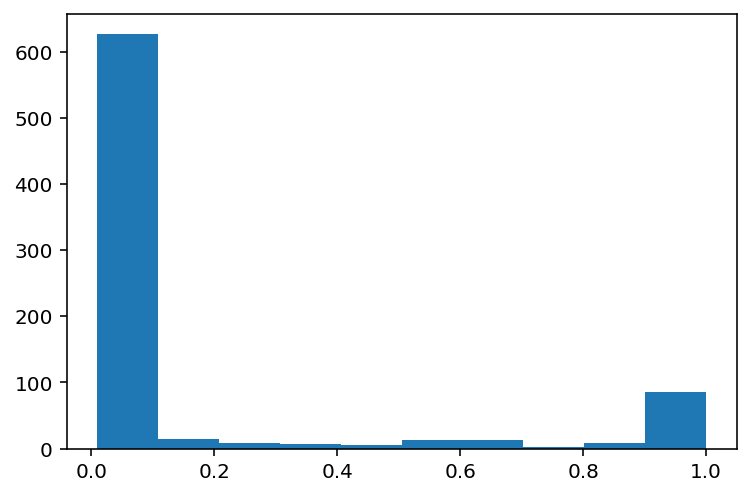

In [78]:
plt.figure()
_=plt.hist(X[cincos[0],:],10)

In [74]:
import matplotlib.pyplot as plt

100 ejemplos del dígito 5

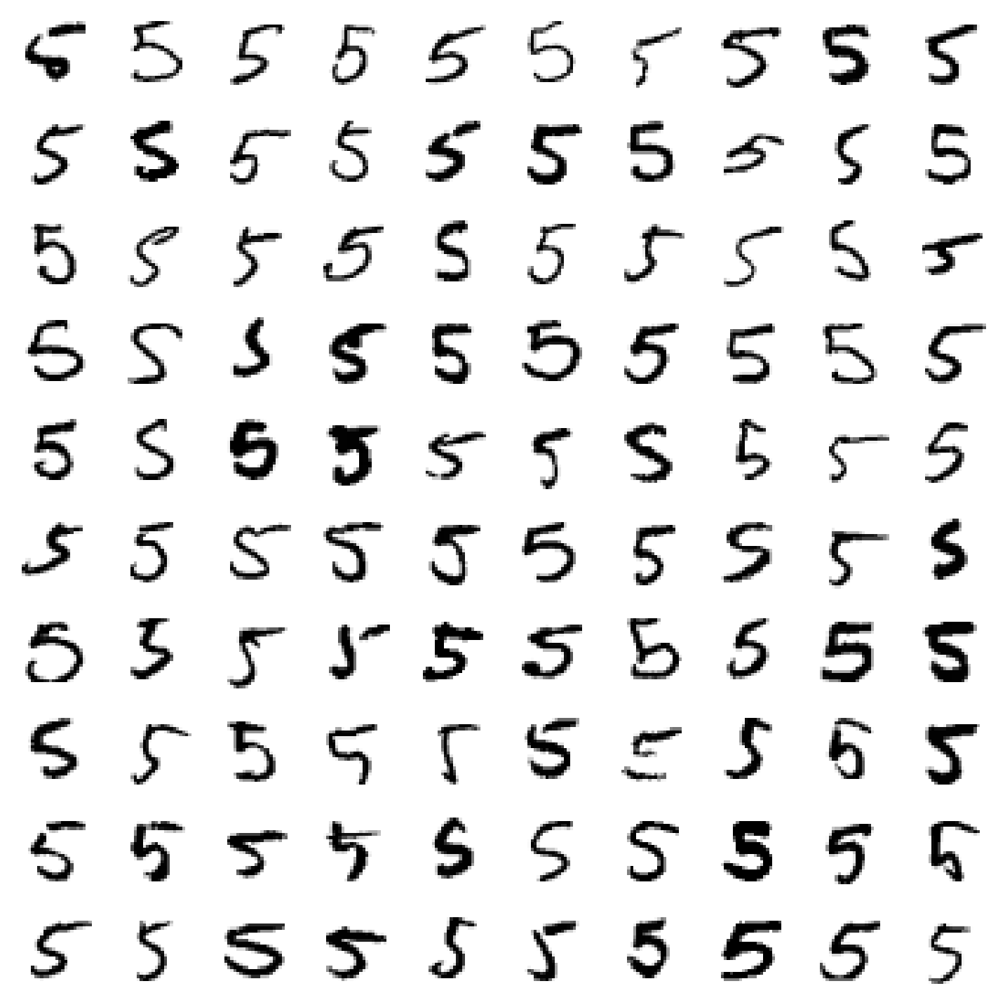

In [75]:
nrows = 10
ncols = 10
ff,aa = plt.subplots(nrows, ncols,figsize=(10,10))
ii = 0
for rr in range(nrows):
    for cc in range(ncols):
        aa[rr][cc].set_axis_off()
        aa[rr][cc].imshow(X[cincos[ii]].reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')
        ii += 1
ff.tight_layout()    
X5 = X[cincos[:100],:]

Si representamos gráficamente la matriz de covarianzas de estos casai 1000 cincos, y el patrón de las varianzas de cada píxel vemos que efectivamente podemos plantearnos que estos dígitos viven en un espacio de dimensión efectiva menor que 784.

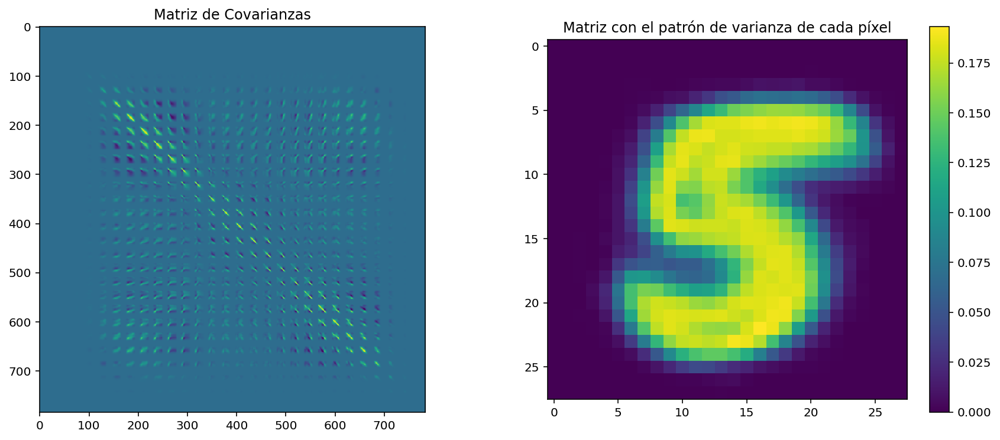

In [85]:
C5 = np.cov(X[cincos,:], rowvar=False)
ff,aa = plt.subplots(1,2,figsize=(15,6))
aa[0].imshow(C5,interpolation='nearest')
aa[0].set_title('Matriz de Covarianzas')

Var5 = np.var(X[cincos,:],0)
vv=aa[1].imshow(Var5.reshape(28,28),interpolation='nearest')
aa[1].set_title('Matriz con el patrón de varianza de cada píxel')
_=ff.colorbar(vv,ax=aa[1])

Cuantos más elementos fuera de la diagonal de la matriz de covarianzas tengan valores representativos, menor será la dimensión efectiva de los datos (por las colinealidades).

Ahora vamos a *complicar* el conjunto de datos añadiendo los 6s.

In [86]:
seis = np.where(Y==6)[0]
print("Hay {0:d} seises".format(len(seis)))
cinco_seis = np.hstack((cincos[:50], seis[:50]))
X56 = X[cinco_seis,:]

Hay 958 seises


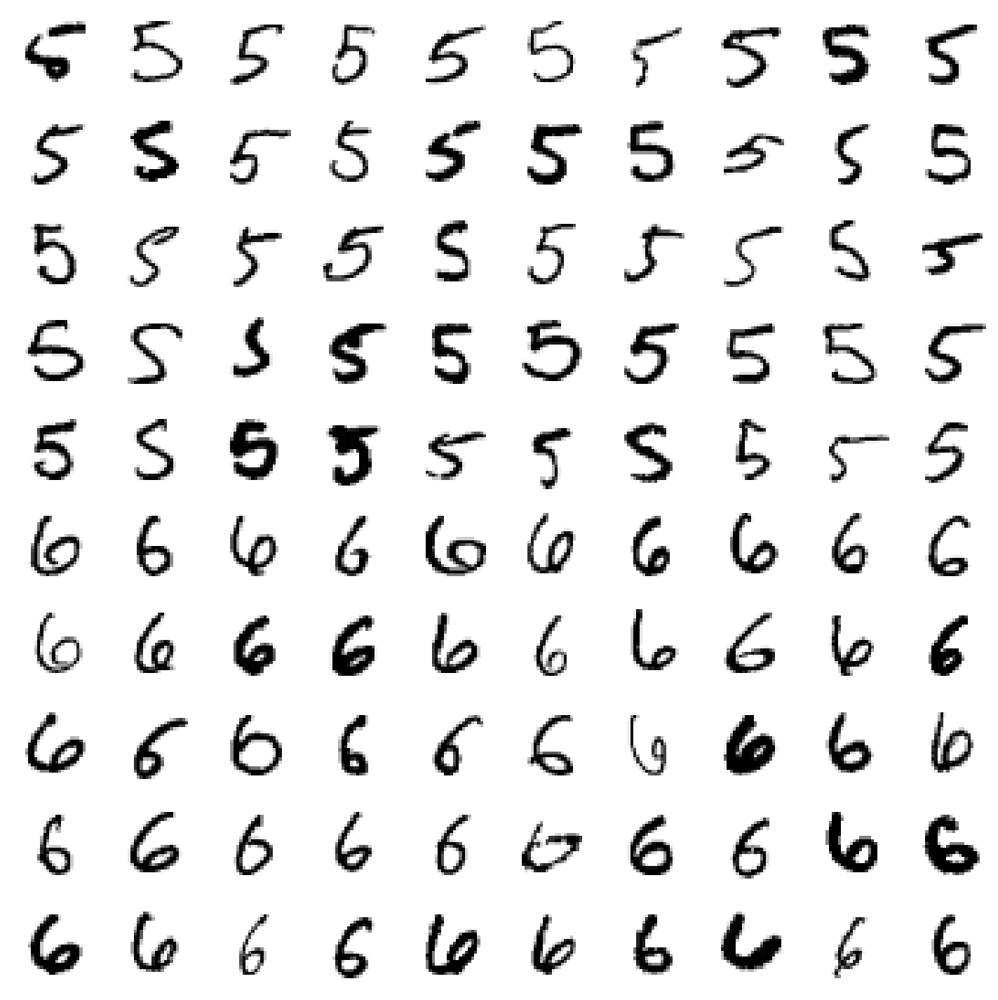

In [87]:
nrows = 10
ncols = 10
ff,aa = plt.subplots(nrows, ncols,figsize=(10,10))
ii = 0
for rr in range(nrows):
    for cc in range(ncols):
        aa[rr][cc].set_axis_off()
        aa[rr][cc].imshow(X[cinco_seis[ii]].reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')
        ii += 1
ff.tight_layout()    

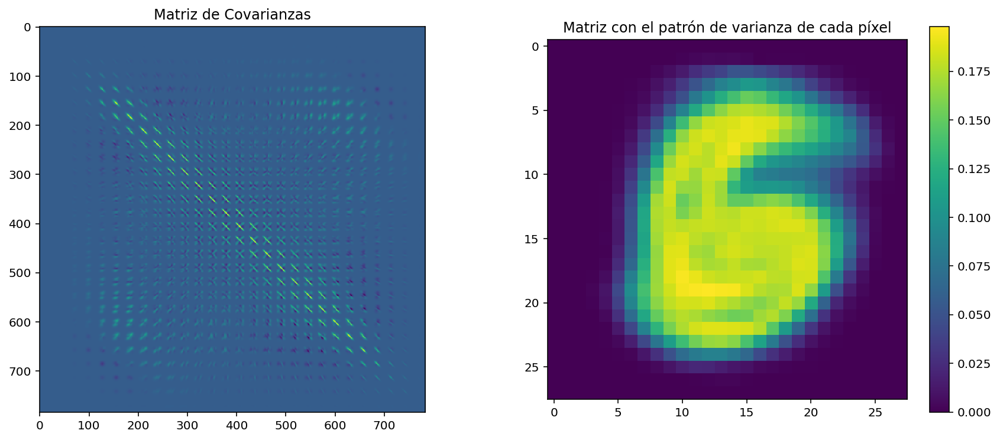

In [97]:
C6 = np.cov(X[np.hstack((cincos,seis)),:], rowvar=False)
ff,aa = plt.subplots(1,2,figsize=(15,6))
aa[0].imshow(C,interpolation='nearest')
aa[0].set_title('Matriz de Covarianzas')
Var = np.var(X[np.hstack((cincos,seis)),:],0)
vv=aa[1].imshow(Var.reshape(28,28),interpolation='nearest')
aa[1].set_title('Matriz con el patrón de varianza de cada píxel')
_=ff.colorbar(vv,ax=aa[1])

Podemos ver resultados cualitativamente diferentes si juntamos 5s y 1s

Hay 1135 unos


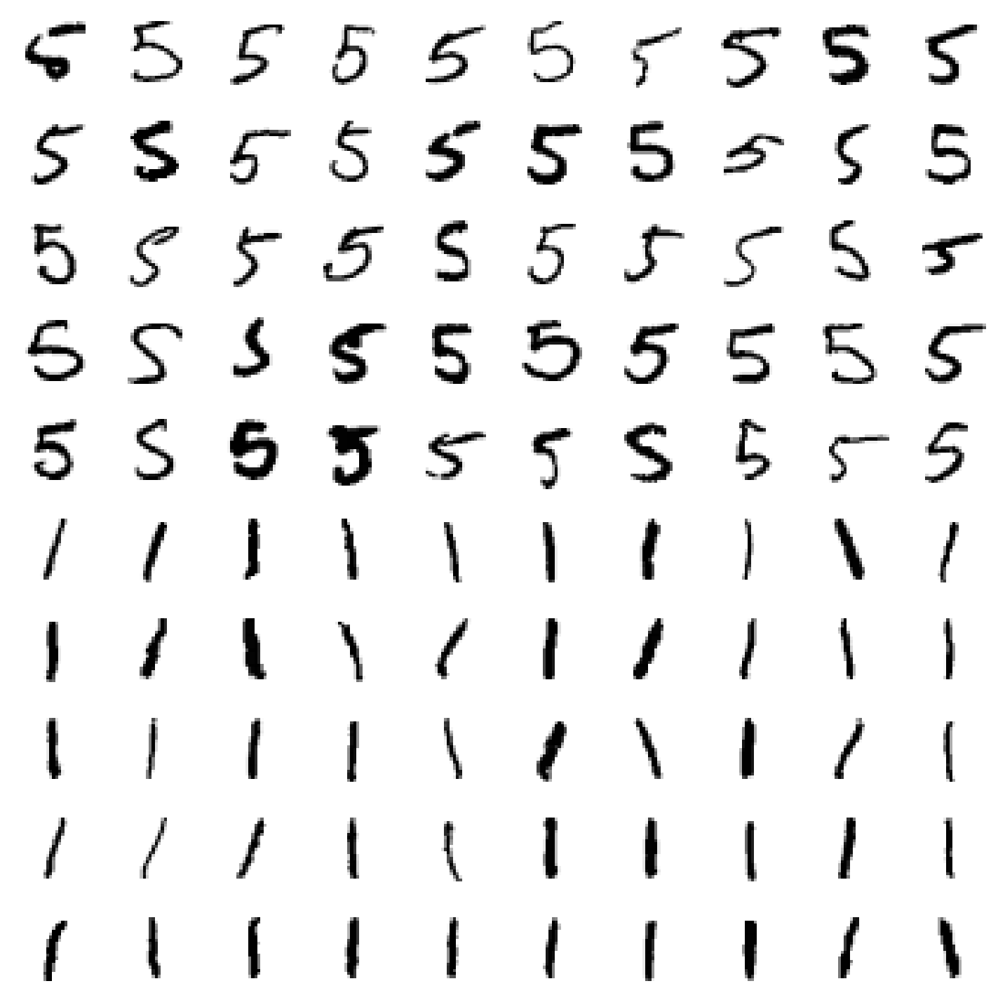

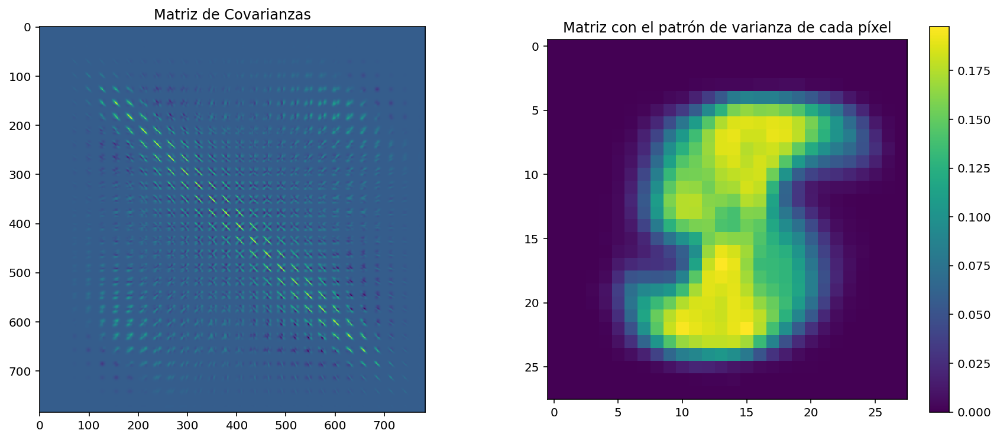

In [96]:
unos = np.where(Y==1)[0]
print("Hay {0:d} unos".format(len(unos)))
cinco_unos = np.hstack((cincos[:50], unos[:50]))
nrows = 10
ncols = 10
ff,aa = plt.subplots(nrows, ncols,figsize=(10,10))
ii = 0
for rr in range(nrows):
    for cc in range(ncols):
        aa[rr][cc].set_axis_off()
        aa[rr][cc].imshow(X[cinco_unos[ii]].reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')
        ii += 1
ff.tight_layout()  

C1 = np.cov(X[np.hstack((cincos,unos)),:], rowvar=False)
ff,aa = plt.subplots(1,2,figsize=(15,6))
aa[0].imshow(C,interpolation='nearest')
aa[0].set_title('Matriz de Covarianzas')
Var = np.var(X[np.hstack((cincos,unos)),:],0)
vv=aa[1].imshow(Var.reshape(28,28),interpolation='nearest')
aa[1].set_title('Matriz con el patrón de varianza de cada píxel')
_=ff.colorbar(vv,ax=aa[1])

Y juntar los demás dígitos

In [92]:
todos = []
for cc in range(10):
    todos += (np.where(Y==cc)[0][:10]).tolist()
todos = np.array(todos)

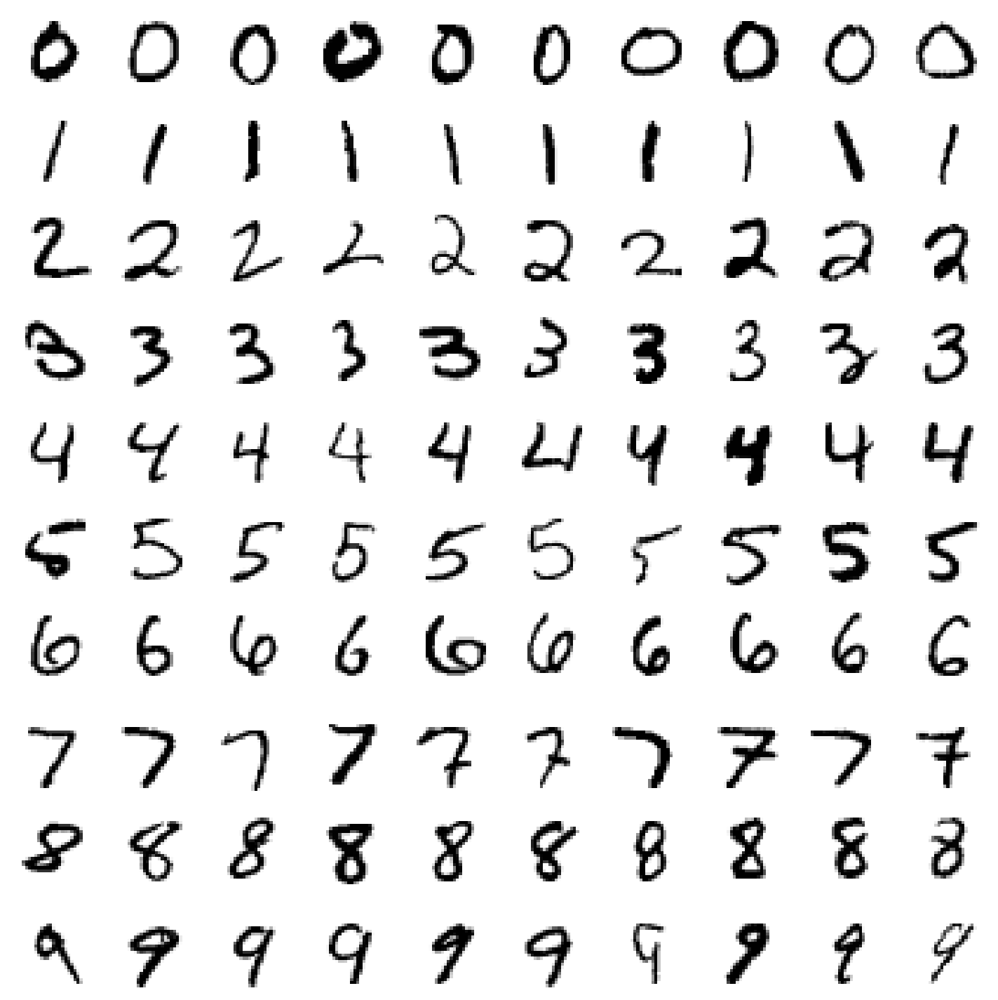

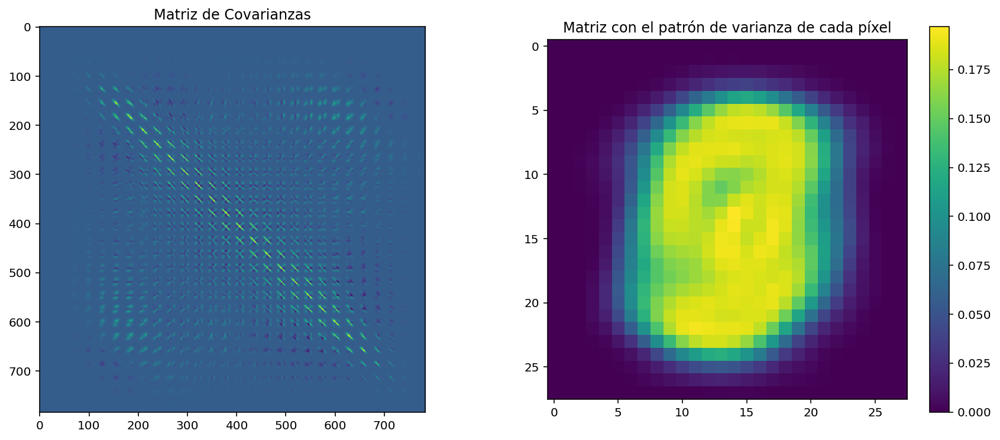

In [98]:
nrows = 10
ncols = 10
ff,aa = plt.subplots(nrows, ncols,figsize=(10,10))
ii = 0
for rr in range(nrows):
    for cc in range(ncols):
        aa[rr][cc].set_axis_off()
        aa[rr][cc].imshow(X[todos[ii]].reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')
        ii += 1
ff.tight_layout()  

CA = np.cov(X, rowvar=False)
ff,aa = plt.subplots(1,2,figsize=(15,6))
aa[0].imshow(C,interpolation='nearest')
aa[0].set_title('Matriz de Covarianzas')
Var = np.var(X,0)
vv=aa[1].imshow(Var.reshape(28,28),interpolation='nearest')
aa[1].set_title('Matriz con el patrón de varianza de cada píxel')
_=ff.colorbar(vv,ax=aa[1])

Aumentar el rango de dígitos que se manejan no hace que aumente mucho la percepción de la dimensionalidad del *manifold*.

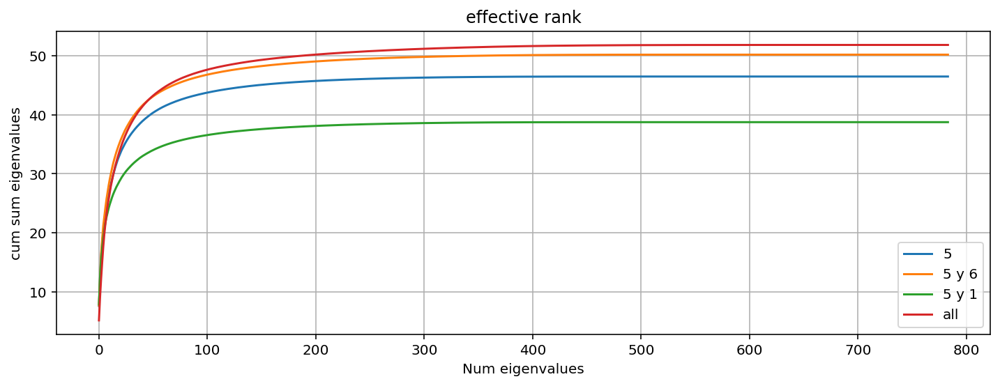

In [105]:
eigs5,_ = np.linalg.eigh(0.5*(C5+C5.T))
eigs1,_ = np.linalg.eigh(0.5*(C1+C1.T))
eigs6,_ = np.linalg.eigh(0.5*(C6+C6.T))
eigsA,_ = np.linalg.eigh(0.5*(CA+CA.T))

plt.figure(figsize=(12,4))
plt.plot(np.cumsum(eigs5[::-1]), label='5')
plt.plot(np.cumsum(eigs6[::-1]), label='5 y 6')
plt.plot(np.cumsum(eigs1[::-1]), label='5 y 1')
plt.plot(np.cumsum(eigsA[::-1]), label='all')
plt.legend()
plt.grid()
plt.xlabel('Num eigenvalues')
plt.ylabel('cum sum eigenvalues')
_=plt.title('effective rank')

# 2. Análisis en componentes principales (PCA)

El **análisis en componentes principales** (*Principal Component Analysis*, PCA) es quizá uno de las técnicas de análisis de datos más conocida. Posiblemente sea el preprocesamiento más aconsejado de la historia del aprendizaje automático, en seria competencia con KMedias. Las aplicaciones típicas de PCA son:
- reducción de la dimensionalidad
- compresión de la información (con pérdidas)
- extracción de características
- visualización de datos


Si partimos de un conjunto de $N$ observaciones en $p$ dimensiones, el **objetivo de PCA** es 
encontrar una  **transformación lineal** que proyecte los datos a un **subespacio** de menor dimensión $q\le p$ pero **conservando la mayor cantidad de la varianza** que haya en los datos originales como sea posible. Conservar la varianza es la expresión estadística para minimizar la pérdida de información contenida en los datos, ya que esta información necesariamente tiene que estar relacionada con la varianza: 0 varianza implica no información.


<img src="http://www.tsc.uc3m.es/~vanessa/Figs_notebooks/ML/PCA/PCA_1.png" width="40%" >

Si consideramos que las observaciones están almacenadas en una matriz $X$ de tamaño $N \times p$, el objetivo de PCA puede escribirse como encontar la **matriz de proyección** $U$ de tamaño $q \times p$ que transforme las filas de $X$ en las filas de $Z$, la matriz con los datos transformados, de tamaño $N\times q$, con $q\le p$

$$ Z = XU^\top$$

Cada una de las $q$ filas de $U$ es una **componente principal**, y proporciona una nueva característica para representar las observaciones en el espacio proyectado: las componentes  principales sirven como **base de vectores** en el espacio proyectado.

El PCA es un método **no supervisado**, no se necesitan *targets* para calcular el PCA de los datos.


La manera en que se obtienen las distintas componentes principales es **recursiva**: 
* Primero se encuentra la primera componente principal, ${\bf u}_1$, que es la dirección que proyecta los datos maximizando la varianza:  $X{\bf u}_1^\top$ tiene la mayor varianza posible.

* Deflactar la primera componente principal de los datos ${\bf y_i^1} = {\bf x_i} - {\bf u}_1^\top {\bf x_i} {\bf u}_1$, $i=1,\dots,N$.

* A continuación se calcula la segunda componente principal, ${\bf u}_2$ tal que $Y^1{\bf u}_2^\top  $ sea de máxima varianza

* Se itera el proceso de deflactar la siguiente componente principal de los residuos de los datos y calcular la proyección $\bf u_j$ que maximiza la varianza al proyectar los residuos deflactados $Y^{j-1}$ hasta obtener las $q < p$ componentes principales.





## Formulación matemática

### Encontrar la componente que maximiza la varianza de los datos proyectados

Comenzamos resolviendo el problema que encuentra la primera componente principal $\bf u_1$.

Consideremos que $X$ tiene media nula por columnas (cada columna de $X$ suma 0).

Vamos a proyectar linealmente las observaciones sobre una dirección $\bf u_1$, y queremos que  esta  $\bf u_1$ sea la que alcance la máxima varianza para los datos proyectados. Proyectar linealmente los datos sobre una dirección transforma cada observación $\mathbf x$ en un escalar:

$$
\bf u_1:\bf x \in \mathbb R^p \longrightarrow \bf u_1^\top \bf x \in \mathbb R
$$

Como la matriz $X$ tiene media nula, la varianza de los datos proyectados puede calcularse como:

$$
\mbox{var}(\mathbf x^\top\mathbf u_1) = \mathbb E\{(\mathbf x^\top\mathbf u_1)^2\} = \mathbb E\{(\mathbf u_1^\top\mathbf x)(\mathbf x^\top\mathbf u_1)\} = \\
\mathbf u_1^\top \mathbb E\{\mathbf x \mathbf x^\top\} \mathbf u_1
$$

Aproximando la esperanza por la media muestral o promedio

$$
\mbox{var}(\mathbf x^\top\mathbf u_1) \approx
\mathbf u_1^\top \left (\frac{1}{n}\sum_{i=1}^N{\mathbf x_i \mathbf x_i^\top}\right) \mathbf u_1 = \frac{1}{N} \mathbf u_1^\top X^\top  X \mathbf u_1 = \mathbf u_1^\top {\bf C_{XX}}\mathbf u_1
$$

donde ${\bf C_{XX}}$ es la matriz de covarianzas estimada con las filas de  $X$.


Por lo tanto podemos escribir una optimización que nos encuentre la proyección de máxima varianza
$$
\max_{\mathbf u_1}{\mathbf u_1^\top C_{XX} \mathbf u_1} \\
\mbox{sujeto a } \|\mathbf u_1 \|_2 = 1,
$$

La restricción (imponer norma unitaria) tiene sentido porque estamos interesados únicamente en la dirección de $\mathbf u_1$, no en su magnitud.


**Solución:** 

El problema de arriba equivale a  
$$\max_{\mathbf u_1} \frac{\mathbf u_1^\top C_{XX} \mathbf u_1 }{\mathbf u_1^\top \mathbf u_1 },
$$ que es un problema que se conoce como **cociente de Raleigh**. La solución al cociente de Raleigh es el autovector de $C_{XX}$ con autovalor más grande.

Precisamente la magnitud de este autovalor más grande de $C_{XX}$ determina la varianza de los datos tras ser proyectados sobre la dirección dada por $\bf u_1$:  $X\mathbf u_1^\top$. Recordamos

$$
\mbox{var}(\mathbf x^\top\mathbf u_1) \approx \mathbf u_1^\top {\bf C_{XX}}\mathbf u_1 = \lambda_1
$$

La varianza de la  variable escalar que resulta de proyectar los datos en la dirección dada por el primer autovector de su matriz de covarianza, ${\bf u}_1$, es igual a la magnitud del autovalor asociado a este autovector, $\lambda_1$.

Es inmediato comprobar que este resultado que relaciona la varianza de los datos proyectados en la dirección marcada por  $\mathbf u_1$ se extiende fácilmente al resto de  autovectores. Si tenemos en cuenta que la traza de  $C_{XX}$ es la suma de las varianzas de todas las variables de entrada, y que la suma de los autovalores de una matriz es igual a su traza, se puede definir un  **algoritmo incremental** para obtener **componentes principales adicionales** añadiendo como **siguiente dirección principal** la marcada por el autovector con el  **siguiente autovalor de mayor magnitud**. Este algoritmo encontrará una base de componentes ortonormales con varianzas decrecientes.



### Ejemplo: búsqueda de la dirección de proyección con máxima varianza
En el siguiente ejemplo vamos a calcular la varianza resultante de proyectar los puntos de la figura sobre las direcciones dadas por los vectores (flechas rojas). En cada subplot de abajo vemos la proyección en cada una de las 16 direcciones rojas y en el título de cada subplot indicamos la varianza de los datos proyectados

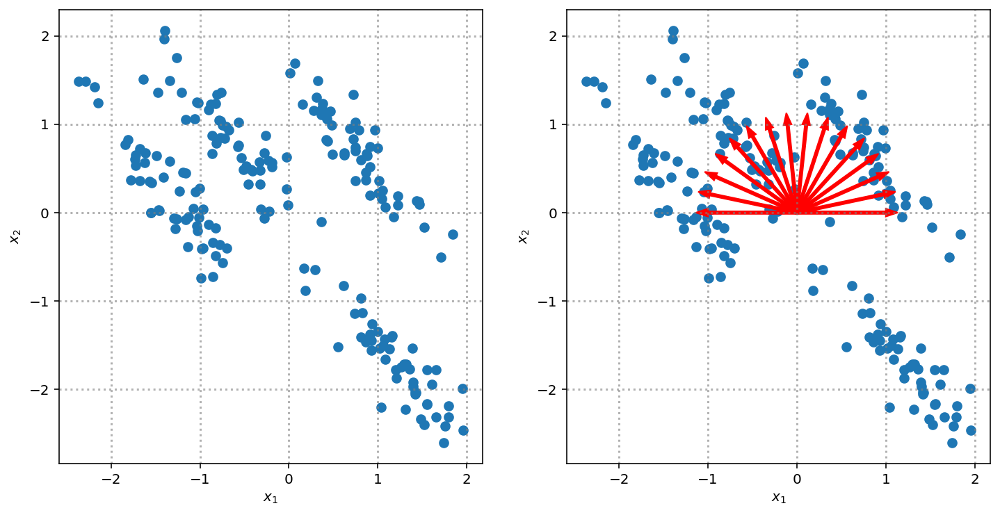

In [118]:
from sklearn.datasets import make_blobs

XX, y_true = make_blobs(n_samples=200, centers=4,
                       cluster_std=0.60, random_state=0)

rng = np.random.RandomState(13)
X_stretched = np.dot(XX, rng.randn(2, 2))

X_stretched -= np.mean(X_stretched,0)

fig, ax = plt.subplots(1,2,figsize=(12, 6))
ax[0].scatter(X_stretched[:, 0], X_stretched[:, 1],  s=40)
ax[0].set_xlabel('$x_1$')
ax[0].set_ylabel('$x_2$')
ax[0].grid(b=True, which='major', color='gray', alpha=0.6, linestyle='dotted', lw=1.5)

v_angle = np.linspace(0,np.pi,16)

ax[1].scatter(X_stretched[:, 0], X_stretched[:, 1],  s=40)
ax[1].set_xlabel('$x_1$')
ax[1].set_ylabel('$x_2$')
ax[1].grid(b=True, which='major', color='gray', alpha=0.6, linestyle='dotted', lw=1.5)

for alfa in v_angle:
    ax[1].arrow(0,0,np.cos(alfa), np.sin(alfa),color='red', shape='full',width=.03)

In [119]:
print("Varianza en la dimensión $x_1$: {0:.2f}".format(np.var(X_stretched[:,0])))
print("Varianza en la dimensión $x_2$: {0:.2f}".format(np.var(X_stretched[:,1])))
print("Varianza total: {0:.2f}".format(np.var(X_stretched[:,0])+np.var(X_stretched[:,1])))


Varianza en la dimensión $x_1$: 1.26
Varianza en la dimensión $x_2$: 1.28
Varianza total: 2.54


Resultado de proyectar sobre cada una de las direcciones de las flechas rojas.

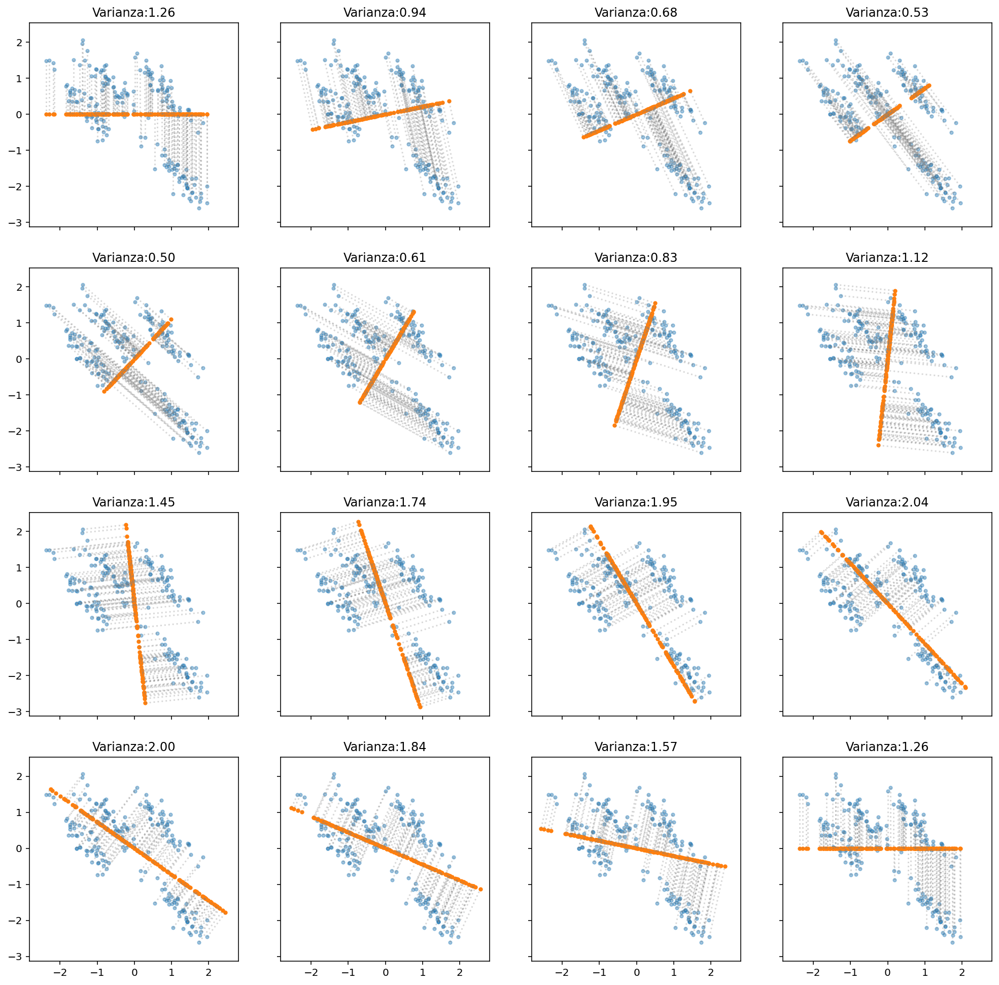

In [120]:
nrows=4
ncols =4
ff,aa = plt.subplots(nrows, ncols, sharex=True, sharey=True, figsize=(17,17))
kk=0
variances = np.empty(len(v_angle))
for rr in range(nrows):
    for cc in range(ncols):
        ax = aa[rr][cc]
        ax.scatter(X_stretched[:, 0], X_stretched[:, 1], marker='.', s=40, alpha=0.4)
        w = np.array([np.cos(v_angle[kk]),np.sin(v_angle[kk])])
        proj = X_stretched.dot(w)
        Z = np.outer(proj,w)
        ax.scatter(Z[:, 0], Z[:, 1], marker='.',  s=40)
        for jj in range(Z.shape[0]):
            ax.plot([X_stretched[jj,0], Z[jj,0]],
                     [X_stretched[jj,1], Z[jj,1]],
                      linestyle=':',
                      alpha=0.3, color='gray')
        variances[kk] = np.var(proj)
        kk+=1
        ax.set_title('Varianza:{0:.2f}'.format(np.var(proj)))

## Algoritmo PCA

* **Entrada**: $X$ matriz de tamaño $N\times p$ con las observaciones, cada fila es una observación 

* **Proceso**:

    1.- $\mathbf m = {1\over N} \sum_{i=1}^N{\mathbf x_i}$

    2.- $\bf C_{XX} = {1\over N} \sum_{i=1}^N{(\mathbf x_i - \mathbf m)(\mathbf x_i - \mathbf m)}^\top$

    3.- $\bf U,\Lambda = \mbox{eig}(C_{XX})$
    
    4.- $Z = \mathbf X(U_{:q,:})^\top$ 

* **Salida**: Datos transformados $Z$, tamaño $N\times q$

donde eig($A$) es una función que devuelve los autovectores (filas de $U$) y los autovalores (diagonal de $\Lambda$) de la matriz $A$ y $U_{:q,:}$ significa las $q$ primeras filas de la matriz $U$.


Las componentes principales son las filas de $U$, es decir, los autovectores de $\bf C_{XX}$ en orden decreciente de autovalor. La primera componente principal sería $\mathbf u_1$, la primera fila de $U$; la segunda fila de $U$, $\mathbf u_2$ sería la segunda componente principal y así sucesivamente hasta recorrer todos los autovalores distintos de cero de $\bf C_{XX}$.


En scikit learn la clase [sklearn.decomposition.PCA](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html) implementa PCA.

In [20]:
from sklearn.decomposition import PCA

In [121]:
pca1 = PCA(n_components=2).fit(X_stretched)


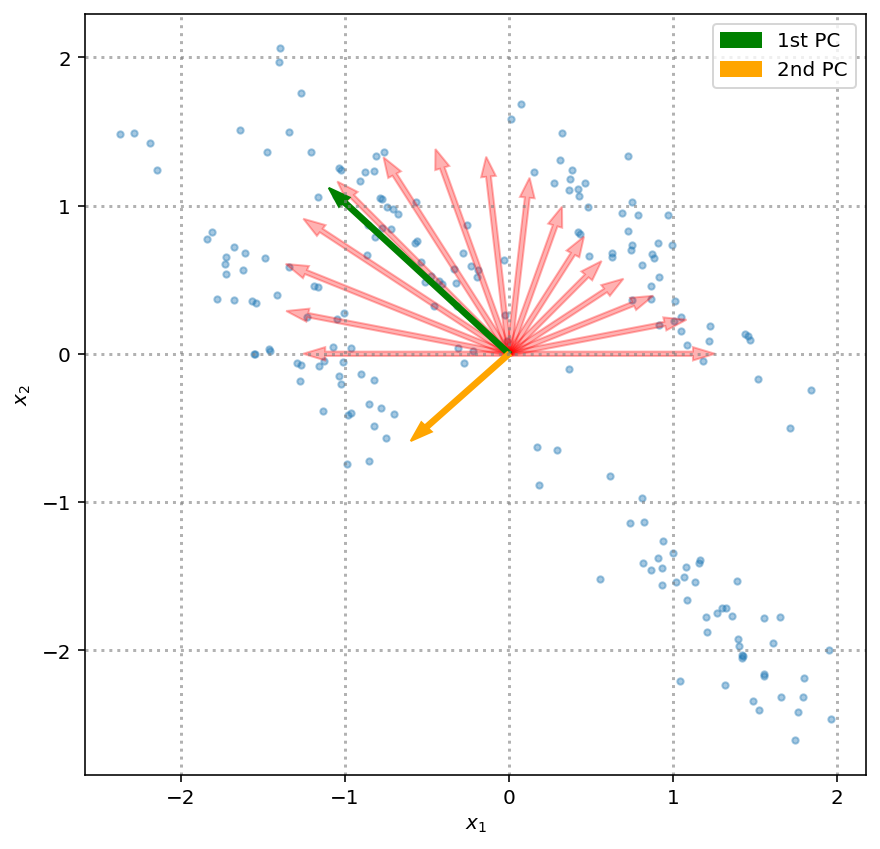

In [123]:
fig, ax = plt.subplots(figsize=(7, 7))
ax.scatter(X_stretched[:, 0], X_stretched[:, 1], marker='.', alpha=0.4,  s=40)
ax.set_xlabel('$x_1$')
ax.set_ylabel('$x_2$')
ax.grid(b=True, which='major', color='gray', alpha=0.6, linestyle='dotted', lw=1.5)

v_angle = np.linspace(0,np.pi,16)

for kk,alfa in enumerate(v_angle):
    ax.arrow(0,0,np.sqrt(variances[kk])*np.cos(alfa), np.sqrt(variances[kk])*np.sin(alfa),color='red', shape='full',width=.03, alpha=0.3)
ax.arrow(0,0,-np.sqrt(pca1.explained_variance_[0])*pca1.components_[0,0],
         -np.sqrt(pca1.explained_variance_[0])*pca1.components_[0,1],color='green', 
         shape='full',width=.03,
        label='1st PC')
ax.arrow(0,0,-np.sqrt(pca1.explained_variance_[1])*pca1.components_[1,0],
         -np.sqrt(pca1.explained_variance_[1])*pca1.components_[1,1],color='orange', shape='full',width=.03,
         label='2nd PC')
_=ax.legend()

In [124]:
print("La primera componente de PCA explica una varianza {0:.2f}".format(pca1.explained_variance_[0]))
print("La segunda componente de PCA explica una varianza {0:.2f}".format(pca1.explained_variance_[1]))


La primera componente de PCA explica una varianza 2.06
La segunda componente de PCA explica una varianza 0.50


Representación gráfica de los datos transformados. El PCA lineal sólo gira las observaciones de modo que los ejes cartesianos estén alineados con las componentes principales

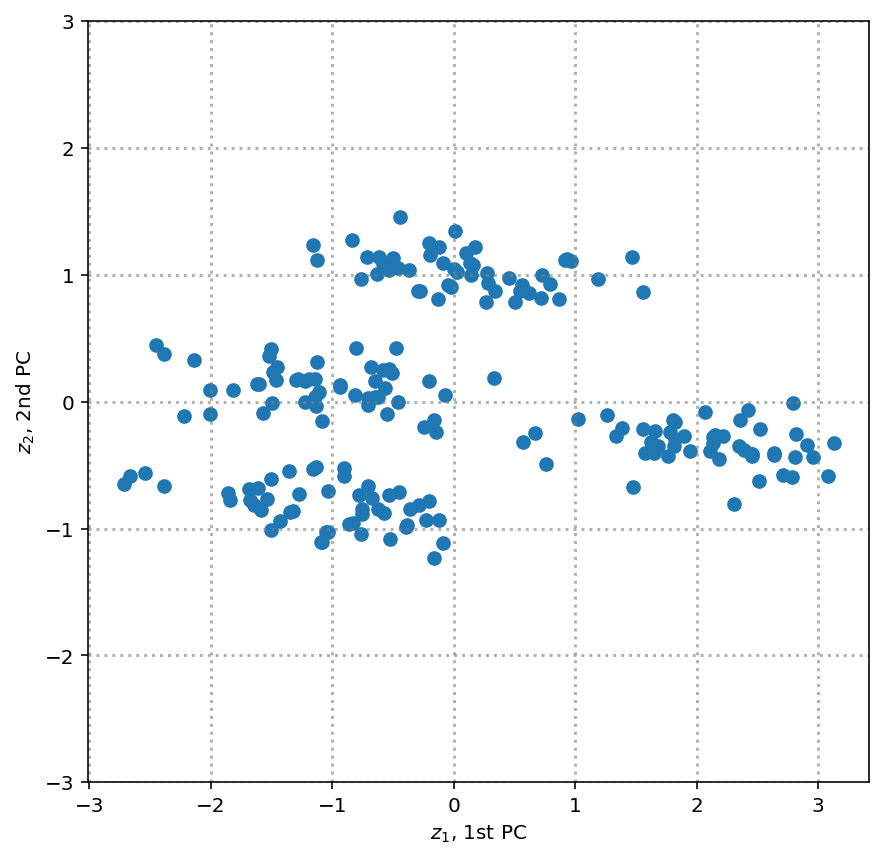

In [126]:
fig, ax = plt.subplots(figsize=(7, 7))
Z = pca1.transform(X_stretched)
ax.scatter(Z[:, 0], Z[:, 1],  s=40)
ax.set_xlabel('$z_1$, 1st PC')
ax.set_ylabel('$z_2$, 2nd PC')
ax.grid(b=True, which='major', color='gray', alpha=0.6, linestyle='dotted', lw=1.5)
_=ax.set_ylim(-3,3)

In [127]:
print("Varianza en cada componente del espacio transformado (componentes principales)")
np.var(Z,0)

Varianza en cada componente del espacio transformado (componentes principales)


array([2.04550415, 0.49456713])

### Interpretación alternativa: minimización el error de reconstrucción

La manera en la que se construyen las componentes principales genera una **base** de vectores con la que representar el conjunto de datos. Si tenemos datos en $p$ dimensiones, implícitamente estamos asumiendo que cada dato se construye como una combinación lineal de la **base canónica** o cartesiana:

$$
\mathbf x \in \mathbb R^p = \left [ \begin{array}{c} x_1 \\ x_2\\ \vdots \\x_{p-1} \\x_{p} \end{array}\right ] = x_1 + 
\left [ \begin{array}{c} 1 \\ 0\\ \vdots \\ 0 \\ 0 \end{array}\right ] + x_2 \left [ \begin{array}{c} 0 \\ 1\\ \vdots \\ 0 \\ 0 \end{array}\right ] + \dots + x_{p-1} \left [ \begin{array}{c} 0 \\ 0\\ \vdots \\ 1 \\ 0 \end{array}\right ] + x_p \left [ \begin{array}{c} 0 \\ 0\\ \vdots \\ 0 \\ 1 \end{array}\right ]
$$

donde las coordenadas (valores de las características) de $\mathbf x$, $x_1$, $x_2$, $\dots$, $x_p$ son los coeficientes de la combinación lineal.

El conjunto de componentes principales forma una base para el espacio en el que viven las observaciones originales. Además, el hecho de que estas componentes se hayan extraído maximizando la variranza capturada (máximizar la captura de la información contenida en los datos originales), nos **garantiza** que las componentes principales son la base que **minimiza el error de reconstrucción** de los datos originales a partir de una combinación lineal de componentes reducidas. 

Dicho de otro modo, si tenemos observaciones en $p$ dimensiones y queremos proyectarlas a un espacio de menor dimensionalidad $q<p$, la **base** formada por las $q$ **primeras componentes principales** es la que **minimiza el error de reconstrucción** de los datos originales. 

No hay mejor manera de transformar linealmente las $p$ variables originales en $q<p$ variables minimizando el error de reconstrucción de los datos originales que emplear como coordenadas las proyecciones de las observaciones originales en las $q$ primeras componentes principales. 

$$
\tilde{\mathbf x}_i^q = \sum_{j=1}^q{z_{i,j}\mathbf u_j} = z_{i,1} + 
\left [ \begin{array}{c} u_{1,1} \\ u_{1,2}\\ \vdots \\ u_{1,p-1} \\ u_{1,p} \end{array}\right ] + z_2 \left [ \begin{array}{c} u_{2,1} \\ u_{2,2}\\ \vdots \\ u_{2,p-1} \\ u_{2,p} \end{array}\right ] + \dots + z_q \left [ \begin{array}{c} u_{q,1} \\ u_{q,2}\\ \vdots \\ u_{q,q-1} \\ u_{q,q} \end{array}\right ] 
$$

es la mejor aproximación a cada dato original $\mathbf x_i$, $i=1,\dots,n$ en $q$ componentes. Es decir,
$$
||\mathbf x_i - \tilde{\mathbf x}_i^q||_2^2
$$
es mínimo. Y además 
$$
\mathbf x_i = \tilde{\mathbf x}_i^{q=p}
$$
La reconstrucción con $q=p$ componentes principales es **exacta**.

### PCA con los dígitos manuscritos

Vamos a analizar con PCA el conjunto de datos de dígitos manuscritos para capturar las direcciones principales del *manifold* donde viven los datos.

In [128]:
from matplotlib import offsetbox

# Scale and visualize the embedding vectors
def plot_embedding(X, digits, xlabel='Primera CP',ylabel='Segunda CP'):
    x_min, x_max = np.min(X, 0), np.max(X, 0)
    X = (X - x_min) / (x_max - x_min)
  
    ax = plt.subplot(111)
    plt.scatter(X[:, 0], X[:, 1])
    # Add some example images
    if hasattr(offsetbox, 'AnnotationBbox'):
        # only print thumbnails with matplotlib > 1.0
        shown_images = np.array([[1., 1.]])  # just something big
        for i in range(X.shape[0]):
            dist = np.sum((X[i] - shown_images) ** 2, 1)
            if np.min(dist) < 4e-3:
                # don't show points that are too close
                continue
            shown_images = np.r_[shown_images, [X[i]]]
            imagebox = offsetbox.AnnotationBbox(
                offsetbox.OffsetImage(digits[i,:].reshape(28,28), cmap=plt.cm.gray_r),
                X[i])
            ax.add_artist(imagebox)
    plt.xticks([]), plt.yticks([])
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)



Comenzamos con el conjunto de los 5s, representando sus dos componentes principales

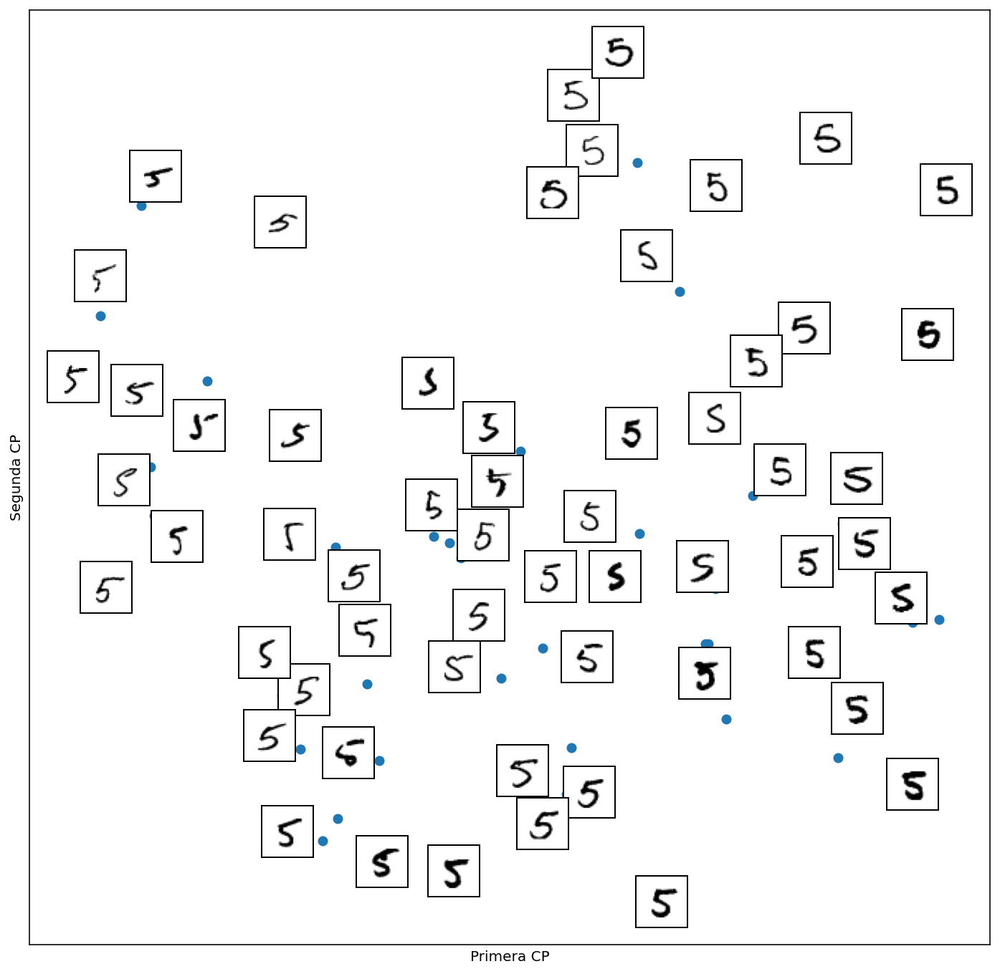

In [129]:
# Plot two first PCA dimensions
plt.figure(figsize=(12,12))
pca5 = PCA(n_components=2)
Z5 = pca5.fit_transform(X5)
plot_embedding(Z5, X5)


Cada componente principal es a su vez un vector que **vive en el mismo manifold** que los datos de entrada

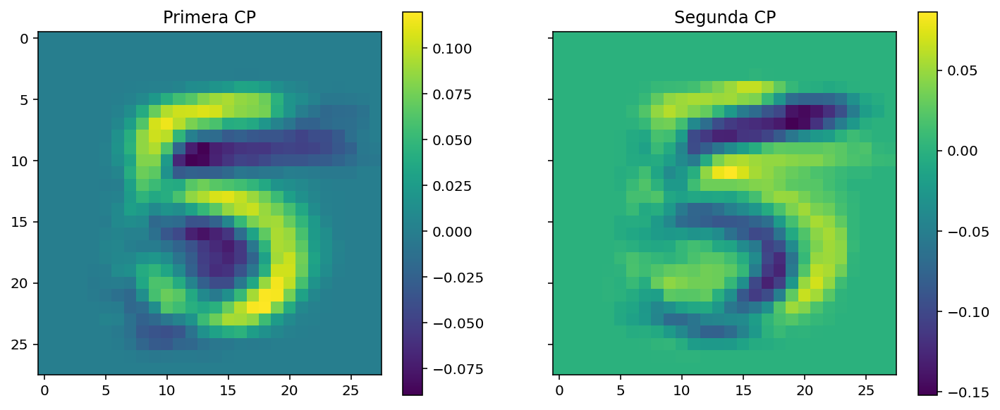

In [130]:
ff,aa = plt.subplots(1,2,sharex=True, sharey=True, figsize=(12,5))
vv=aa[0].imshow(pca5.components_[0,:].reshape(28,28),interpolation='nearest')
aa[0].set_title('Primera CP')
ff.colorbar(vv,ax=aa[0])
vv=aa[1].imshow(pca5.components_[1,:].reshape(28,28),interpolation='nearest')
aa[1].set_title('Segunda CP')
_=ff.colorbar(vv,ax=aa[1])



Seguimos analizando el ejemplo con 5s y 6s

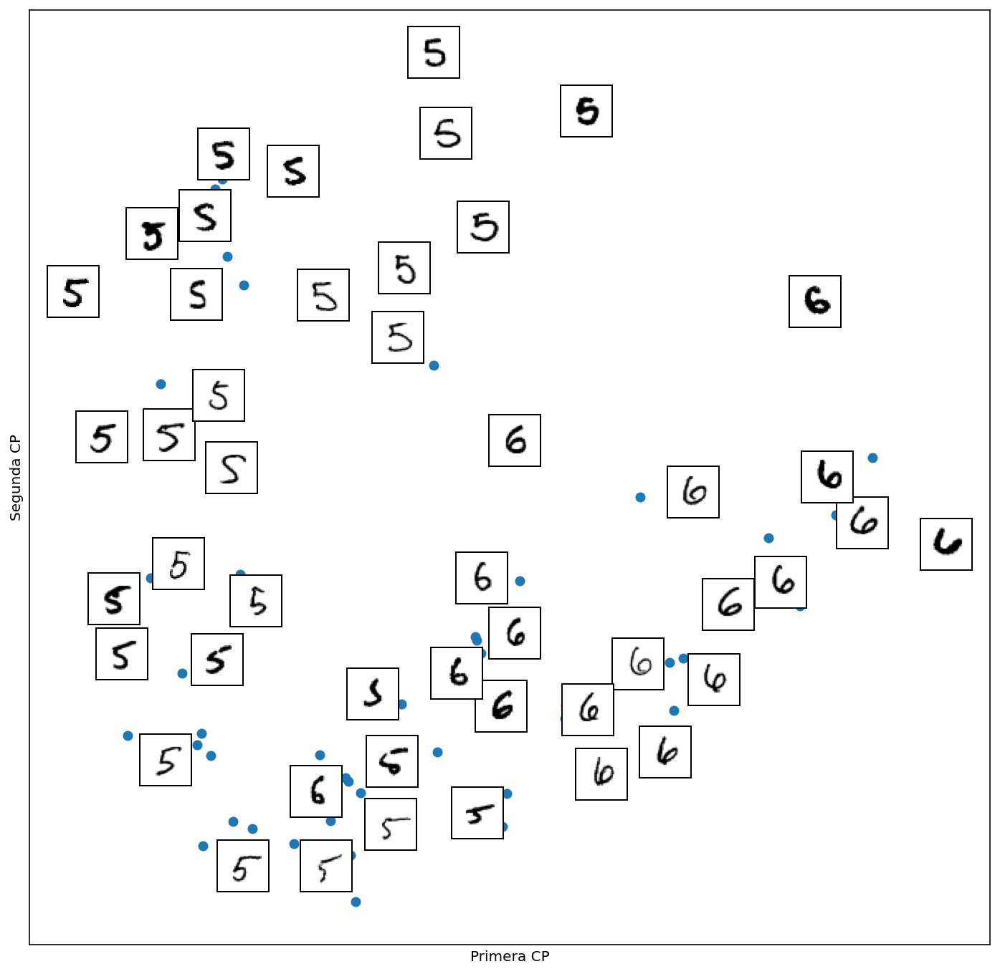

In [131]:
# Plot two first PCA dimensions
plt.figure(figsize=(12,12))
pca56 = PCA(n_components=2)
Z56 = pca56.fit_transform(X56)
plot_embedding(Z56, X56)

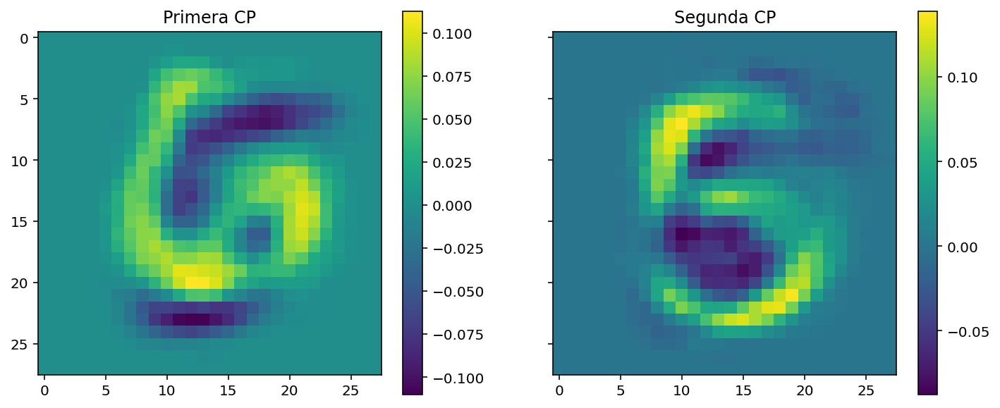

In [32]:
ff,aa = plt.subplots(1,2,sharex=True, sharey=True, figsize=(12,5))
vv=aa[0].imshow(pca56.components_[0,:].reshape(28,28),interpolation='nearest')
aa[0].set_title('Primera CP')
ff.colorbar(vv,ax=aa[0])
vv=aa[1].imshow(pca56.components_[1,:].reshape(28,28),interpolation='nearest')
aa[1].set_title('Segunda CP')
_=ff.colorbar(vv,ax=aa[1])

Ejemplo con 1s y 5s

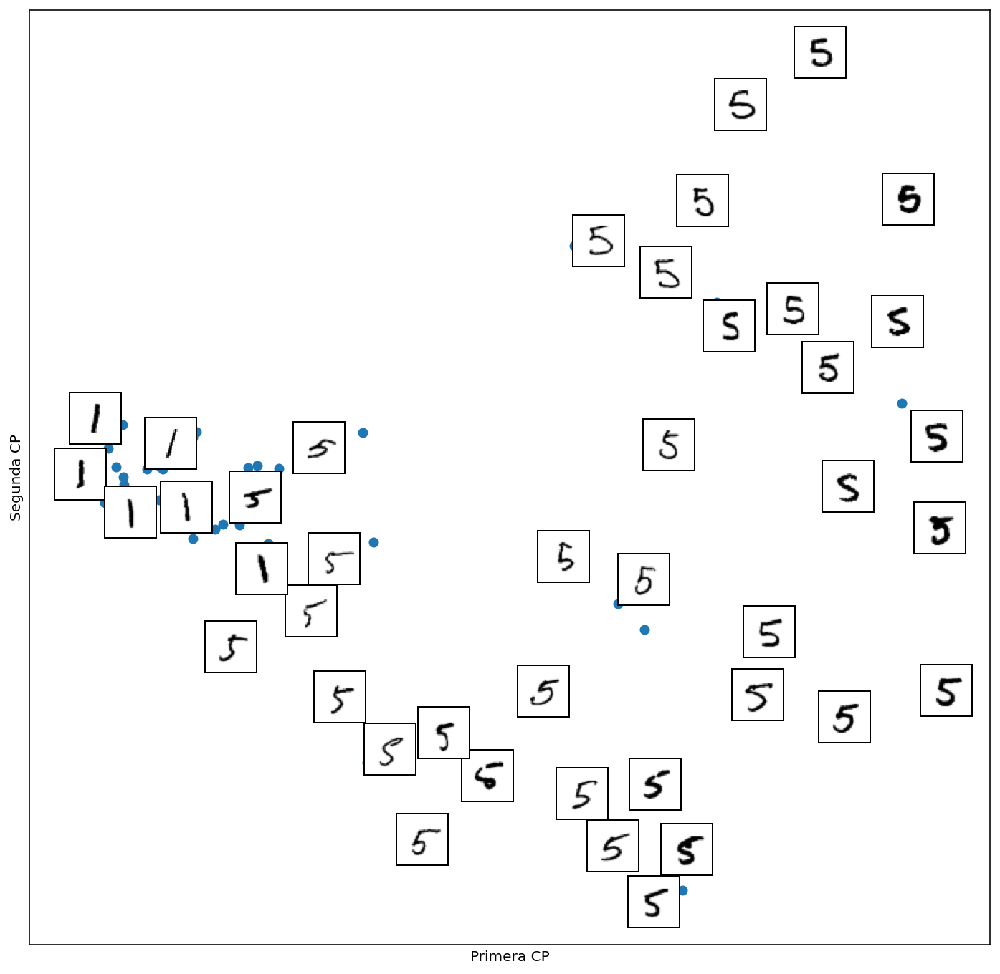

In [133]:
# Plot two first PCA dimensions
plt.figure(figsize=(12,12))
pca51 = PCA(n_components=2)
Z51=pca51.fit_transform(X51)
plot_embedding(Z51, X51)

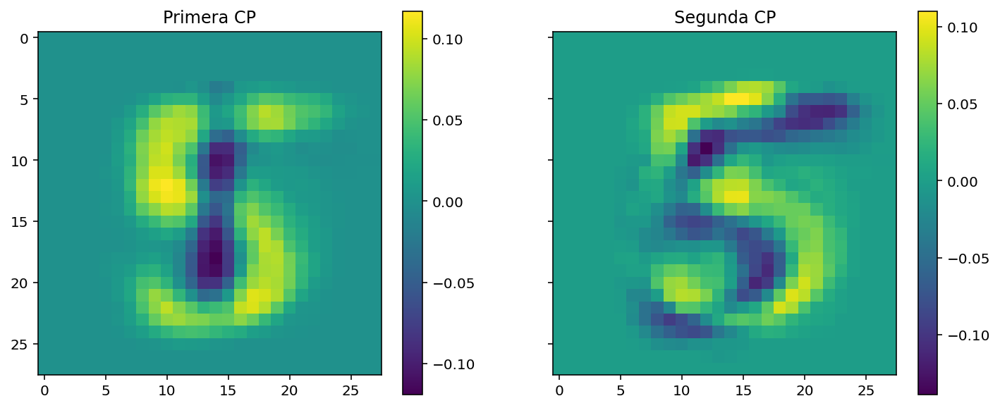

In [134]:
ff,aa = plt.subplots(1,2,sharex=True, sharey=True, figsize=(12,5))
vv=aa[0].imshow(pca51.components_[0,:].reshape(28,28),interpolation='nearest')
aa[0].set_title('Primera CP')
ff.colorbar(vv,ax=aa[0])
vv=aa[1].imshow(pca51.components_[1,:].reshape(28,28),interpolation='nearest')
aa[1].set_title('Segunda CP')
_=ff.colorbar(vv,ax=aa[1])

Ejemplos de todos los dígitos, se ve que se necesitan más de dos componentes principales para capturar la estructura de este conjunto.

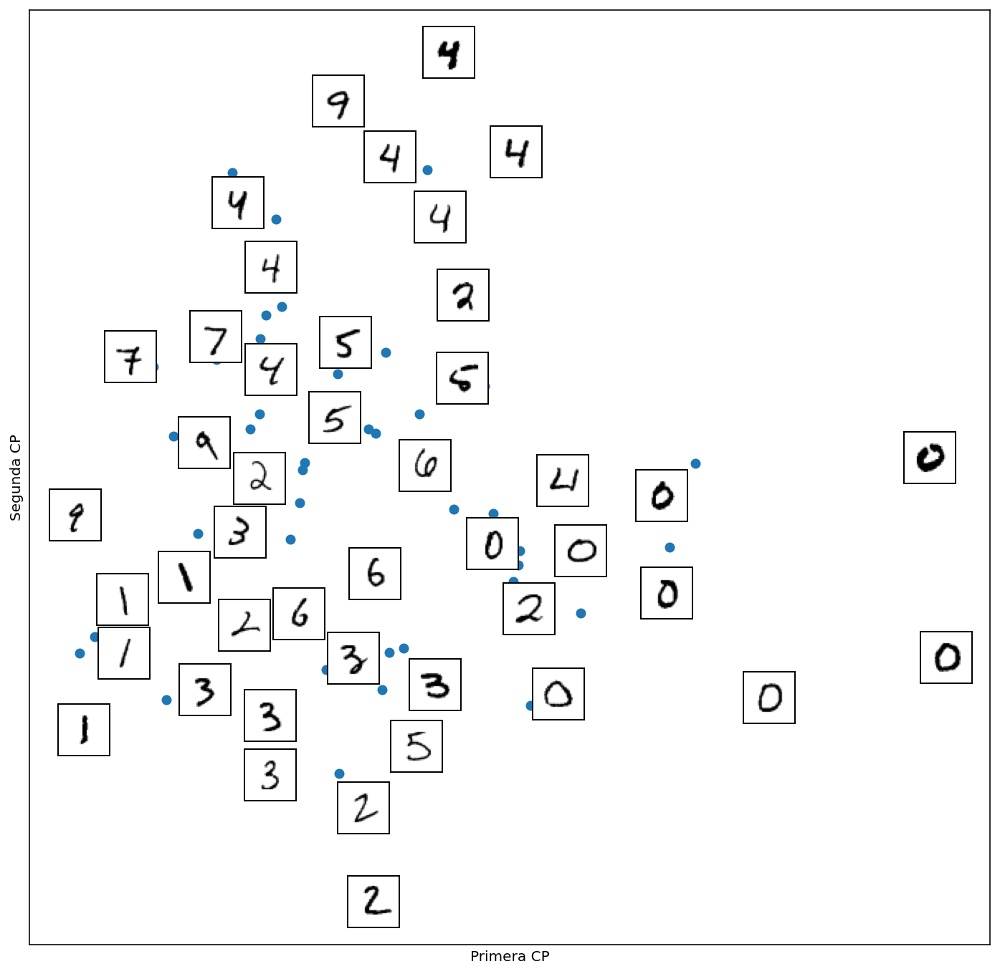

In [135]:
# Plot two first PCA dimensions
plt.figure(figsize=(12,12))
pcatodos = PCA(n_components=2)
Ztodos = pcatodos.fit_transform(Xtodos)
plot_embedding(Ztodos, Xtodos)

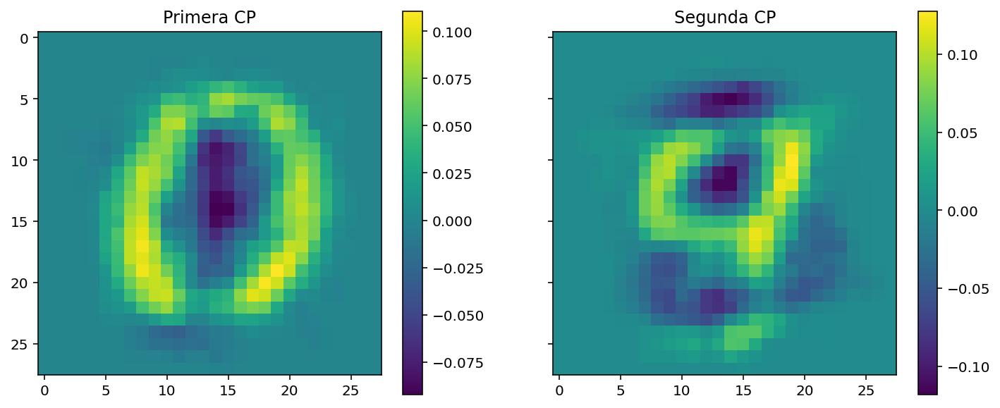

In [136]:
ff,aa = plt.subplots(1,2,sharex=True, sharey=True, figsize=(12,5))
vv=aa[0].imshow(pcatodos.components_[0,:].reshape(28,28),interpolation='nearest')
aa[0].set_title('Primera CP')
ff.colorbar(vv,ax=aa[0])
vv=aa[1].imshow(pcatodos.components_[1,:].reshape(28,28),interpolation='nearest')
aa[1].set_title('Segunda CP')
_=ff.colorbar(vv,ax=aa[1])

La siguiente curva muestra, para cada uno de los subconjuntos de dígitos que hemos analizado, cómo aumenta la varianza capturada en las componentes principales a medida que vamos añadiendo más componentes al análisis. Vemos que el conjutno de 5s y 1s es el que presenta una menor variabilidad, y el conjunto de todos los números presenta mayor variabilidad. 

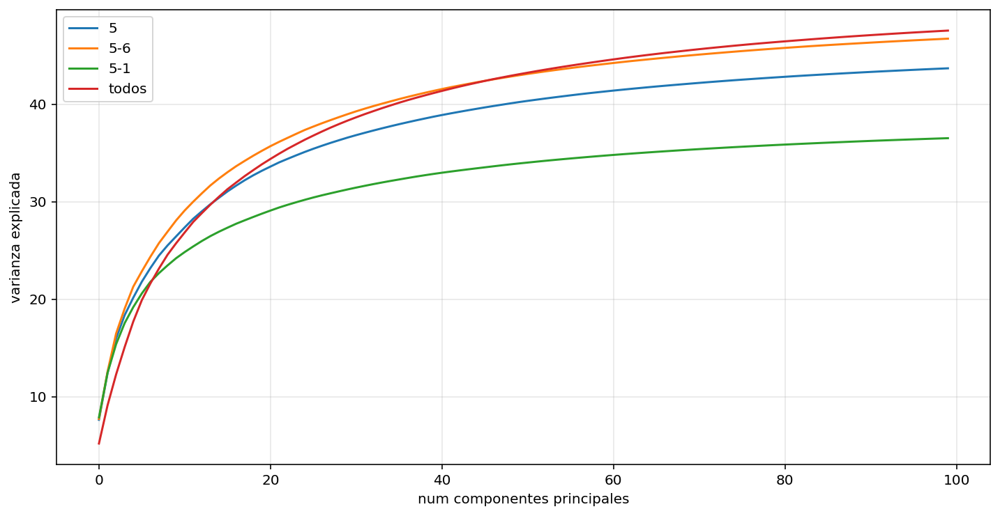

In [142]:
plt.figure(figsize=(12,6))
for nums, nombre in zip([X[cincos,:], X[np.hstack((cincos, seis)),:], X[np.hstack((cincos, unos)),:], X], ['5','5-6','5-1','todos']):
    ppca = PCA(n_components=100).fit(nums)
    plt.plot(np.cumsum(ppca.explained_variance_), label=nombre)
plt.xlabel('num componentes principales')
plt.ylabel('varianza explicada')
plt.legend()
plt.grid(alpha=0.3)

### Número de componentes principales

El número máximo de componentes principales que pueden extraerse está limitado por el número máximo de autovalores distintos de $\bf C_{XX}$. Como $\bf C_{XX}$ es una matriz de covarianzas, es **semidefinida positiva**, es decir, sus autovalores son todos no negativos. Si hay autovalores nulos es porque alguna de las características que definen las observaciones son linealmente dependientes. Es decir, que en realidad existen menos grados de libertad que el número de variables de entrada.

La siguiente figura representa cómo varía la varianza explicada por las componentes principales para distintos tamaños de conjunto de entrenamiento del ejemplo de los 5s. Vemos como no se aprecian diferencias muy significativas en el perfil de la varianza explicada al aumentar el tamaño del conjunto de entrenamiento.

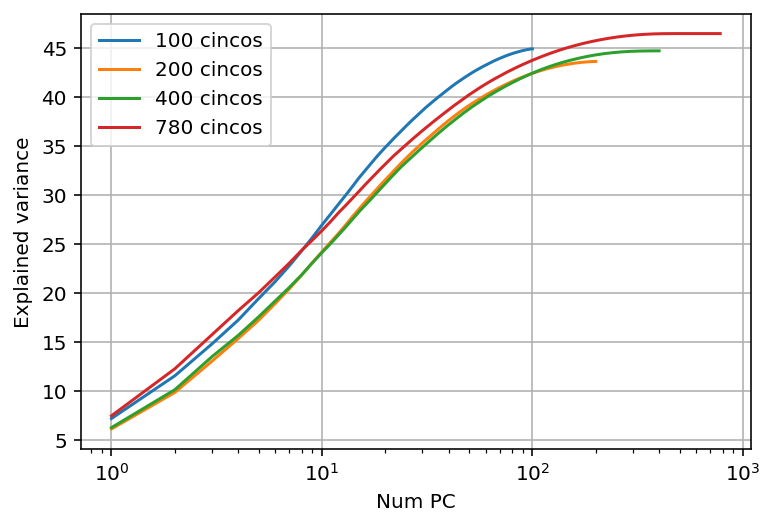

In [143]:
v_n = [100,200,400,780]
plt.figure()
for n in v_n:
    pca5 = PCA(n_components = n).fit(X[cincos[:n],:])
    plt.plot(range(1,n+1),np.cumsum(pca5.explained_variance_), label='{0:d} cincos'.format(n))
plt.legend()
plt.xlabel('Num PC')
plt.ylabel('Explained variance')
plt.grid()
plt.xscale('log')

### Error de reconstrucción

Ahora vamos a reconstruir algunos dígitos empleando las componentes principales. Cada fila en la figura de abajo se corresponde con la reconstrucción de un dígito distinto usando el número de componentes principales indicado en en título de cada subplot.

La primera columna reconstruye sólo con la media, por lo que todas las primeras reconstrucciones son iguales. La segunda columna añade a la media la información correspondiente a la primera componente principal. Las siguientes columnas añaden 2, 3, 4, ... hasta 784 componentes principales, que son todas, es decir, la última columna muestra la imagen original.

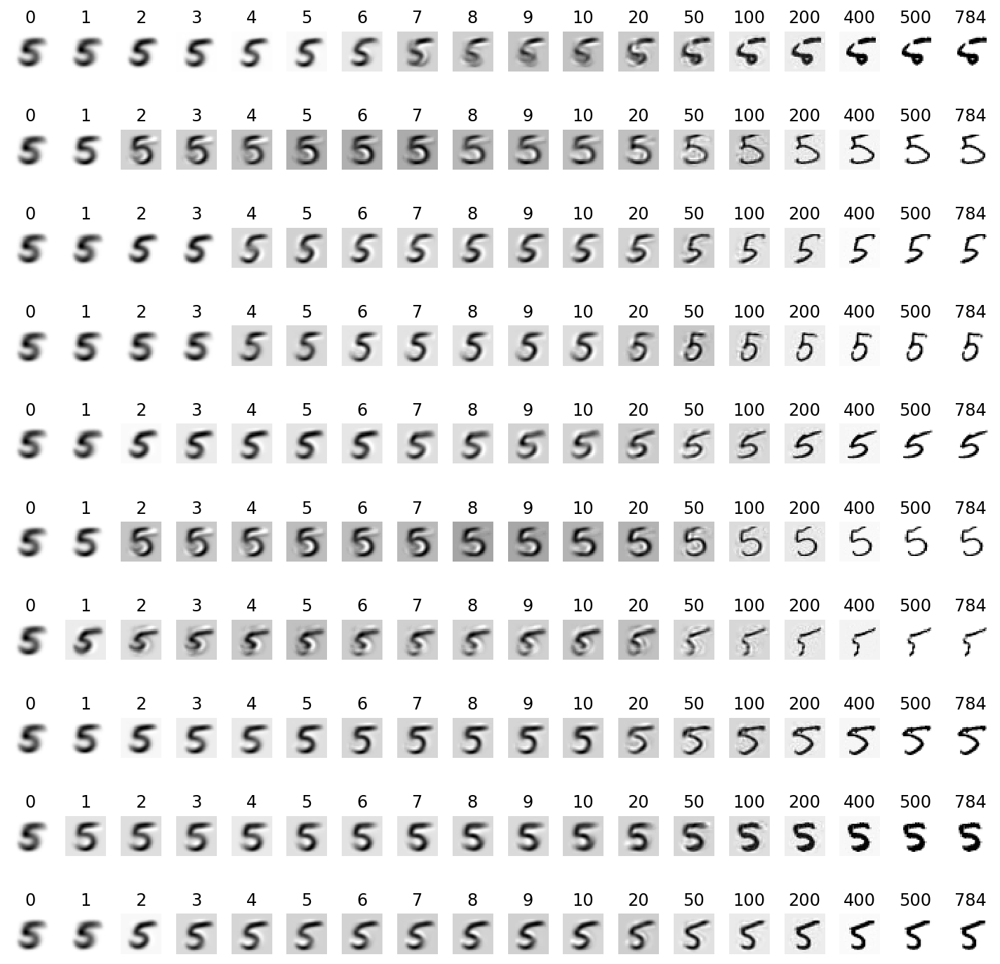

In [145]:
ncols=18
nrows = 10
ff,aa = plt.subplots(nrows, ncols,figsize=(10,10))

mx = np.mean(X[cincos,:],0)
pca5 = PCA(n_components = 784).fit(X[cincos,:])
Z5 = pca5.transform(X[cincos,:])

icc = 0
for rr in range(nrows):
    aa[rr][icc].set_axis_off()
    aa[rr][icc].imshow((mx).reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')   
    aa[rr][icc].set_title(repr(0))
for icc,cc in enumerate([1,2,3,4,5,6,7,8,9,10,20,50,100,200,400,500,784]):
    Xtilde = Z5[:,:cc].dot(pca5.components_[:cc,:])
    for rr in range(nrows):
        aa[rr][icc+1].set_axis_off()
        aa[rr][icc+1].imshow((mx+Xtilde[rr]).reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')
        
        aa[rr][icc+1].set_title(repr(cc))
ff.tight_layout()   

En la siguiente tanda de representaciones gráficas mostramos el error de reconstrucción empezando a añadir las componentes principales por el final, es decir, comenzando por las menos principales hasta finalmente añadir la primera componente principal y luego la media

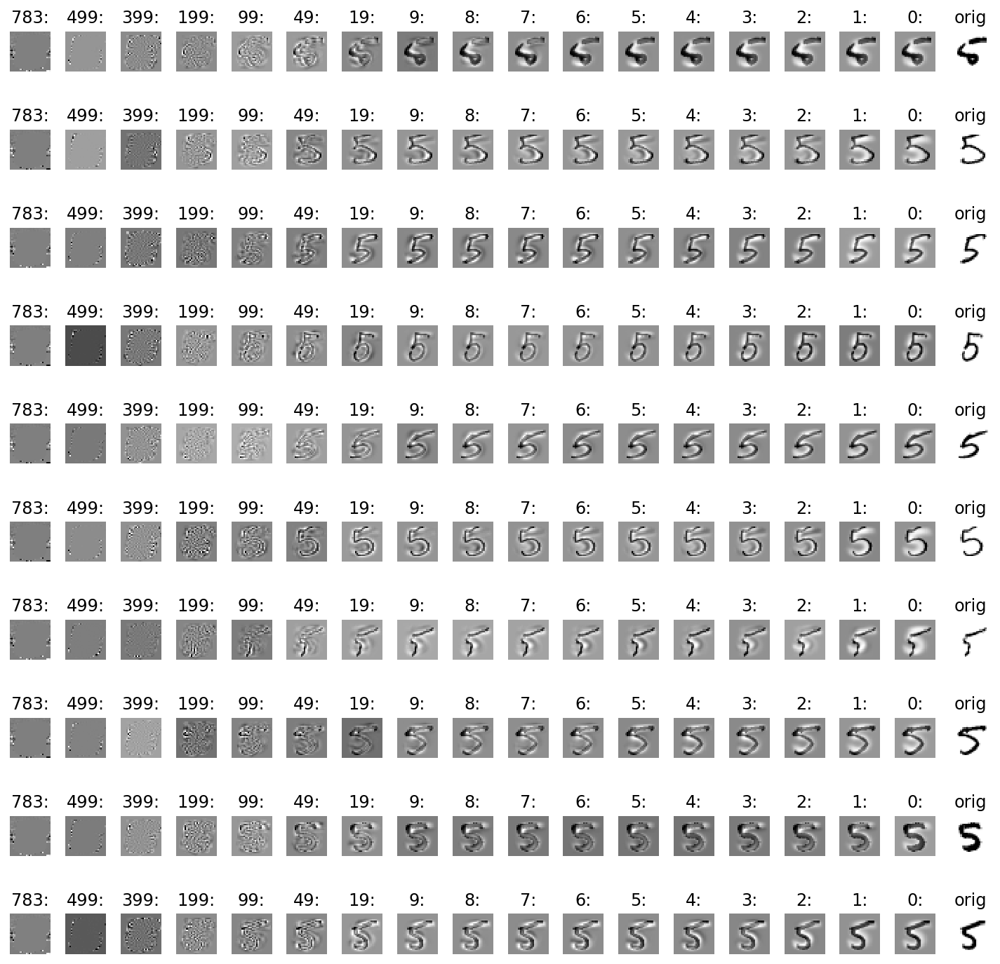

In [146]:
ncols=18
nrows = 10
ff,aa = plt.subplots(nrows, ncols,figsize=(10,10))

mx = np.mean(X[cincos,:],0)
pca5 = PCA(n_components = 784).fit(X[cincos,:])
Z5 = pca5.transform(X[cincos,:])


for icc,cc in enumerate([1,2,3,4,5,6,7,8,9,10,20,50,100,200,400,500,784][::-1]):
    Xtilde = Z5[:,cc-1:].dot(pca5.components_[cc-1:,:])
    for rr in range(nrows):
        aa[rr][icc].set_axis_off()
        aa[rr][icc].imshow((Xtilde[rr]).reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')
        
        aa[rr][icc].set_title(repr(cc-1)+":")
        
icc = 17
Xtilde = Z5.dot(pca5.components_)
for rr in range(nrows):
    aa[rr][icc].set_axis_off()
    aa[rr][icc].imshow((mx+Xtilde[rr]).reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')   
    aa[rr][icc].set_title("orig")
    
ff.tight_layout()   

Si hacemos el mismo ejercicio de reconstrucción con la base de datos de 5s y 1s

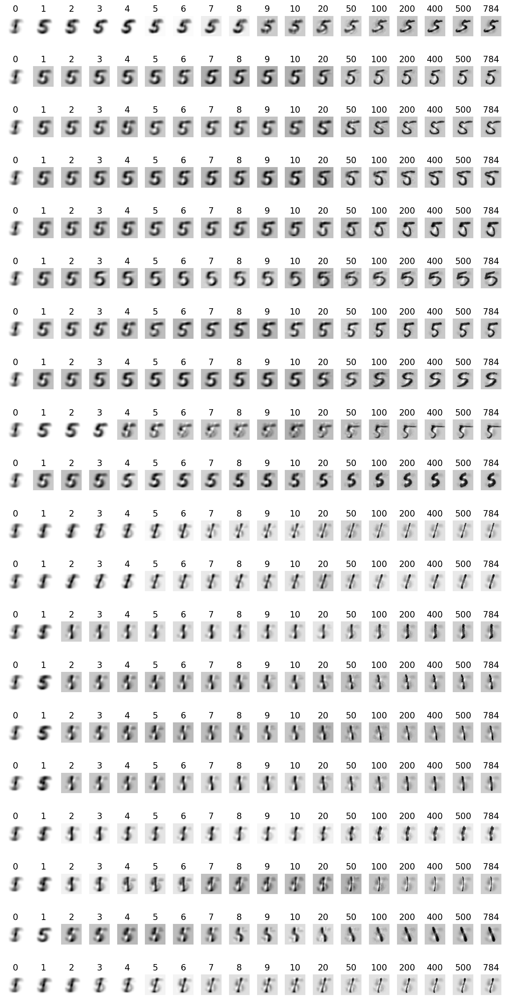

In [148]:
cinco_uno = np.hstack((cincos, unos))
cinco_uno_s = np.hstack((cincos[50:60], unos[:10]))
ncols=18
nrows = 20
ff,aa = plt.subplots(nrows, ncols,figsize=(10,20))

mx51 = np.mean(X[cinco_uno,:],0)
pca51 = PCA(n_components = 784).fit(X[cinco_uno,:])
Z51 = pca51.transform(X[cinco_uno_s,:])

icc = 0
for rr in range(nrows):
    aa[rr][icc].set_axis_off()
    aa[rr][icc].imshow((mx51).reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')   
    aa[rr][icc].set_title(repr(0))
for icc,cc in enumerate([1,2,3,4,5,6,7,8,9,10,20,50,100,200,400,500,784]):
    Xtilde = Z51[:,:cc].dot(pca51.components_[:cc,:])
    for rr in range(nrows):
        aa[rr][icc+1].set_axis_off()
        aa[rr][icc+1].imshow((mx+Xtilde[rr]).reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')
        
        aa[rr][icc+1].set_title(repr(cc))
ff.tight_layout()   

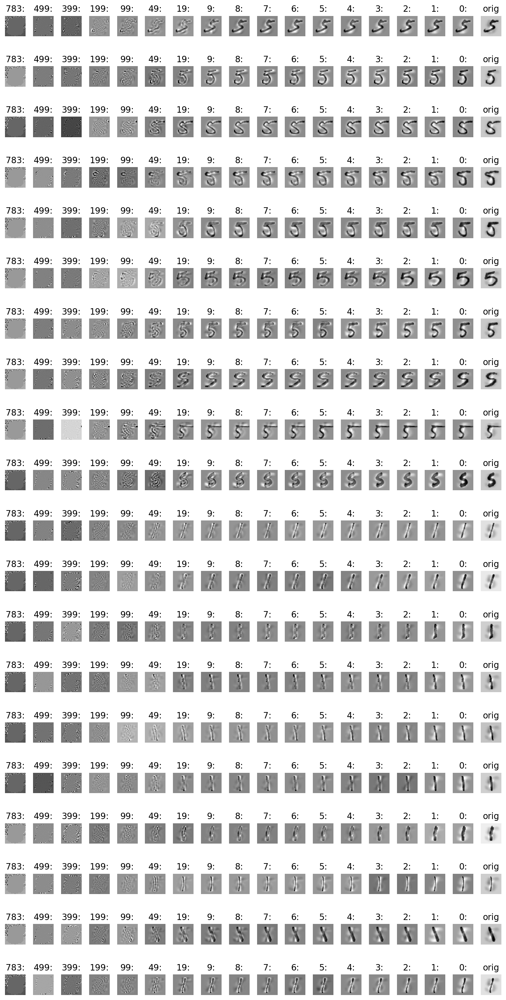

In [149]:
ncols=18
nrows = 20
ff,aa = plt.subplots(nrows, ncols,figsize=(10,20))


for icc,cc in enumerate([1,2,3,4,5,6,7,8,9,10,20,50,100,200,400,500,784][::-1]):
    Xtilde = Z51[:,cc-1:].dot(pca51.components_[cc-1:,:])
    for rr in range(nrows):
        aa[rr][icc].set_axis_off()
        aa[rr][icc].imshow((Xtilde[rr]).reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')
        
        aa[rr][icc].set_title(repr(cc-1)+":")
        
icc = 17
Xtilde = Z51.dot(pca51.components_)
for rr in range(nrows):
    aa[rr][icc].set_axis_off()
    aa[rr][icc].imshow((mx+Xtilde[rr]).reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')   
    aa[rr][icc].set_title("orig")
    
ff.tight_layout()   

Y con ejemplos de los 10 dígitos

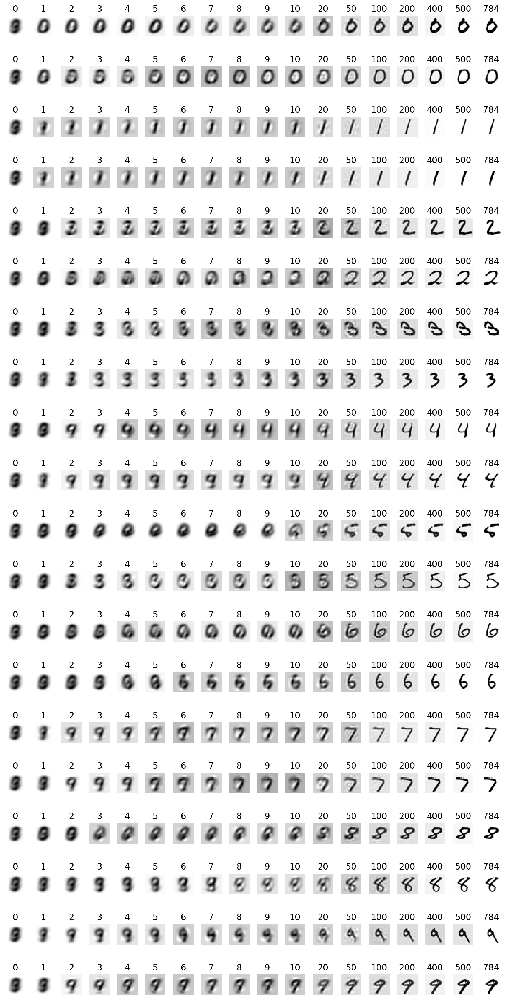

In [150]:
todos_s = []
for cc in range(10):
    todos_s += (np.where(Y==cc)[0][:2]).tolist()
todos_s = np.array(todos_s)


ncols=18
nrows = 20
ff,aa = plt.subplots(nrows, ncols,figsize=(10,20))

mx = np.mean(X[:,:],0)
pca = PCA(n_components = 784).fit(X[:,:])
Z = pca.transform(X[todos_s,:])

icc = 0
for rr in range(nrows):
    aa[rr][icc].set_axis_off()
    aa[rr][icc].imshow((mx).reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')   
    aa[rr][icc].set_title(repr(0))
for icc,cc in enumerate([1,2,3,4,5,6,7,8,9,10,20,50,100,200,400,500,784]):
    Xtilde = Z[:,:cc].dot(pca.components_[:cc,:])
    for rr in range(nrows):
        aa[rr][icc+1].set_axis_off()
        aa[rr][icc+1].imshow((mx+Xtilde[rr]).reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')
        
        aa[rr][icc+1].set_title(repr(cc))
ff.tight_layout()   

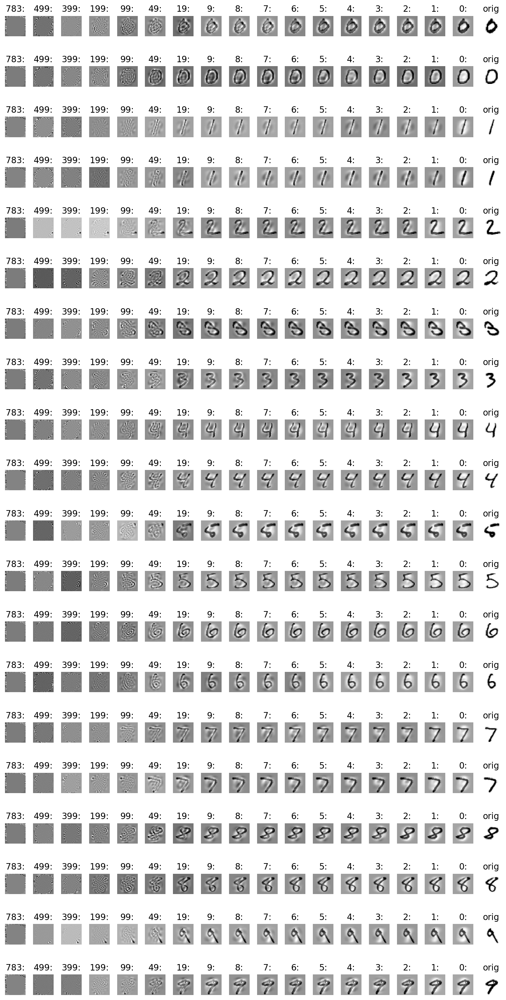

In [45]:
ncols=18
nrows = 20
ff,aa = plt.subplots(nrows, ncols,figsize=(10,20))


for icc,cc in enumerate([1,2,3,4,5,6,7,8,9,10,20,50,100,200,400,500,784][::-1]):
    Xtilde = Z[:,cc-1:].dot(pca.components_[cc-1:,:])
    for rr in range(nrows):
        aa[rr][icc].set_axis_off()
        aa[rr][icc].imshow((Xtilde[rr]).reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')
        
        aa[rr][icc].set_title(repr(cc-1)+":")
        
icc = 17
Xtilde = Z.dot(pca.components_)
for rr in range(nrows):
    aa[rr][icc].set_axis_off()
    aa[rr][icc].imshow((mx+Xtilde[rr]).reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')   
    aa[rr][icc].set_title("orig")
    
ff.tight_layout()   

## PCA dispersa (*sparse PCA*)

Uno de los problemas de PCA que compromete la interpretabilidad de los resultados es que cada componente principal "vive" en el mismo espacio que las observaciones y no es dispersa. Es decir, la interpretabilidad reside en proyectar las observaciones sobre cada componente principal usando el producto escalar como medida de similitud...  

Representamos, para el conjunto de datos de los cincos, las proyecciones en las primeras 5 componentes

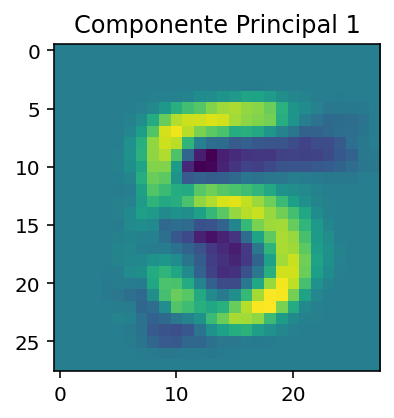

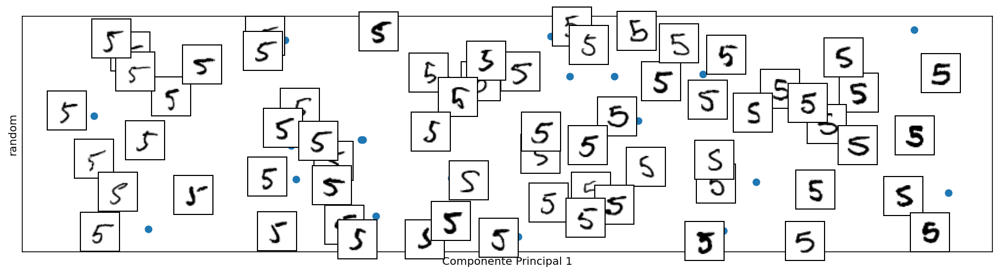

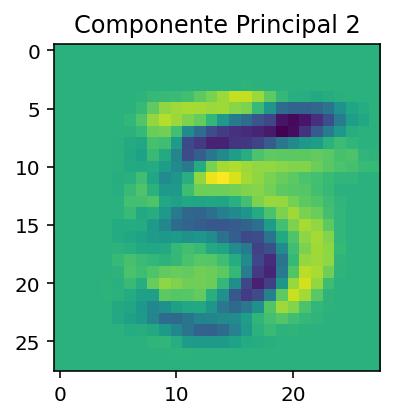

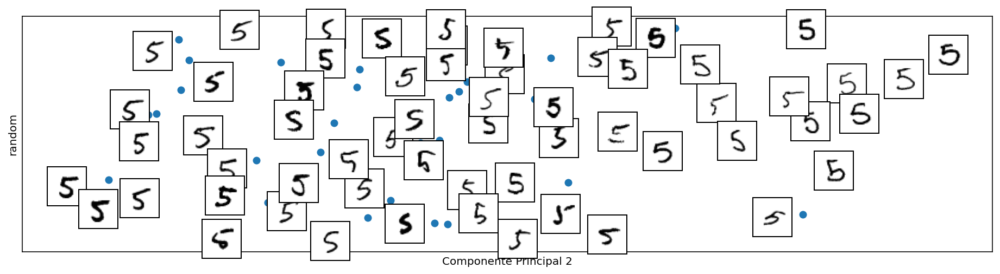

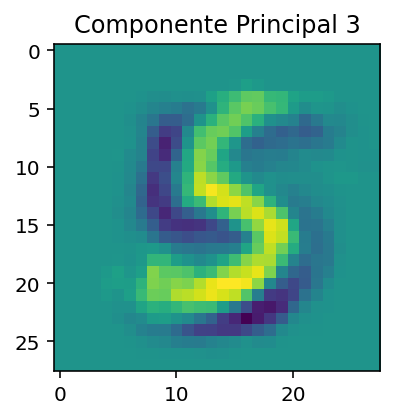

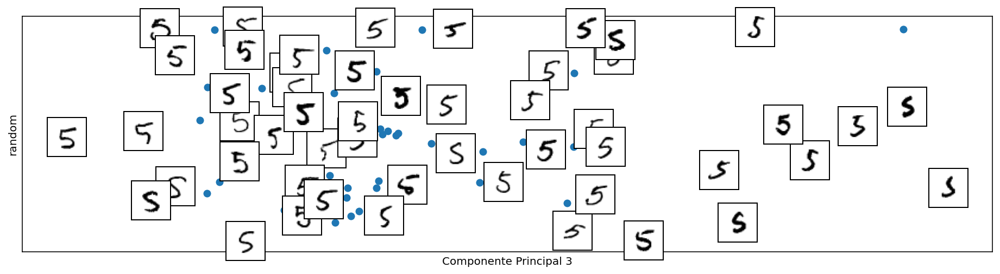

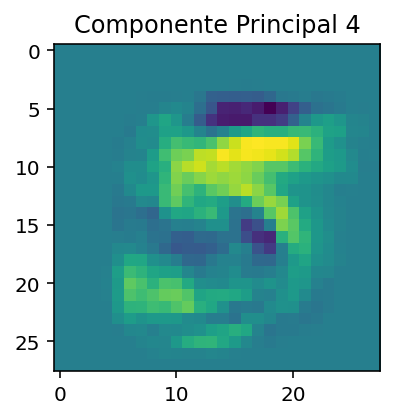

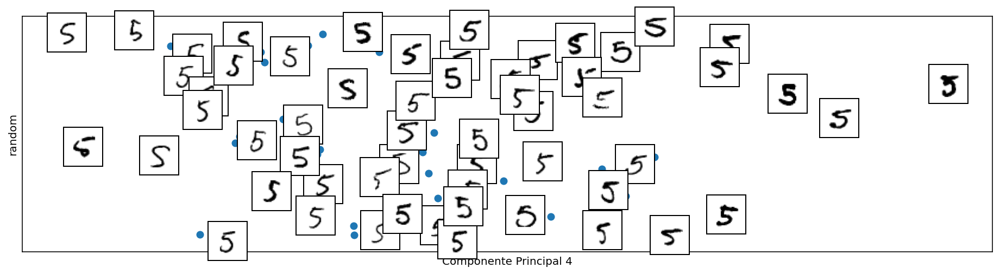

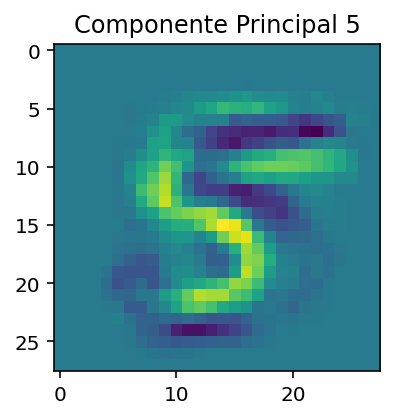

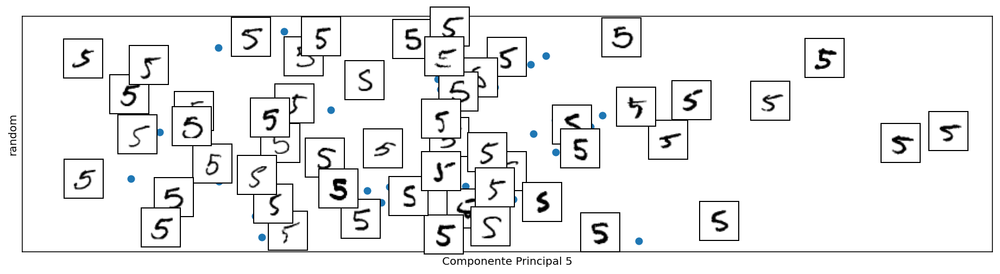

In [151]:
nr = 5

pca5 = PCA(n_components=10)
Z5 = pca5.fit_transform(X5)
for cc in range(nr):
    ff,aa = plt.subplots(1,1,figsize=(3,3))
    vv=aa.imshow(pca5.components_[cc,:].reshape(28,28),interpolation='nearest')
    aa.set_title('Componente Principal {0:d}'.format(cc+1))
    plt.figure(figsize=(16,4))
    plot_embedding(np.vstack((10*Z5[:,cc], 0.01*np.random.rand(Z5.shape[0]))).T, 
                   X5,
                  xlabel='Componente Principal {0:d}'.format(cc+1), 
                  ylabel='random')

En ejemplos como el de la base de datos de dígitos, puede ser más interesante una descomposición en características que agrupasen conjuntos de píxeles conectados, que pudieran alinearse con los **trazos o rasgos de escritura** que efectuamos al escribir (levantar el boli, acelerar, etc). En otros conjuntos de datos que no fuesen dígitos la descomposición podría ser en direcciones principales que agrupasen conjuntos de variables altamente correlacionadas.

La restricción que imponemos a las componentes principales es que sean ortogonales, es decir, que su producto escalar sea nulo. Esto es, si $\mathbf u_i$ y $\mathbf u_j$ son dos componentes principales en un problema con datos en $p$ dimensiones, imponemos que:
$$
\mathbf u_i^\top \mathbf u_j = \sum_{m=1}^p{u_{i,m}u_{j,m}} = 0 
$$

En el PCA original esta suma sale nula porque las componentes principales tienen valores positivos y negativos en sus dimensiones. 

Buscar **componentes principales dispersas** equivale a adoptar un escenario en el que para cada componente principal, solo un número reducido de las $p$ dimensiones vaya a ser distinto de cero. En estos casos conseguir un producto escalar nulo es fácil si las dimensiones en las que cada componente principal es no nula no se solapan. Es decir, que las posiciones en las que $\mathbf u_i$ es distinta de cero no coinciden con las posiciones en las que $\mathbf u_j$ es distinta de cero.


La manera de formular matemáticamente este problema es introduciendo una **regularización** $L_1$, la misma que en la regresión lineal LASSO. Esta regularización hace que muchas de las dimensiones que toman valores pequeños en cada componente principal se vayan a cero, consiguiendo dispersión en la definición de estas componentes. Concretamente el problema de optimización que nos determina el PCA disperso es:
$$
Z^*, U^* = \mbox{arg}\min_{Z,U}\frac{1}{2}\|X-ZU\|_2^2 + \alpha \|U\|_1
$$

sujeto a

$$
\mathbf u_j^\top \mathbf u_j = 1
$$

donde $\mathbf u_j$ es la componente principal $j$ (es decir, $\mathbf u_j^\top$ es la fila $j$ de $U$) y $\alpha$ es un parámetro que controla la regularización (como en Lasso), cuanto más grande es $\alpha$ más dispersas son las componentes principales.


La clase [SparsePCA](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.SparsePCA.html) de scikit learn implementa el PCA disperso. 

Las optimizaciones con regularización $L_1$ son en general más costosas y menos estables numéricamente que las regularizaciones $L_2$.



In [152]:
from sklearn.decomposition import SparsePCA
d_sparse_pca = {}
d_exp_var_sparse = {}
v_alpha = [1e-1, .5 , 1, 2, 5, 10]
for alfa in v_alpha:
    d_sparse_pca[alfa] = SparsePCA(n_components=100, alpha=alfa, random_state=0).fit(X5)
    S5 = d_sparse_pca[alfa].transform(X5)
    d_exp_var_sparse[alfa] = np.cumsum(np.var(S5,0))
pca5 = PCA(n_components=100)

Z5 = pca5.fit_transform(X5)

exp_var_dense = np.cumsum(np.var(Z5,0))


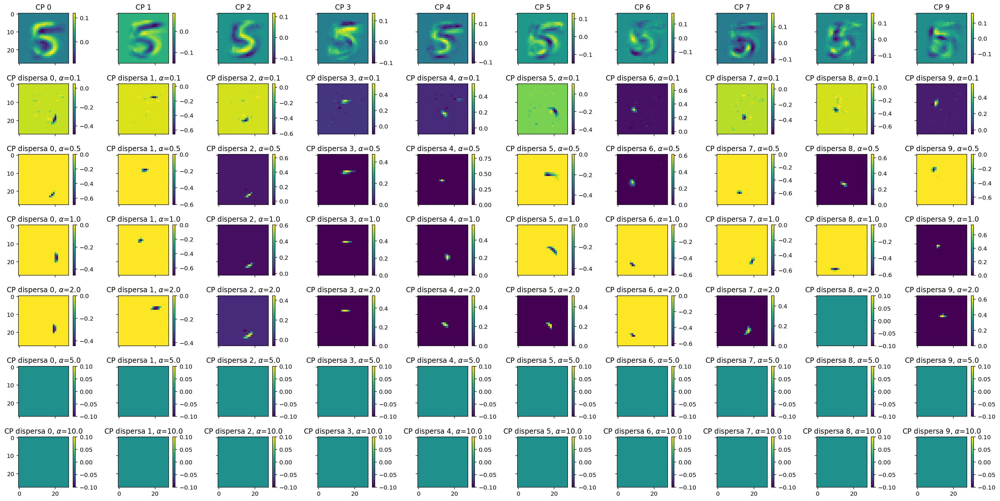

In [153]:

ff,aa = plt.subplots(1+len(v_alpha),10,sharex=True, sharey=True, figsize=(24,12))
for cc in range(10):
    ax = aa[0,cc]
    vv=ax.imshow(pca5.components_[cc,:].reshape(28,28),interpolation='nearest')
    ff.colorbar(vv,ax=ax)
    ax.set_title('CP {0:d}'.format(cc))
    for rr,alfa in enumerate(v_alpha):
        ax = aa[1+rr,cc]
        vv=ax.imshow(d_sparse_pca[alfa].components_[cc,:].reshape(28,28),interpolation='nearest')
        ff.colorbar(vv,ax=ax)
        ax.set_title('CP dispersa {0:d}, $\\alpha$={1:.1f}'.format(cc,alfa))
    
ff.tight_layout()

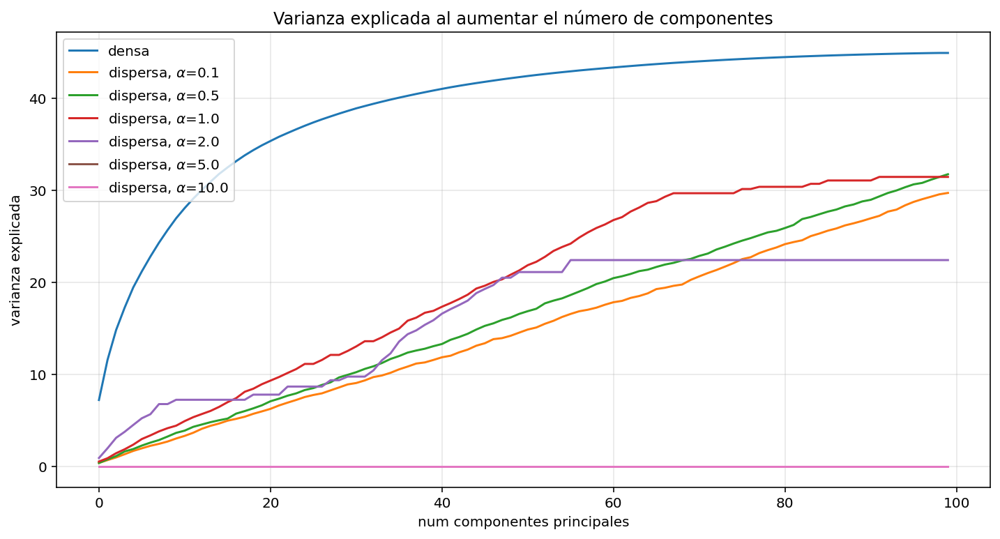

In [154]:
plt.figure(figsize=(12,6))
plt.plot(np.cumsum(pca5.explained_variance_), label='densa')
for alfa in v_alpha:
    plt.plot(d_exp_var_sparse[alfa], label='dispersa, $\\alpha$={0:.1f}'.format(alfa))
plt.xlabel('num componentes principales')
plt.ylabel('varianza explicada')
plt.legend()
plt.grid(alpha=0.3)
_=plt.title('Varianza explicada al aumentar el número de componentes')

Las componentes dispersas

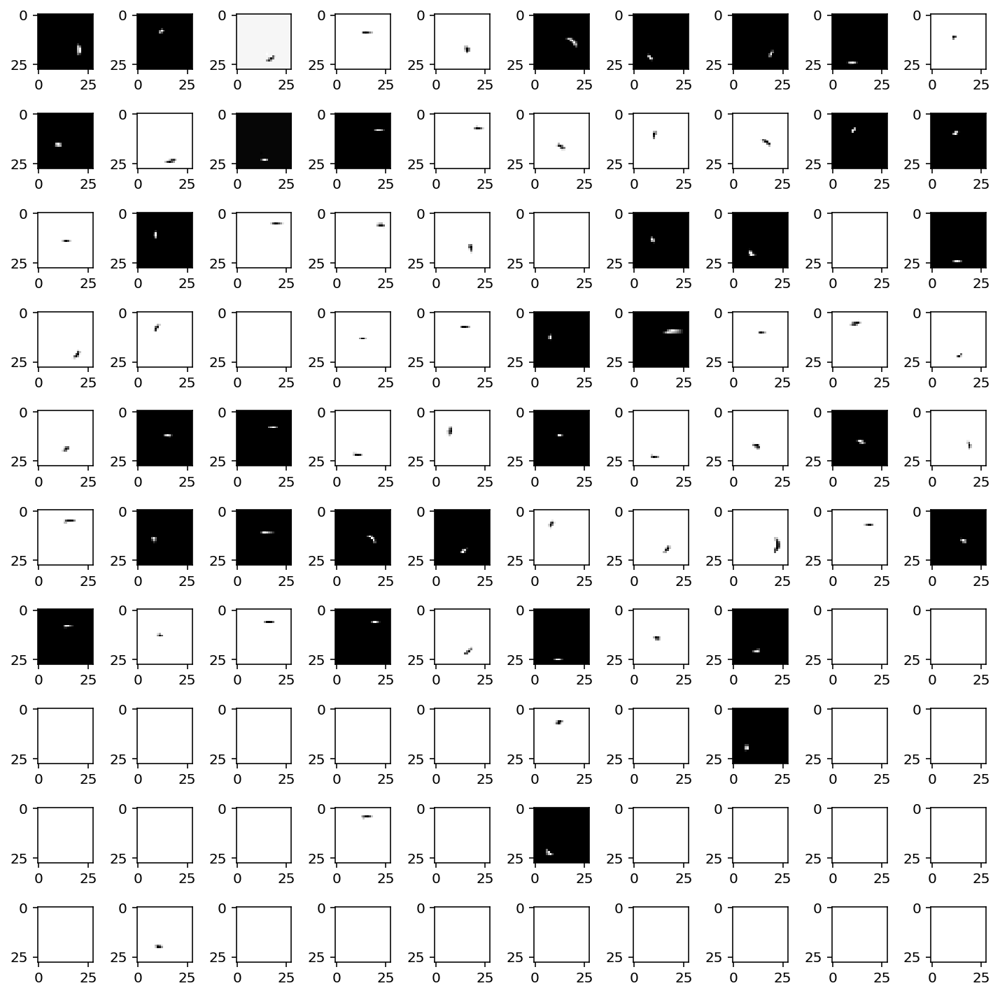

In [189]:
nrows = 10
ncols = 10
ff,aa = plt.subplots(nrows, ncols,figsize=(10,10))
ii = 0
for rr in range(nrows):
    for cc in range(ncols):
        aa[rr][cc].imshow(d_sparse_pca[1].components_[ii,:].reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')
        ii += 1
ff.tight_layout()  


Las reconstrucciones usando las componentes principales dispersas

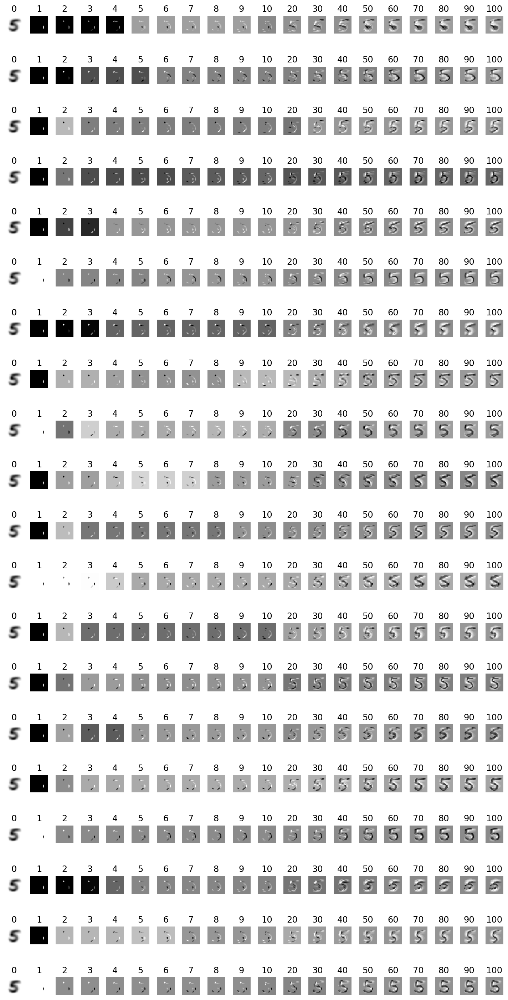

In [155]:
ncols=20
nrows = 20
ff,aa = plt.subplots(nrows, ncols,figsize=(10,20))

mx = np.mean(X[cincos,:],0)
spca = d_sparse_pca[1]
S5 = spca.transform(X[cincos,:])

icc = 0
for rr in range(nrows):
    aa[rr][icc].set_axis_off()
    aa[rr][icc].imshow((mx).reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')   
    aa[rr][icc].set_title(repr(0))
for icc,cc in enumerate([1,2,3,4,5,6,7,8,9,10,20,30, 40, 50, 60, 70, 80, 90, 100]):
    Xtilde = S5[:,:cc].dot(spca.components_[:cc,:])
    for rr in range(nrows):
        aa[rr][icc+1].set_axis_off()
        aa[rr][icc+1].imshow((Xtilde[rr]).reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')
        
        aa[rr][icc+1].set_title(repr(cc))
ff.tight_layout()   

Aplicando a todos los dígitos

In [156]:
todos_ss = []
for cc in range(10):
    todos_ss += (np.where(Y==cc)[0][:20]).tolist()
todos_ss = np.array(todos_ss)


In [157]:
d_sparse_pca_a = {}
d_exp_var_sparse_a = {}
v_alpha = [.5 , 1, 2, 5, 10]
for alfa in v_alpha:
    d_sparse_pca_a[alfa] = SparsePCA(n_components=100, alpha=alfa, random_state=0).fit(X[todos_ss,:])
    Sa = d_sparse_pca_a[alfa].transform(X[todos_ss,:])
    d_exp_var_sparse_a[alfa] = np.cumsum(np.var(Sa,0))
pca_a = PCA(n_components=100)

Za = pca_a.fit_transform(X[todos_ss,:])

exp_var_dense_a = np.cumsum(np.var(Z,0))


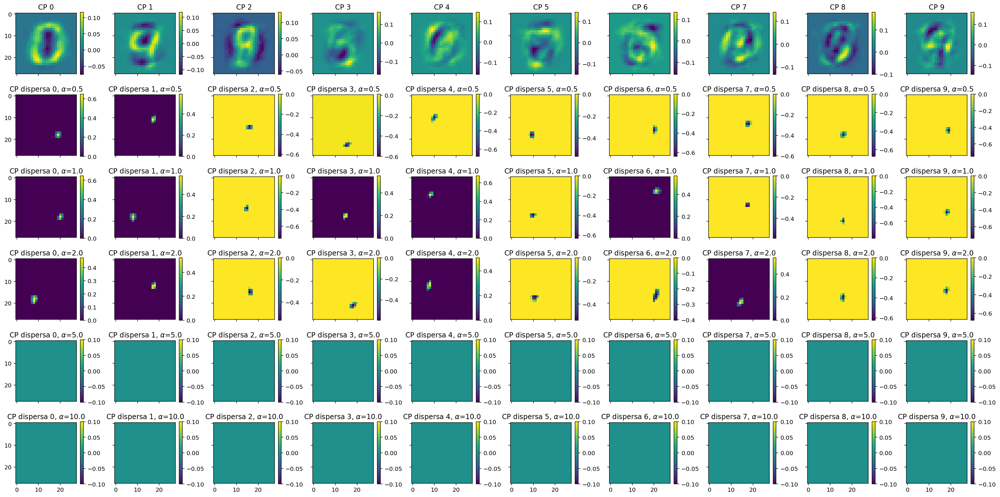

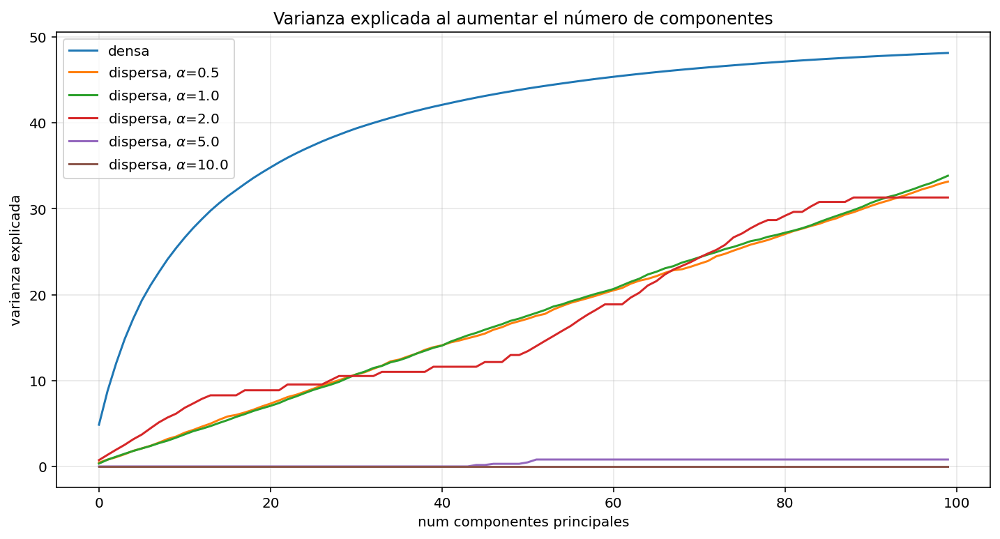

In [158]:

ff,aa = plt.subplots(1+len(v_alpha),10,sharex=True, sharey=True, figsize=(24,12))
for cc in range(10):
    ax = aa[0,cc]
    vv=ax.imshow(pca_a.components_[cc,:].reshape(28,28),interpolation='nearest')
    ff.colorbar(vv,ax=ax)
    ax.set_title('CP {0:d}'.format(cc))
    for rr,alfa in enumerate(v_alpha):
        ax = aa[1+rr,cc]
        vv=ax.imshow(d_sparse_pca_a[alfa].components_[cc,:].reshape(28,28),interpolation='nearest')
        ff.colorbar(vv,ax=ax)
        ax.set_title('CP dispersa {0:d}, $\\alpha$={1:.1f}'.format(cc,alfa))
    
ff.tight_layout()

plt.figure(figsize=(12,6))
plt.plot(np.cumsum(pca_a.explained_variance_), label='densa')
for alfa in v_alpha:
    plt.plot(d_exp_var_sparse_a[alfa], label='dispersa, $\\alpha$={0:.1f}'.format(alfa))
plt.xlabel('num componentes principales')
plt.ylabel('varianza explicada')
plt.legend()
plt.grid(alpha=0.3)
_=plt.title('Varianza explicada al aumentar el número de componentes')

Para `alpha=1`. Las 100 primeras componentes dispersas son:


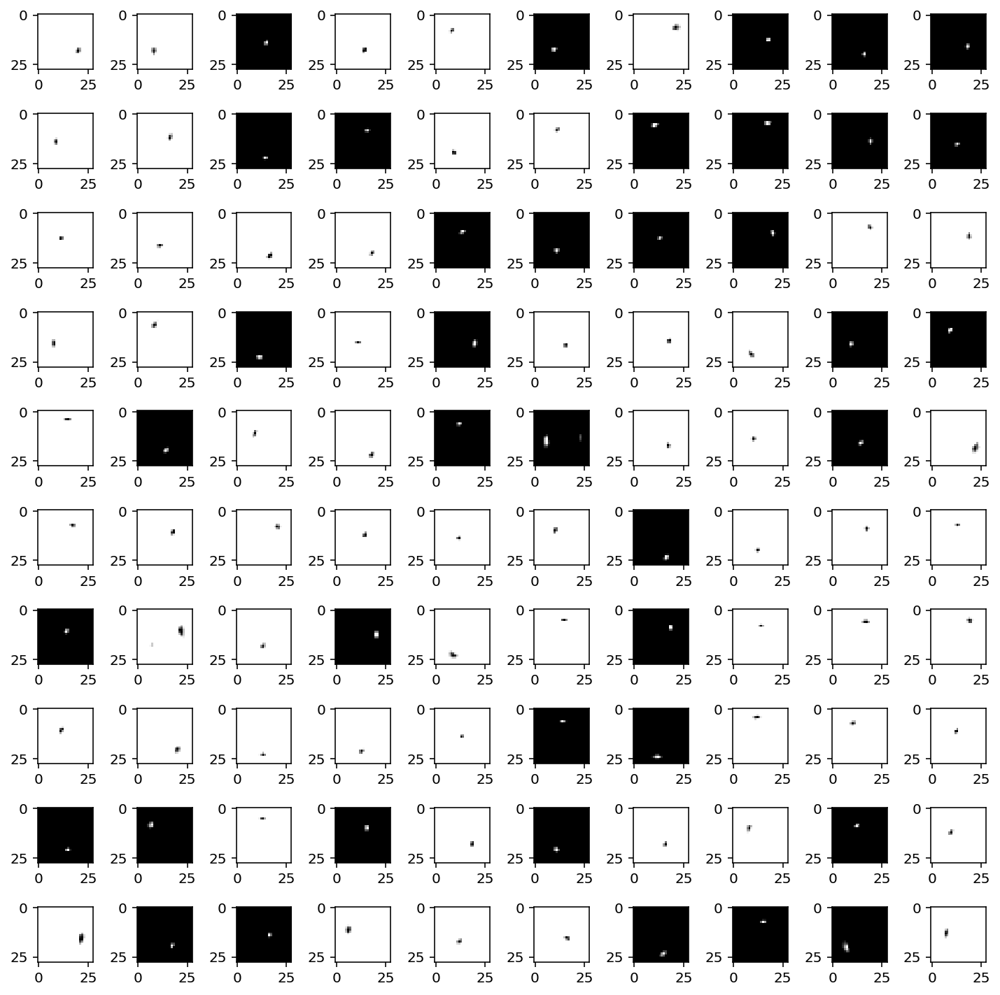

In [190]:
nrows = 10
ncols = 10
ff,aa = plt.subplots(nrows, ncols,figsize=(10,10))
ii = 0
for rr in range(nrows):
    for cc in range(ncols):
        
        aa[rr][cc].imshow(d_sparse_pca_a[1].components_[ii,:].reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')
        ii += 1
ff.tight_layout()  


Las reconstrucciones

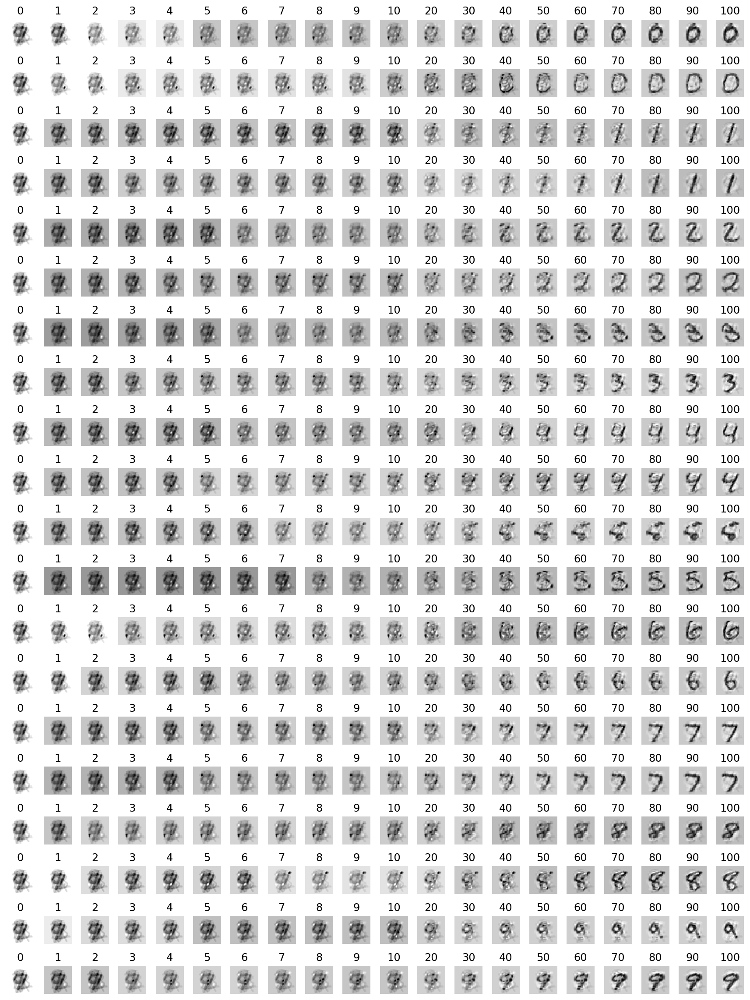

In [184]:
ncols=20
nrows = 20
ff,aa = plt.subplots(nrows, ncols,figsize=(12,16))

mx = np.mean(X[todos_ss,:],0)
spca = d_sparse_pca_a[1]
S5 = spca.transform(X[todos_s,:])

icc = 0
for rr in range(nrows):
    aa[rr][icc].set_axis_off()
    aa[rr][icc].imshow((mx).reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')   
    aa[rr][icc].set_title(repr(0))
for icc,cc in enumerate([1,2,3,4,5,6,7,8,9,10,20,30, 40, 50, 60, 70, 80, 90, 100]):
    Xtilde = S5[:,:cc].dot(spca.components_[:cc,:])
    for rr in range(nrows):
        aa[rr][icc+1].set_axis_off()
        aa[rr][icc+1].imshow((mx+Xtilde[rr]).reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')
        
        aa[rr][icc+1].set_title(repr(cc))
ff.tight_layout()   

## Kernel PCA

El *kernel trick* nos ayuda a construir versiones no lineales de algoritmos lineales siempre que las contribuciones de las observaciones que forman el conjunto de entrenamiento se reduzcan exclusivamente a productos escalares entre pares de observaciones.

En el caso del PCA, esta condición se verifica por los siguientes hechos:

- Las **componentes principales** son combinaciones lineales de las observaciones que forman el conjunto de entrenamiento. Esto es así porque las componentes principales son los autovectores de la matriz $C_{XX} = \frac{1}{N}X^\top X$, y los autovectores de $C_{XX}$ están relacionados con los de $X$ por:
$$
X = VDU^\top
$$ con $V$ y $U$ ortogonales, luego
$$
\frac{1}{N}X^\top X = \frac{1}{N}UDV^\top V D U^\top = \frac{1}{N}UD^2U^\top = C_{XX}
$$
Es decir, los autovectores de $C_{XX}$ también lo son de $X$, y por tanto pueden escribirse como combinaciones lineales de las filas de $X$. Escrito de otro modo:
$$
\mathbf u_j = \sum_{i=1}^N{\beta_{j,i}\mathbf x_i}
$$


- Para proyectar una observación sobre las componentes principales (aplicar el método `transform`) solo hay que calcular el producto escalar entre la observación y la componente principal:

$$
\mathbf x_t \rightarrow \mathbf z_t= U\mathbf x_t =  \left [ \begin{array}{c} \mathbf u_1^\top \\ \mathbf u_2^\top \\ \vdots \\ \mathbf u_{q-1}^\top \\ \mathbf u_q^\top \end{array}\right ]\mathbf x_t = \left [ \begin{array}{c} \mathbf u_1^\top\mathbf x_t \\ \mathbf u_2^\top\mathbf x_t \\ \vdots \\ \mathbf u_{q-1}^\top\mathbf x_t \\ \mathbf u_q^\top\mathbf x_t \end{array}\right ] = \left [ \begin{array}{c} \sum_{i=1}^N{\beta_{1,i}\mathbf x_i}^\top\mathbf x_t \\ \sum_{i=1}^N{\beta_{2,i}\mathbf x_i}^\top\mathbf x_t \\ \vdots \\ \sum_{i=1}^N{\beta_{q-1,i}\mathbf x_i}^\top\mathbf x_t \\ \sum_{i=1}^N{\beta_{q,i}\mathbf x_i}^\top\mathbf x_t \end{array}\right ] = 
$$

Aplicando el *kernel trick* podemos reemplazar los productos escalares por evaluaciones de funciones *kernel*:

$$
\left [ \begin{array}{c} \sum_{i=1}^N{\beta_{1,i} \kappa(\mathbf x_i, \mathbf x_t)} \\ \sum_{i=1}^N{\beta_{2,i}\kappa(\mathbf x_i, \mathbf x_t)} \\ \vdots \\ \sum_{i=1}^N{\beta_{q-1,i}\kappa(\mathbf x_i, \mathbf x_t)} \\ \sum_{i=1}^N{\beta_{q,i}\kappa(\mathbf x_i, \mathbf x_t)} \end{array}\right ]
$$



## Formulación del KPCA 

El objetivo del KPCA es encontrar las proyecciones que maximicen la varianza de los datos proyectados, pero **en el espacio de características inducido por el kernel**. Al elegir el *kernel* $\kappa()$ implícitamente estamos asumiendo una proyección a un espacio de características $\boldsymbol \phi(\mathbf x)$ tal que dadas dos observaciones en el espacio original $\mathbf x_i$ $\mathbf x_j$:

$$
\kappa(\mathbf x_i, \mathbf x_j) = \boldsymbol \phi(\mathbf x_i)^\top \boldsymbol \phi(\mathbf x_j)
$$

Desde el punto de vista del algoritmo, si conociésemos explícitamente la transformación $\boldsymbol \phi(\mathbf x)$, KPCA equivale a aplicar PCA con la matriz de entrada $\boldsymbol \Phi$, que es la que tiene por filas las transformadas de las filas de $X$: la fila $i$ de $\boldsymbol \Phi$ es $\boldsymbol \phi(\mathbf x_i)^\top$, es decir, la transformada de la fila $i$ de $X$.

###  Obtención de los autovectores y autovalores de la matriz de covarianzas en el espacio de características.

Vamos a llamar $\boldsymbol S$ a la matriz de covarianzas en el espacio de características inducido por el kernel. Al igual que se hizo para el PCA original, la matriz de covarianzas podría estimarse a partir de muestras. En este caso, las muestras que emplearíamos  serían las proyecciones de las observaciones que forman el conjunto de entrenamiento: $\boldsymbol \phi(\mathbf x_i)$, $i=1,\dots,N$.

Lo primero que tenemos que notar es que aunque los datos de entrada estén centrados en el espacio original (la media de los $\mathbf x_i$ sea nula) la transformación $\boldsymbol \phi()$ **no tiene por qué conservar la media**, es decir, que no debemos partir de la asunción de que los datos estén centrados en el espacio de características.

En el caso general, la estimación de $\boldsymbol S$ pasa por centrar los datos en el espacio de características. Para ello hay que restarles la media a todas las proyecciones.

La media $\boldsymbol \mu$ la podemos estimar a partir de las proyecciones de las observaciones:
$$
\boldsymbol \mu = \frac{1}{N}\sum_{i=1}^N{\boldsymbol \phi(\mathbf x_i)}
$$

Entonces la matriz de covarianzas en el espacio de características se puede estimar como
$$
\boldsymbol S = \frac{1}{N}\sum_{i=1}^N{\left (\boldsymbol \phi(\mathbf x_i)-\boldsymbol \mu\right) \left(\boldsymbol \phi(\mathbf x_i)-\boldsymbol \mu\right)^\top}
$$

$$
= \frac{1}{N}\sum_{i=1}^N{\boldsymbol \phi(\mathbf x_i)\boldsymbol \phi(\mathbf x_i)^\top} -
\frac{2}{N}\sum_{i=1}^N{\boldsymbol \phi(\mathbf x_i)\boldsymbol \mu^\top} + 
\frac{1}{N}\sum_{i=1}^N{\boldsymbol \mu\boldsymbol \mu^\top}
$$

$$
= \frac{1}{N}\sum_{i=1}^N{\boldsymbol \phi(\mathbf x_i)\boldsymbol \phi(\mathbf x_i)^\top} -
\frac{2}{N}\sum_{i=1}^N{\boldsymbol \phi(\mathbf x_i)\boldsymbol \mu^\top} + 
\boldsymbol \mu\boldsymbol \mu^\top
$$



$$
= \frac{1}{N}\sum_{i=1}^N{\boldsymbol \phi(\mathbf x_i)\boldsymbol \phi(\mathbf x_i)^\top} -
\frac{2}{N^2}\sum_{i=1}^N{\boldsymbol \phi(\mathbf x_i)}\sum_{j=1}^N{\boldsymbol \phi(\mathbf x_j)^\top} + 
\frac{1}{N^2}\sum_{i=1}^N{\boldsymbol \phi(\mathbf x_i)}\sum_{j=1}^N{\boldsymbol \phi(\mathbf x_j)^\top}
$$

$$
=\frac{1}{N}\sum_{i=1}^N{\boldsymbol \phi(\mathbf x_i)\boldsymbol \phi(\mathbf x_i)^\top} -
\frac{1}{N^2}\sum_{i=1}^N{\boldsymbol \phi(\mathbf x_i)}\sum_{j=1}^N{\boldsymbol \phi(\mathbf x_j)^\top}
$$


Si pasamos a la notación matricial: $\boldsymbol \Phi$ es una matriz donde la fila $i$ es $\boldsymbol \phi(\mathbf x_i)^\top$

$$
\boldsymbol \Phi = \left [ \begin{array}{c}\phi(\mathbf x_1)^\top \\ \phi(\mathbf x_2)^\top \\ \vdots \\ \phi(\mathbf x_N)^\top \end{array}\right ]
$$

Entonces $\sum_{i=1}^N{\boldsymbol \phi(\mathbf x_i)\boldsymbol \phi(\mathbf x_i)^\top}$ puede escribirse como:

$$
\sum_{i=1}^N{\boldsymbol \phi(\mathbf x_i)\boldsymbol \phi(\mathbf x_i)^\top} = \left [ \begin{array}{cccc}\phi(\mathbf x_1) & \phi(\mathbf x_2)  & \cdots & \phi(\mathbf x_N) \end{array}\right ] \left [ \begin{array}{c}\phi(\mathbf x_1)^\top \\ \phi(\mathbf x_2)^\top \\ \vdots \\ \phi(\mathbf x_N)^\top \end{array}\right ] = \boldsymbol \Phi^\top \boldsymbol \Phi
$$

Y $\sum_{i=1}^N{\boldsymbol \phi(\mathbf x_i)}$ puede escribirse como

$$
\sum_{i=1}^N{\boldsymbol \phi(\mathbf x_i)}= \left [ \begin{array}{cccc}\phi(\mathbf x_1) & \phi(\mathbf x_2)  & \cdots & \phi(\mathbf x_N) \end{array}\right ] \left [ \begin{array}{c}1 \\ 1 \\ \vdots \\ 1 \end{array}\right ] = \boldsymbol \Phi^\top \mathbf 1
$$

con lo que el segundo término puede escribirse como

$$
\frac{1}{N^2}\sum_{i=1}^N{\boldsymbol \phi(\mathbf x_i)}\sum_{j=1}^N{\boldsymbol \phi(\mathbf x_j)^\top} = \frac{1}{N^2}\boldsymbol \Phi^\top \mathbf 1 \mathbf 1^\top \boldsymbol \Phi
$$

Juntamos los dos términos

$$
\boldsymbol S = \frac{1}{N} \boldsymbol \Phi^\top \boldsymbol \Phi - \frac{1}{N^2}\boldsymbol \Phi^\top \mathbf 1 \mathbf 1^\top \boldsymbol \Phi = \frac{1}{N} \boldsymbol \Phi^\top \left ( \mathbb I - \frac{1}{N}\mathbf 1 \mathbf 1^\top\right ) \boldsymbol \Phi
$$

El problema de autovectores y autovalores se define como encontrar los vectores $\mathbf v_k$ y escalares $\lambda_k$ que verifican que

$$
\boldsymbol S \mathbf v_k= \lambda_k \mathbf v_k
$$



Antes hemos empleado el resultado de que los autovectores son combinaciones lineales de las observaciones. Esto se debe cumplir también en el espacio de características. Por lo tanto cada autovector $\mathbf v_k$ va a poder escribirse como una suma de las observaciones proyectadas al espacio de características, $\boldsymbol \phi(\mathbf x_i)$, ponderadas por unos coeficientes $\beta_{k,i}$ ($k$ se refiere a la componente principal $k$-ésima e $i$ a la observación $i$-ésima).

$$
\mathbf v_k = \sum_{i=1}^N{\beta_{k,i} \boldsymbol \phi(\mathbf x_i)}
$$

Esto se puede expresar matricialmente como
$$
\left [ \begin{array}{cccc}\phi(\mathbf x_1) & \phi(\mathbf x_2)  & \cdots & \phi(\mathbf x_N) \end{array}\right ] \left [ \begin{array}{c}\beta_{k,1} \\ \beta_{k,2} \\ \vdots \\ \beta_{k,N} \end{array}\right ] = \boldsymbol \Phi^\top \boldsymbol \beta_k
$$


Sustituyendo en el problema de autovalores $\boldsymbol S$ por su estimación a partir de las observaciones proyectadas (y centradas) y $\mathbf v_k$ por su combinación lineal de observaciones de entrada llegamos a:

$$
\left ( \frac{1}{N} \boldsymbol \Phi^\top \left ( \mathbb I - \frac{1}{N}\mathbf 1 \mathbf 1^\top\right ) \boldsymbol \Phi\right ) \boldsymbol \Phi^\top \boldsymbol \beta_k = \lambda_k \boldsymbol \Phi^\top \boldsymbol \beta_k
$$

El producto matricial 
$$
\boldsymbol \Phi \boldsymbol \Phi^\top
$$

puede escribirse como:

$$
\boldsymbol \Phi \boldsymbol \Phi^\top = 
\left [ \begin{array}{c}\phi(\mathbf x_1)^\top \\ \phi(\mathbf x_2)^\top \\ \vdots \\ \phi(\mathbf x_N)^\top \end{array}\right ] \left [ \begin{array}{cccc}\phi(\mathbf x_1) & \phi(\mathbf x_2)  & \cdots & \phi(\mathbf x_N) \end{array}\right ]  = \left [ \begin{array}{cccc}\phi(\mathbf x_1)^\top \phi(\mathbf x_1) & \phi(\mathbf x_1)^\top\phi(\mathbf x_2)  & \cdots & \phi(\mathbf x_1)^\top\phi(\mathbf x_N) \\ \phi(\mathbf x_2)^\top \phi(\mathbf x_1) & \phi(\mathbf x_2)^\top\phi(\mathbf x_2)  & \cdots & \phi(\mathbf x_2)^\top\phi(\mathbf x_N) \\ \vdots & \vdots & \ddots & \vdots \\ \phi(\mathbf x_N)^\top \phi(\mathbf x_1) & \phi(\mathbf x_N)^\top\phi(\mathbf x_2)  & \cdots & \phi(\mathbf x_N)^\top\phi(\mathbf x_N) \end{array}\right ] 
$$

aplicando el *truco del kernel* 

$$
\boldsymbol \Phi \boldsymbol \Phi^\top = 
 \left [ \begin{array}{cccc}\kappa(\mathbf x_1,\mathbf x_1) & \kappa(\mathbf x_1,\mathbf x_2) & \cdots & \kappa(\mathbf x_1,\mathbf x_N) \\ \kappa(\mathbf x_2,\mathbf x_1) & \kappa(\mathbf x_2,\mathbf x_2)  & \cdots &\kappa(\mathbf x_2,\mathbf x_N)  \\ \vdots & \vdots & \ddots & \vdots \\ \kappa(\mathbf x_N,\mathbf x_1)  & \kappa(\mathbf x_N,\mathbf x_2) & \cdots & \kappa(\mathbf x_N,\mathbf x_N) \end{array}\right ] 
$$

Esta matriz que contiene todos los pares posibles de evaluaciones de la función *kernel* entre observaciones del conjunto de entrenamiento se conoce como **matriz de kernels** y vamos a denominarla con la letra $K$.

$$
K = \boldsymbol \Phi \boldsymbol \Phi^\top = \left [ \begin{array}{cccc}\kappa(\mathbf x_1,\mathbf x_1) & \kappa(\mathbf x_1,\mathbf x_2) & \cdots & \kappa(\mathbf x_1,\mathbf x_N) \\ \kappa(\mathbf x_2,\mathbf x_1) & \kappa(\mathbf x_2,\mathbf x_2)  & \cdots &\kappa(\mathbf x_2,\mathbf x_N)  \\ \vdots & \vdots & \ddots & \vdots \\ \kappa(\mathbf x_N,\mathbf x_1)  & \kappa(\mathbf x_N,\mathbf x_2) & \cdots & \kappa(\mathbf x_N,\mathbf x_N) \end{array}\right ] 
$$


Si premultiplicamos por $\boldsymbol \Phi$ la ecuación del problema de autovalores:

$$
\boldsymbol \Phi  \frac{1}{N} \boldsymbol \Phi^\top \left ( \mathbb I - \frac{1}{N}\mathbf 1 \mathbf 1^\top\right ) \boldsymbol \Phi \boldsymbol \Phi^\top \boldsymbol \beta_k = \lambda_k \boldsymbol \Phi \boldsymbol \Phi^\top \boldsymbol \beta_k
$$

Reemplazando $K = \boldsymbol \Phi \boldsymbol \Phi^\top$

$$
 \frac{1}{N} K \left ( \mathbb I - \frac{1}{N}\mathbf 1 \mathbf 1^\top\right ) K \boldsymbol \beta_k = \lambda_k K \boldsymbol \beta_k
$$

Y premultiplicando por $K^{-1}$

$$
 \frac{1}{N}  \left ( \mathbb I - \frac{1}{N}\mathbf 1 \mathbf 1^\top\right )  K \boldsymbol \beta_k = \lambda_k  \boldsymbol \beta_k
$$


$$
  \left ( \mathbb I - \frac{1}{N}\mathbf 1 \mathbf 1^\top\right )  K \boldsymbol \beta_k = N\lambda_k  \boldsymbol \beta_k
$$

La expresión anterior nos describe una **relación uno a uno entre los autovectores de la matriz de covarianzas en el espacio proyectado y la matriz de kernels**. Si $\mathbf v_k$ es un autovector de la matriz de covarianzas del espacio de características ($\boldsymbol S$) con autovalor $\lambda_k$, entonces, el vector $\boldsymbol \beta_k$, que contiene los coeficientes que expresan $\mathbf v_k$  como una combinación lineal de los datos proyectados $\boldsymbol \phi(\mathbf x_i)$ es a su vez **autovector de la matriz de kernels centrada** $ \left ( \mathbb I - \frac{1}{N}\mathbf 1 \mathbf 1^\top\right )  K $ y con autovalor $N\lambda_k$.


Este resultado fundamenta el **algoritmo para calcular el KPCA**


- **Entrada:** $\bf K$, matriz de kernels

- **Proceso:**
    1. **Centrar** el kernel $\bf {\tilde K} \leftarrow \left ( \mathbb I - \frac{1}{N}\mathbf 1 \mathbf 1^\top\right )  K$
    
    2. $\bf B, \Lambda$ = eig($\bf{\tilde K}$)
    
    3. $\bf Z = \bf {\tilde K} \bf B_{:,:Q}$  

- **Salida:** $\bf Z$, $N\times Q$ matriz con la proyección de todas las muestras sobre las  $Q$ componentes principales en el espacio de características.

$Z_{ik}$ es la proyección de $\boldsymbol \phi(\mathbf x_i)$ sobre la $k$-ésima componente principal.

$$Z_{ik} = \boldsymbol \phi(\mathbf x_i)^\top \mathbf v_k = \boldsymbol \phi(\mathbf x_i)^\top\boldsymbol \Phi^\top \boldsymbol \beta_k = \boldsymbol \phi(\mathbf x_i)^\top\left [ \begin{array}{cccc}\boldsymbol \phi(\mathbf x_1) & \boldsymbol \phi(\mathbf x_2)  & \cdots & \boldsymbol \phi(\mathbf x_N) \end{array}\right ]  \boldsymbol \beta_k = 
$$
$$
= \left [ \begin{array}{cccc}\boldsymbol \phi(\mathbf x_i)^\top\boldsymbol \phi(\mathbf x_1) & \boldsymbol \phi(\mathbf x_i)^\top\boldsymbol \phi(\mathbf x_2)  & \cdots & \boldsymbol \phi(\mathbf x_i)^\top\boldsymbol \phi(\mathbf x_N) \end{array}\right ] \boldsymbol \beta_k =
$$

$$
=\left [ \begin{array}{cccc}\kappa(\mathbf x_i,\mathbf x_1) & \kappa(\mathbf x_i,\mathbf x_2)  & \cdots & \kappa(\mathbf x_i,\mathbf x_N) \end{array}\right ] \boldsymbol \beta_k = \boldsymbol \kappa_i^\top \boldsymbol \beta_k
$$

donde $\boldsymbol \kappa_i$ es un vector que contiene la evaluación del kernel entre $\mathbf x_i$ y todas las observaciones del conjunto de entrenamiento.

Vamos a generar datos *benchmark*  en dos dimensiones con estructuras no lineales para ver qué componentes principales obtendría un Kernel PCA. El Kernel PCA está implementado en scikit learn en la clase [KernelPCA](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.KernelPCA.html).

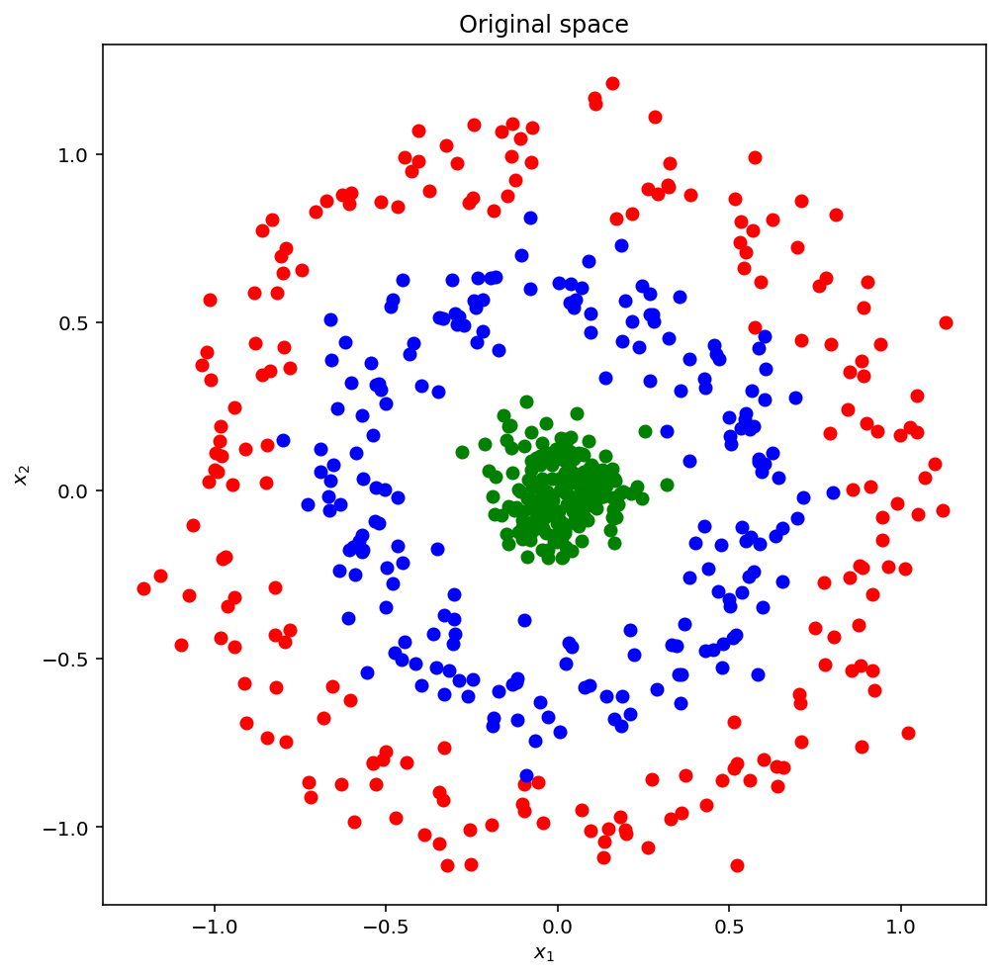

In [161]:
from sklearn.datasets import make_circles, make_moons

np.random.seed(0)
Xcc, Ycc = make_circles(n_samples=400, factor=.6, noise=.1)

X_c2 = 0.1*np.random.randn(200,2)
Y_c2 = 2*np.ones((200,))

Xcir= np.vstack([Xcc,X_c2])
Ycir= np.hstack([Ycc,Y_c2])

plt.figure(figsize=(8,8))
plt.title("Original space")
reds = Ycir == 0
blues = Ycir == 1
green = Ycir == 2

plt.plot(Xcir[reds, 0], Xcir[reds, 1], "ro")
plt.plot(Xcir[blues, 0], Xcir[blues, 1], "bo")
plt.plot(Xcir[green, 0], Xcir[green, 1], "go")
plt.xlabel("$x_1$")
plt.ylabel("$x_2$")
plt.show()




In [162]:
from sklearn.decomposition import PCA, KernelPCA

N_feat_max=2
gamma_value = .25

pca = PCA(n_components=N_feat_max).fit(Xcir)




En primer lugar vemos que un PCA lineal no es capaz de capturar ninguna estructura interesante en estos datos.

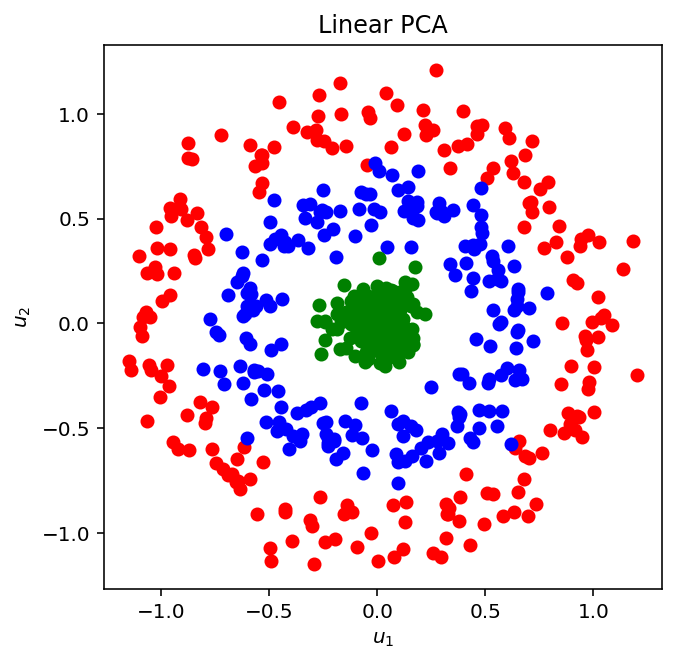

In [163]:
P_ = pca.transform(Xcir)

plt.figure(figsize=(5,5))
plt.plot(P_[reds, 0], P_[reds, 1], "ro")
plt.plot(P_[blues, 0], P_[blues, 1], "bo")
plt.plot(P_[green, 0], P_[green, 1], "go")
plt.xlabel("$u_1$")
plt.ylabel("$u_2$")
plt.title('Linear PCA')
plt.show()

Analizamos con KPCA usando *kernels* RBF con distintos valores del parámetro `gamma`.

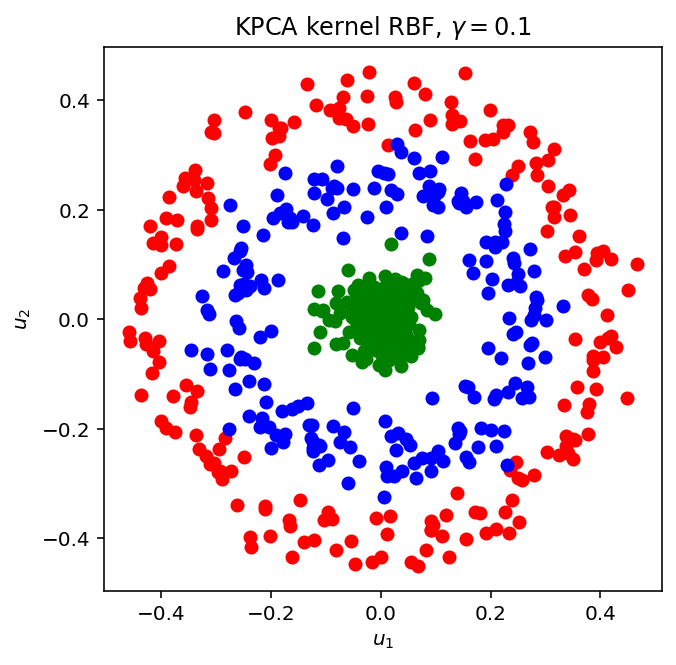

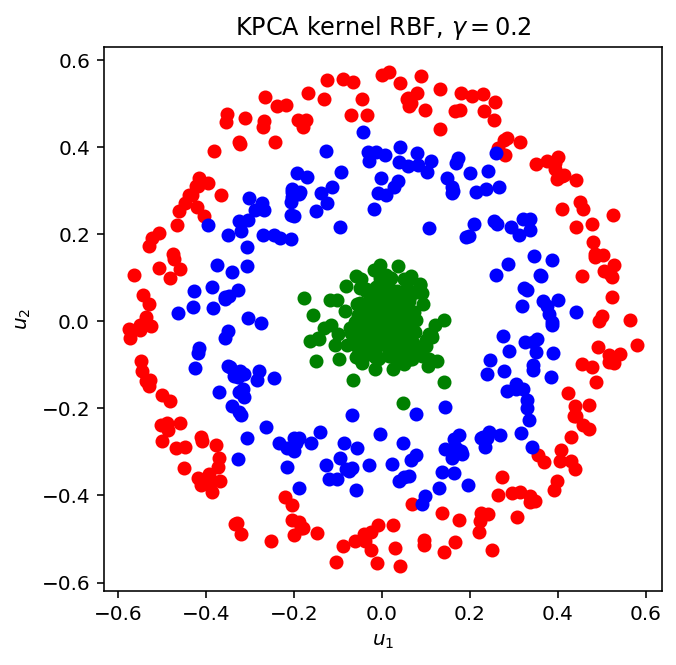

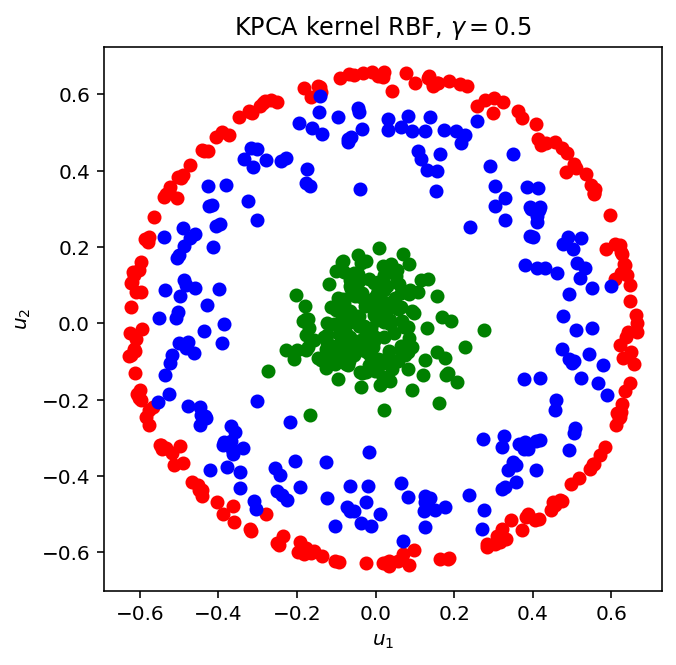

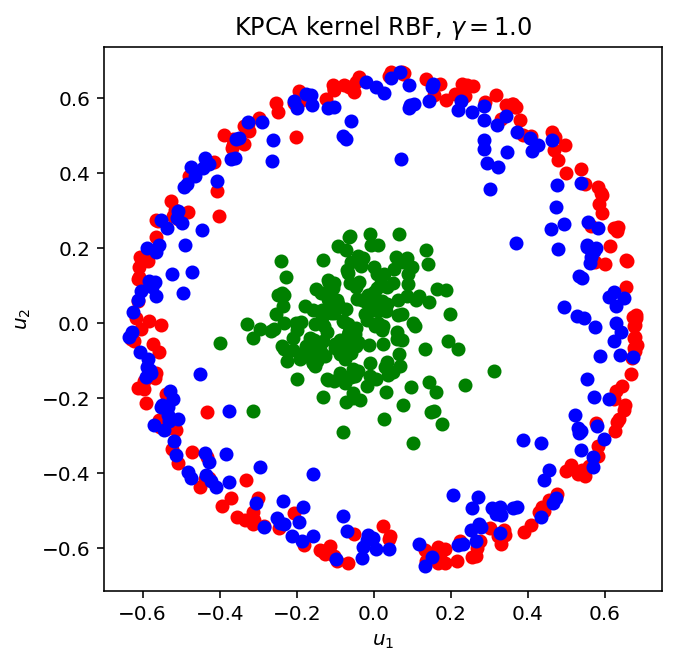

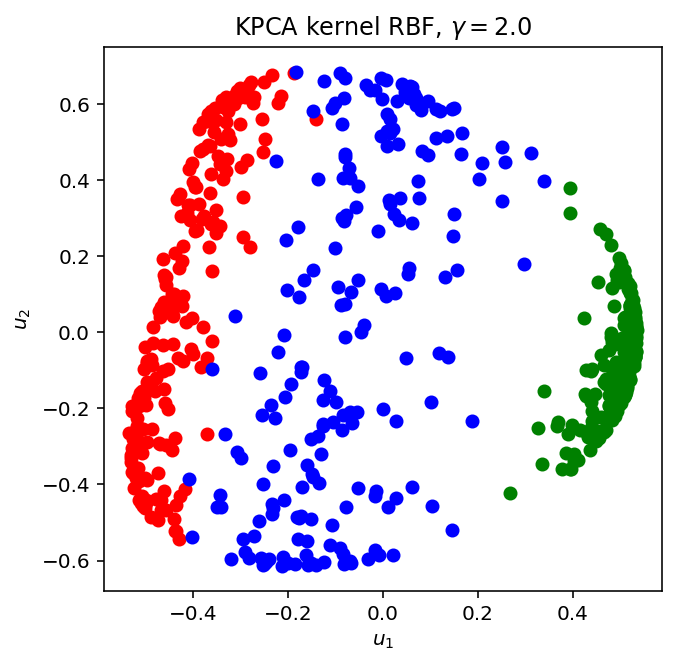

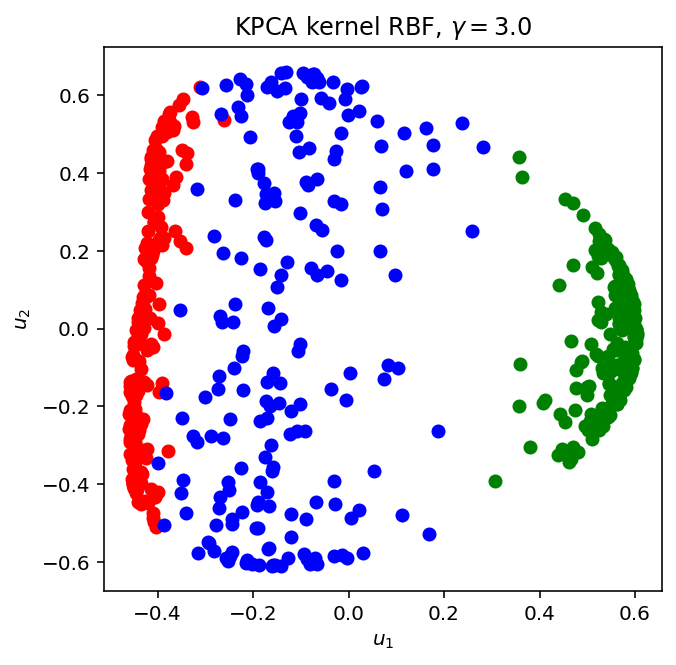

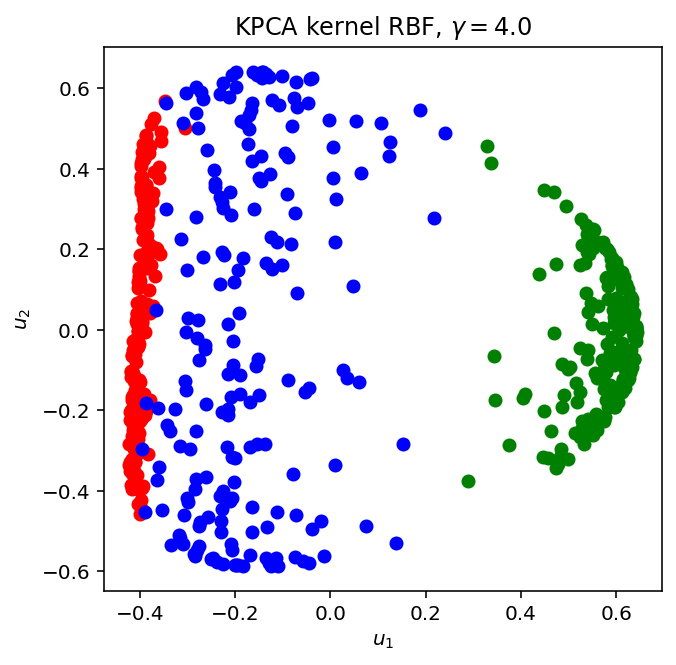

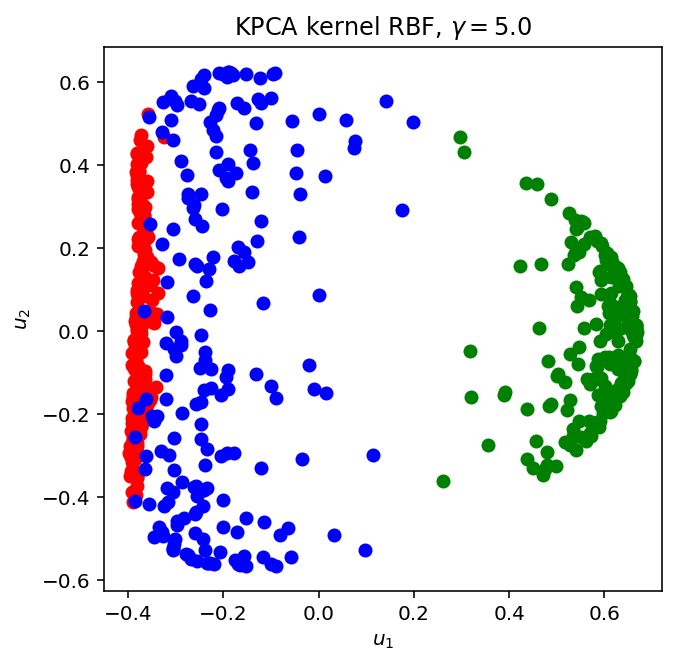

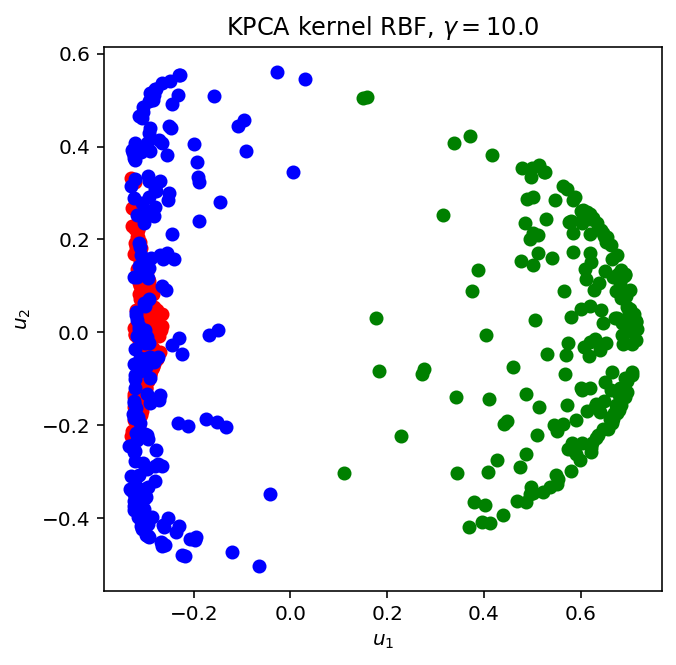

In [164]:
for gamma_value in [.1,.2,.5,1,2,3,4,5,10]:
    kpca = KernelPCA(n_components=N_feat_max, kernel='rbf', gamma=gamma_value)
    kpca.fit(Xcir)
    Pk_ = kpca.transform(Xcir)
    plt.figure(figsize=(5,5))
    plt.plot(Pk_[reds, 0], Pk_[reds, 1], "ro")
    plt.plot(Pk_[blues, 0], Pk_[blues, 1], "bo")
    plt.plot(Pk_[green, 0], Pk_[green, 1], "go")
    plt.xlabel("$u_1$")
    plt.ylabel("$u_2$")
    plt.title('KPCA kernel RBF, $\gamma={0:.1f}$'.format(gamma_value))
    plt.show()

Analizando con un *kernel* polinómico tampoco capturamos estructura.

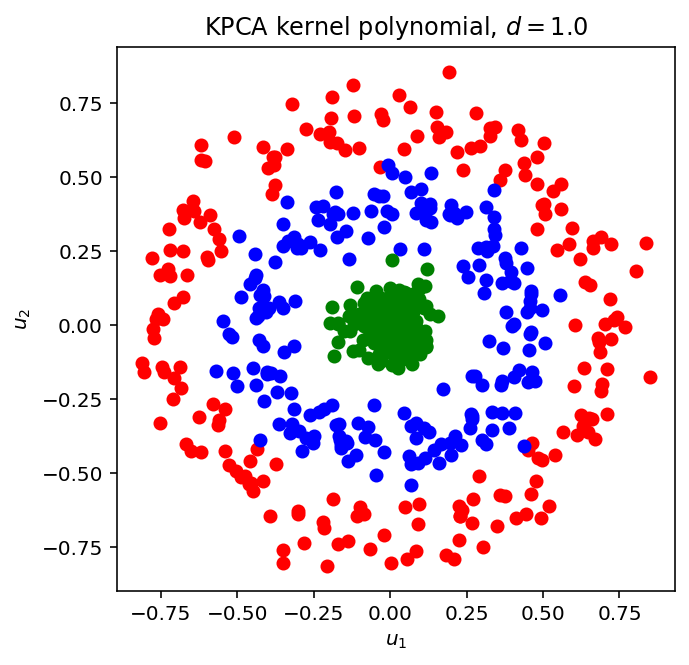

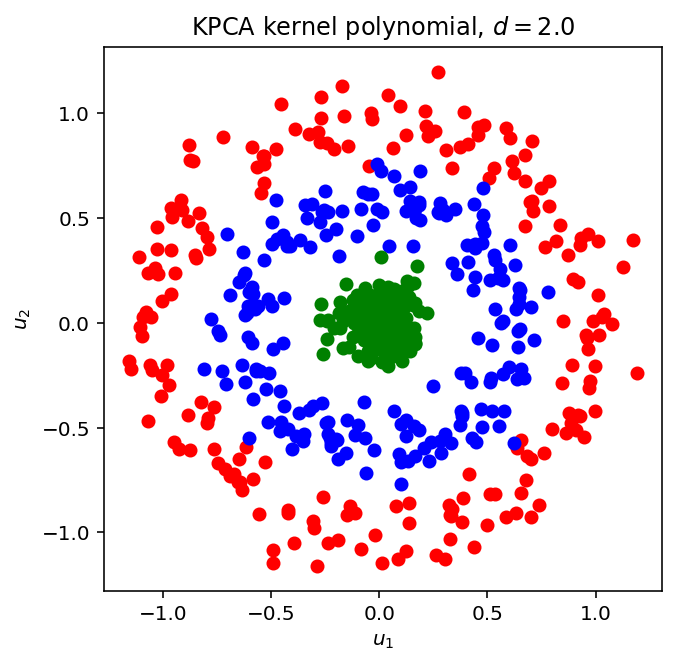

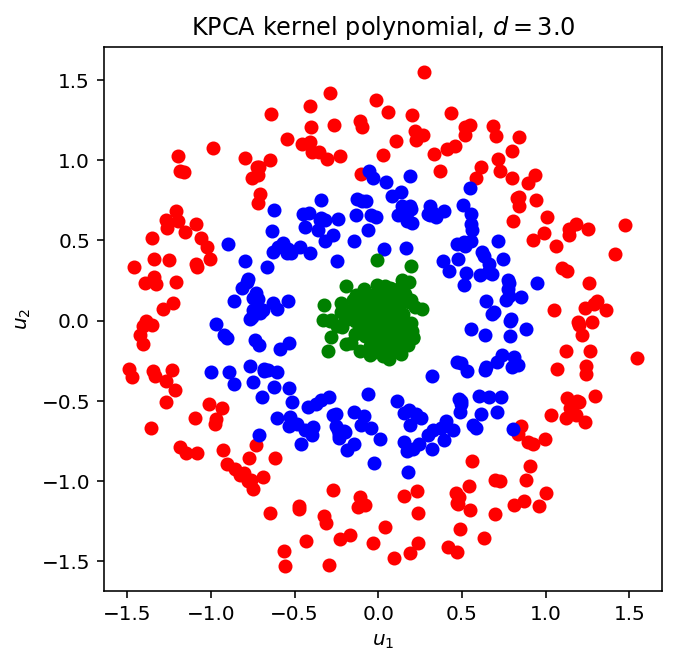

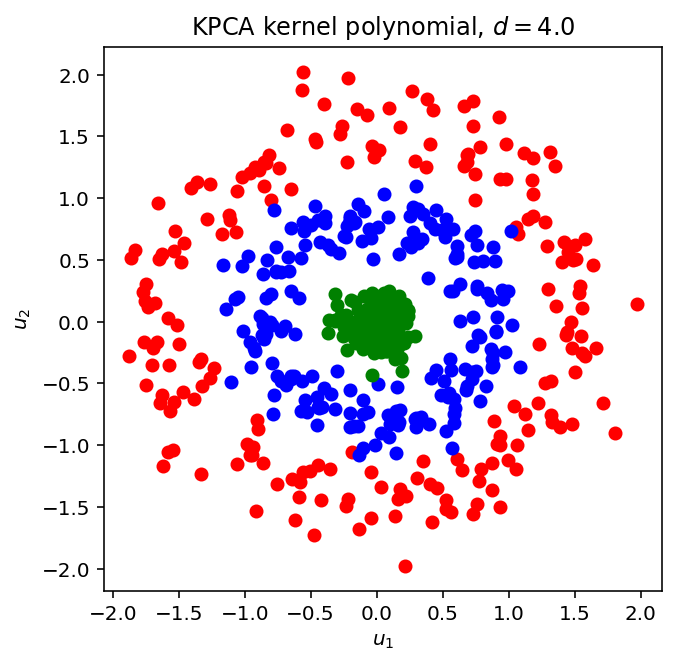

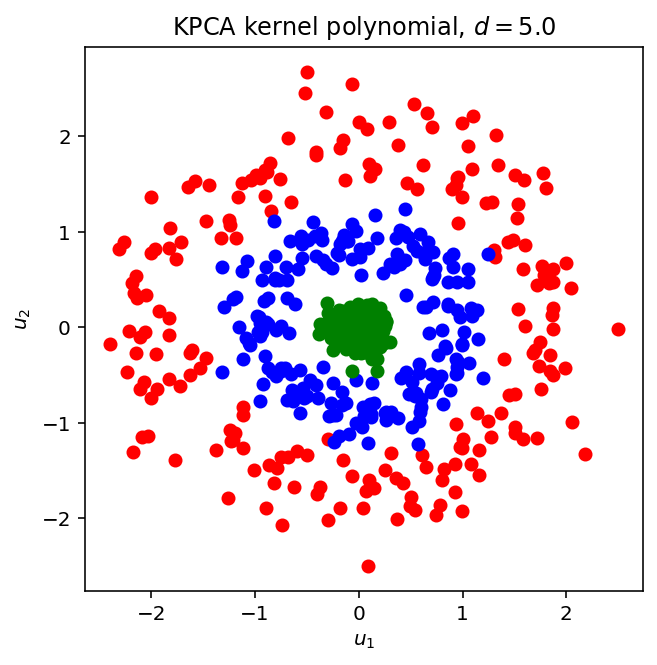

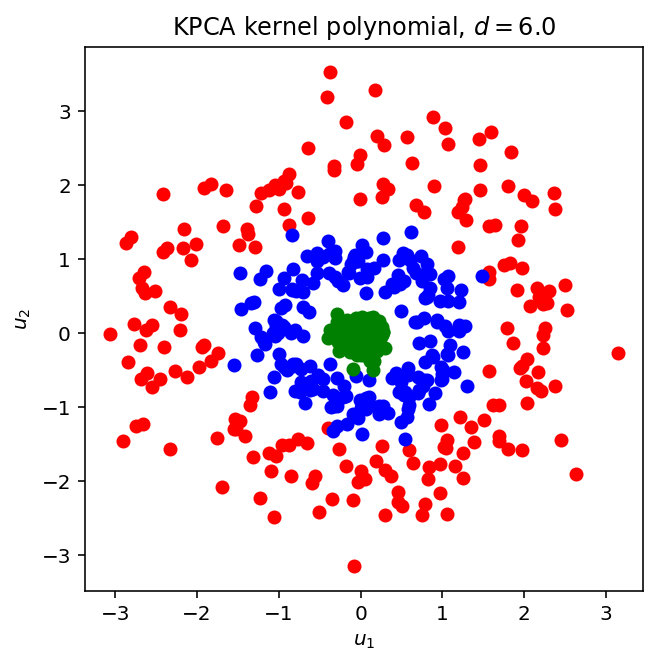

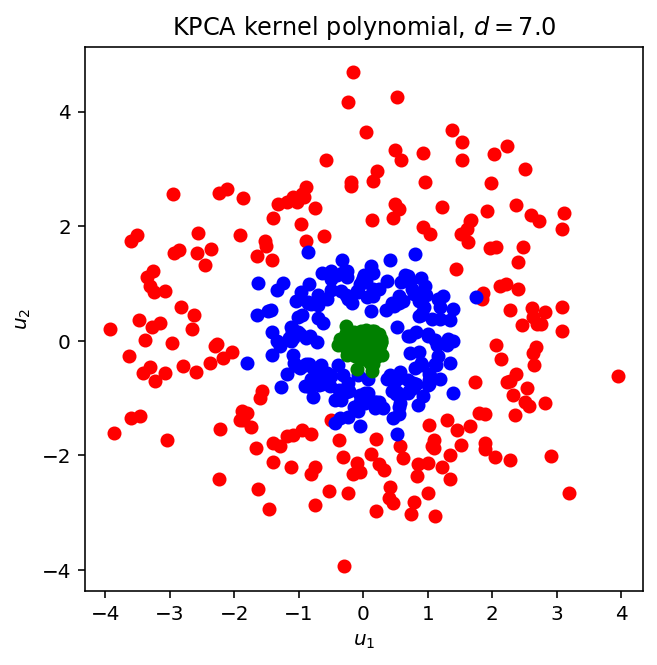

In [166]:
for degree in [1,2,3,4,5,6,7]:
    kpca = KernelPCA(n_components=N_feat_max, kernel='poly', degree=degree)
    kpca.fit(Xcir)
    Pk_ = kpca.transform(Xcir)
    plt.figure(figsize=(5,5))
    plt.plot(Pk_[reds, 0], Pk_[reds, 1], "ro")
    plt.plot(Pk_[blues, 0], Pk_[blues, 1], "bo")
    plt.plot(Pk_[green, 0], Pk_[green, 1], "go")
    plt.xlabel("$u_1$")
    plt.ylabel("$u_2$")
    plt.title('KPCA kernel polynomial, $d={0:.1f}$'.format(degree))
    plt.show()

Cambiamos el *benchmark*

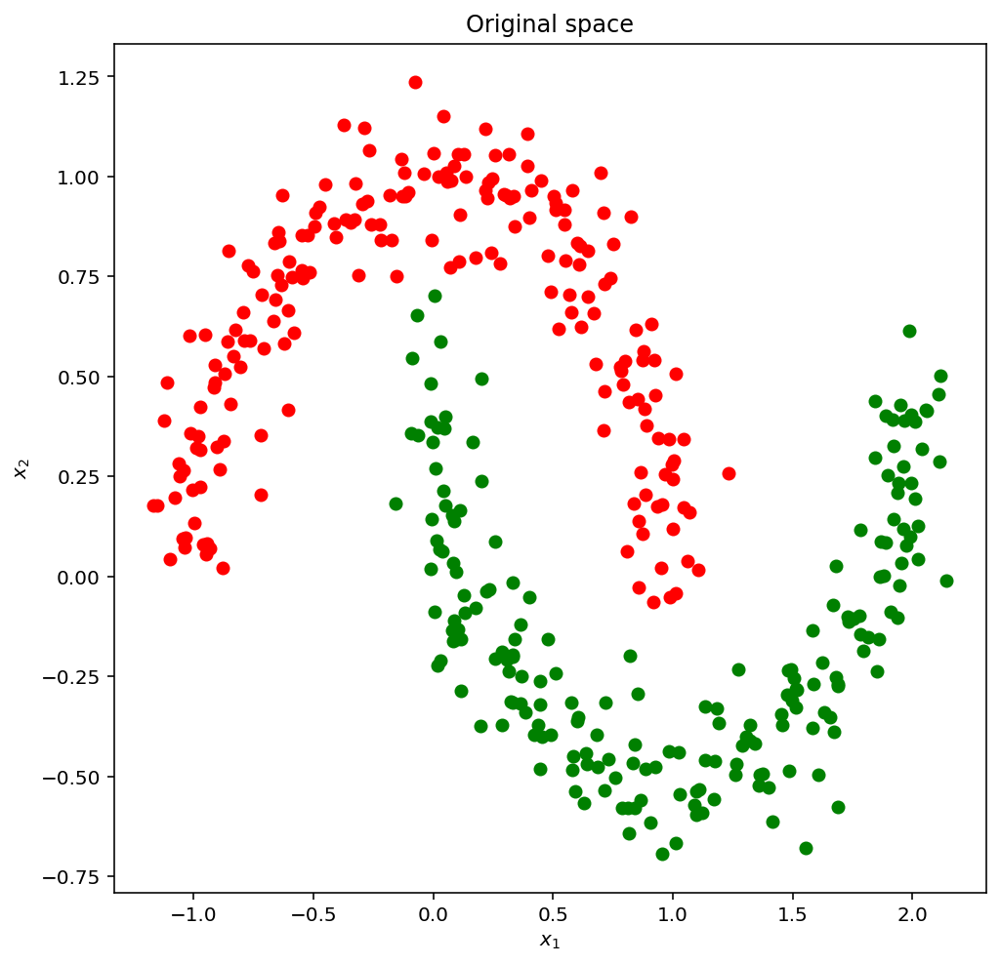

In [167]:
np.random.seed(0)
Xmoon, Ymoon = make_moons(n_samples=400,  noise=.1)



plt.figure(figsize=(8,8))
plt.title("Original space")
reds = Ymoon == 0
green = Ymoon == 1

plt.plot(Xmoon[reds, 0], Xmoon[reds, 1], "ro")
plt.plot(Xmoon[green, 0], Xmoon[green, 1], "go")
plt.xlabel("$x_1$")
plt.ylabel("$x_2$")
plt.show()

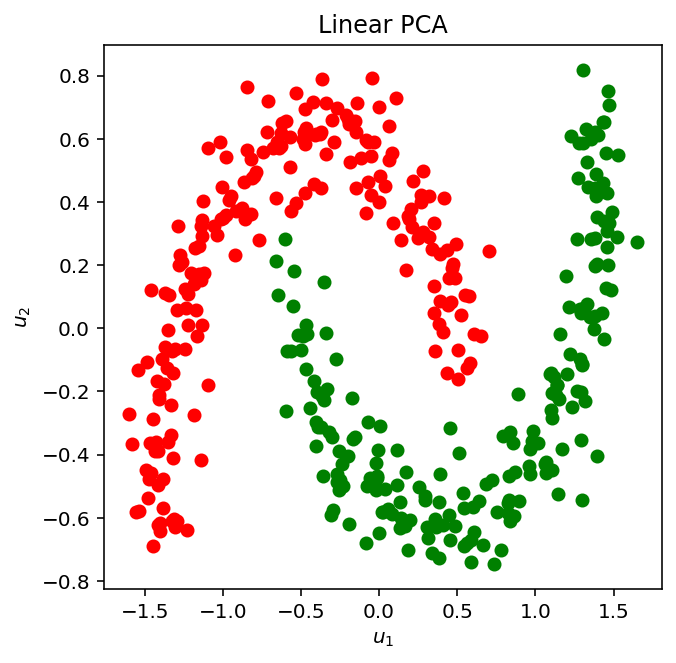

In [168]:
from sklearn.decomposition import PCA, KernelPCA

N_feat_max=2
gamma_value = .25

pca = PCA(n_components=N_feat_max).fit(Xmoon)
P_ = pca.transform(Xmoon)

plt.figure(figsize=(5,5))
plt.plot(P_[reds, 0], P_[reds, 1], "ro")
plt.plot(P_[green, 0], P_[green, 1], "go")
plt.xlabel("$u_1$")
plt.ylabel("$u_2$")
plt.title('Linear PCA')
plt.show()

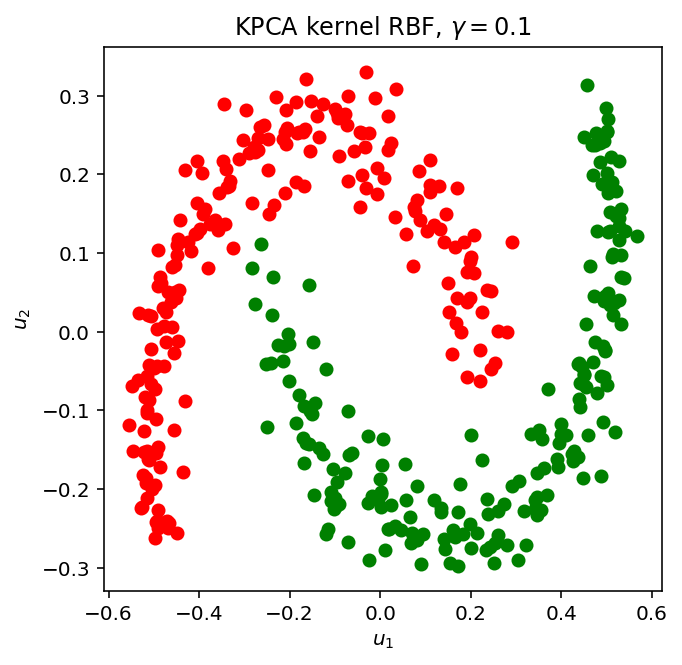

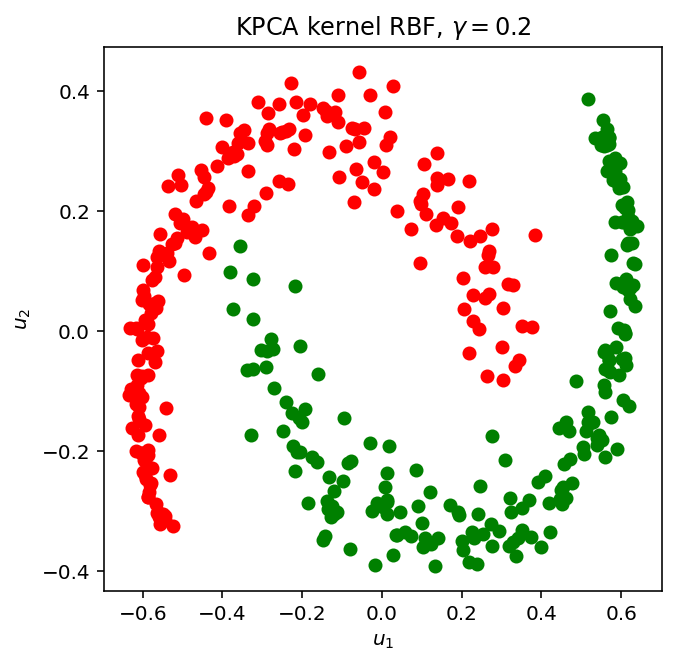

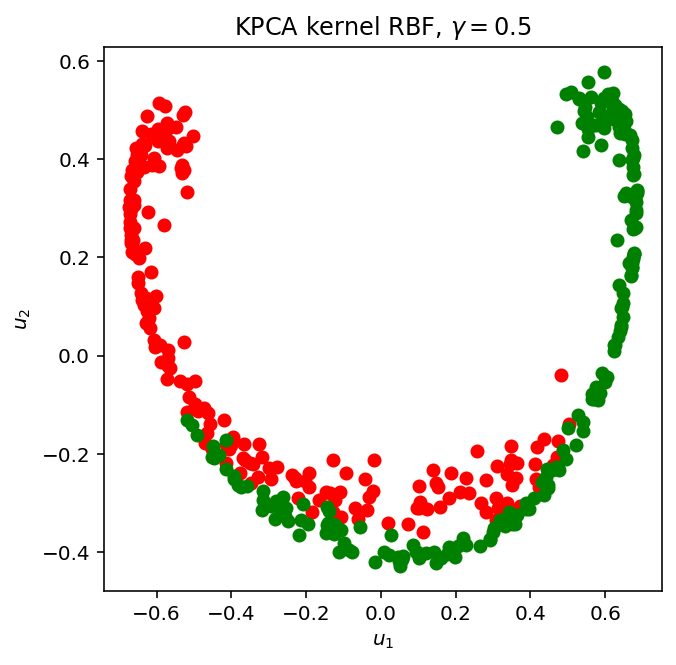

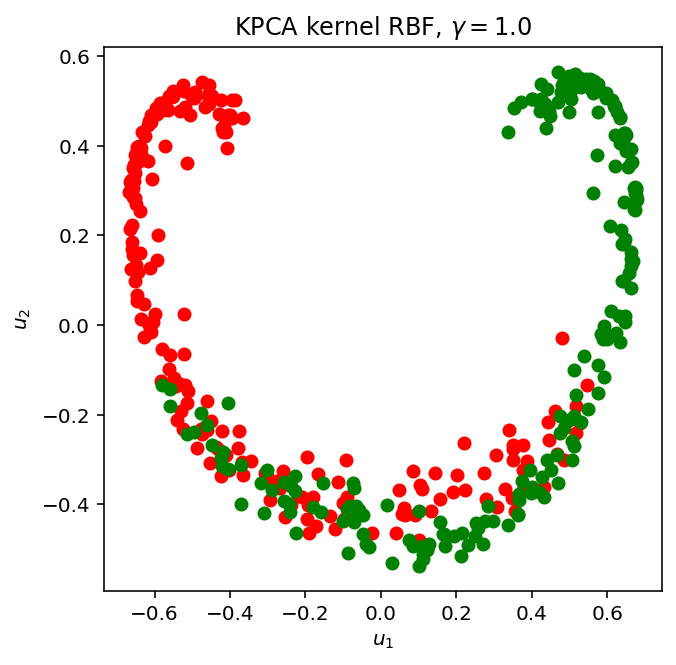

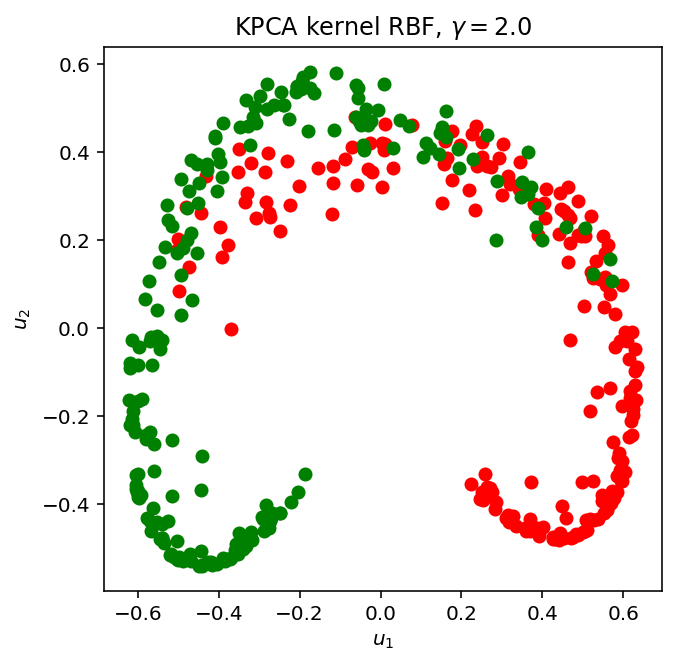

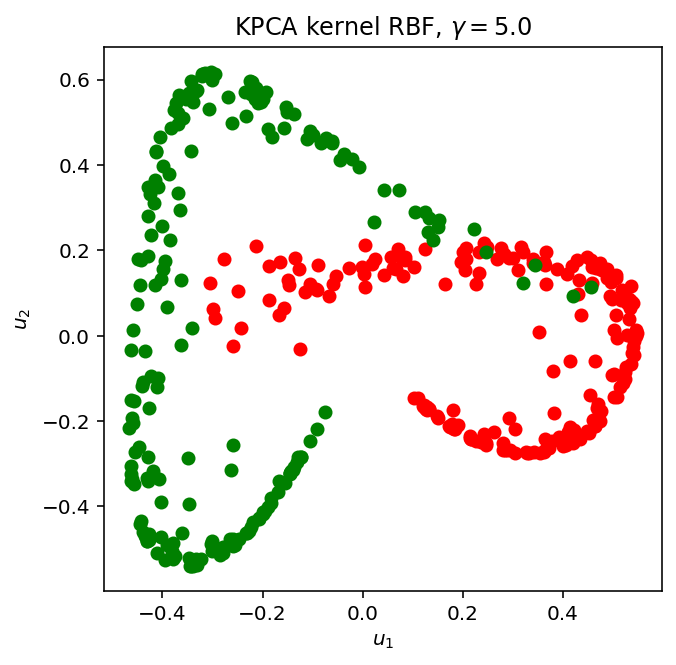

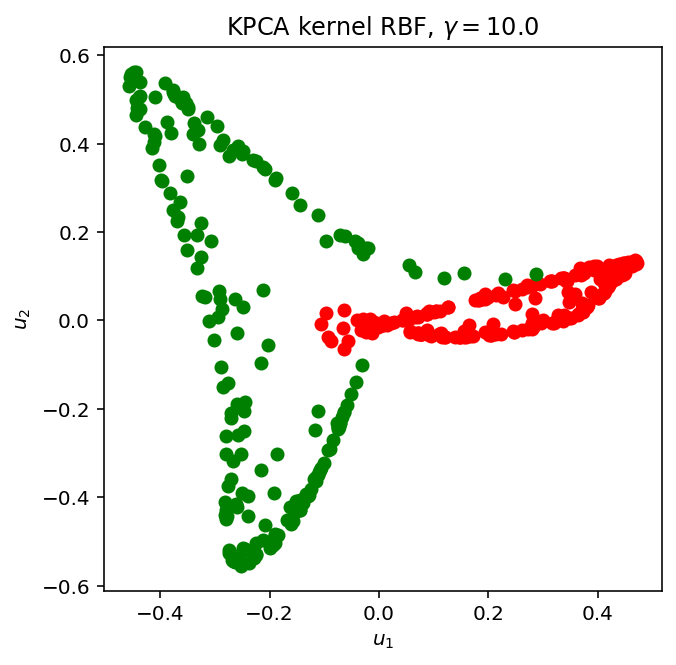

In [169]:
for gamma_value in [.1,.2,.5,1,2,5,10]:
    kpca = KernelPCA(n_components=N_feat_max, kernel='rbf', gamma=gamma_value)
    kpca.fit(Xmoon)
    Pk_ = kpca.transform(Xmoon)
    plt.figure(figsize=(5,5))
    plt.plot(Pk_[reds, 0], Pk_[reds, 1], "ro")
    plt.plot(Pk_[green, 0], Pk_[green, 1], "go")
    plt.xlabel("$u_1$")
    plt.ylabel("$u_2$")
    plt.title('KPCA kernel RBF, $\gamma={0:.1f}$'.format(gamma_value))
    plt.show()

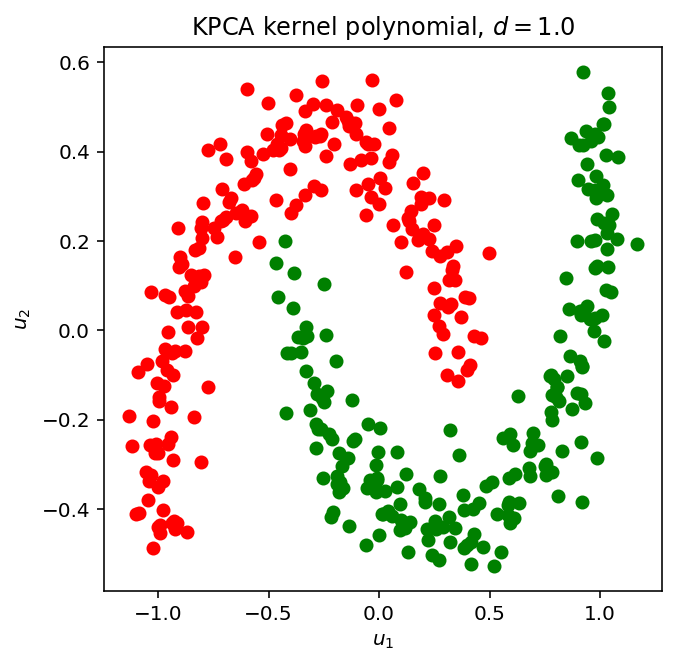

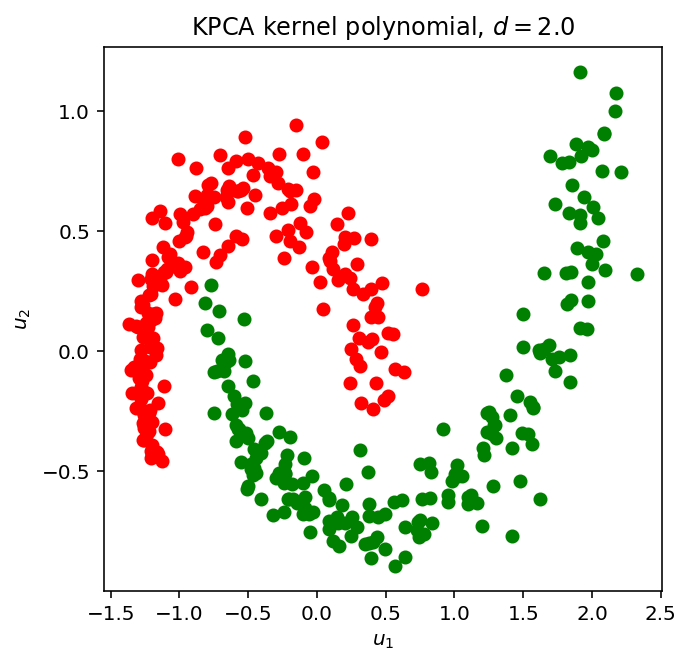

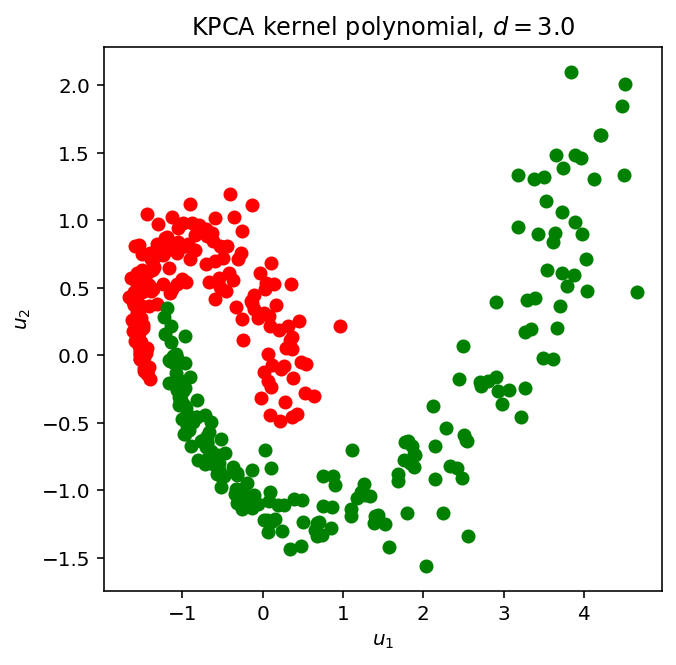

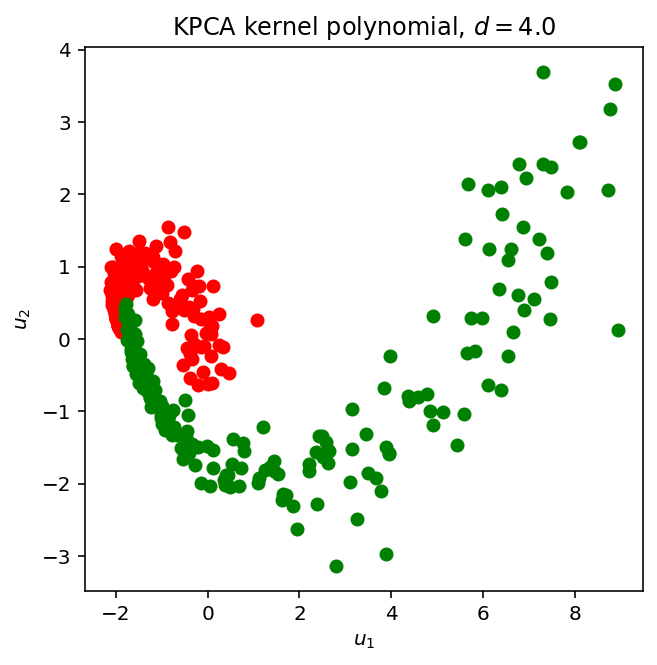

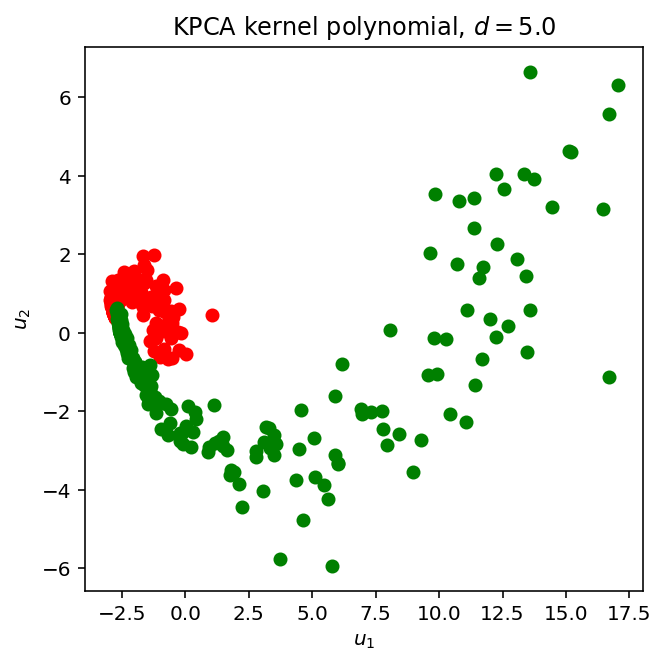

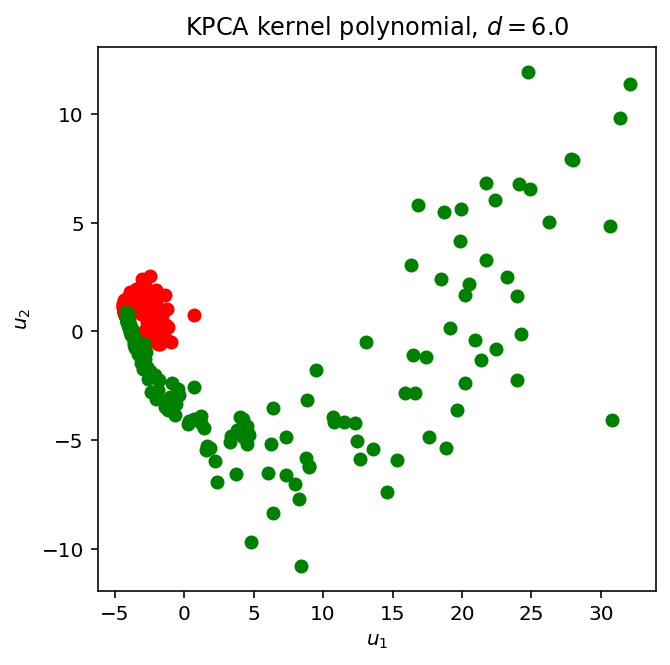

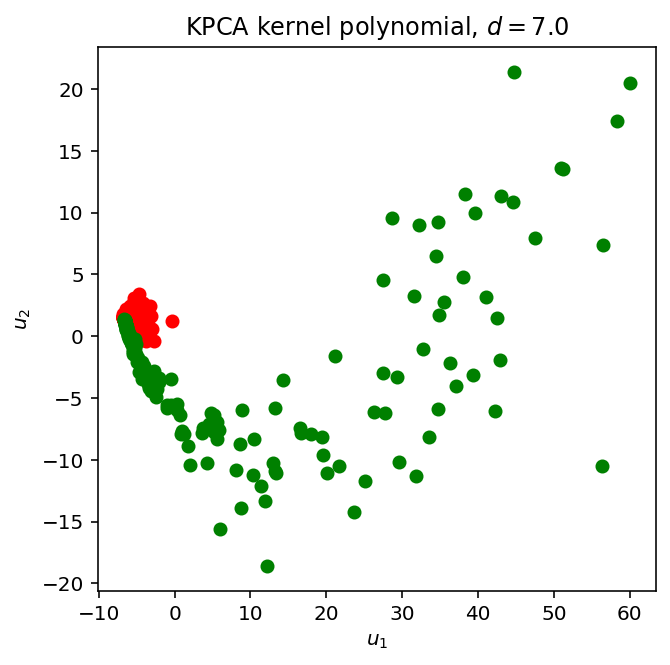

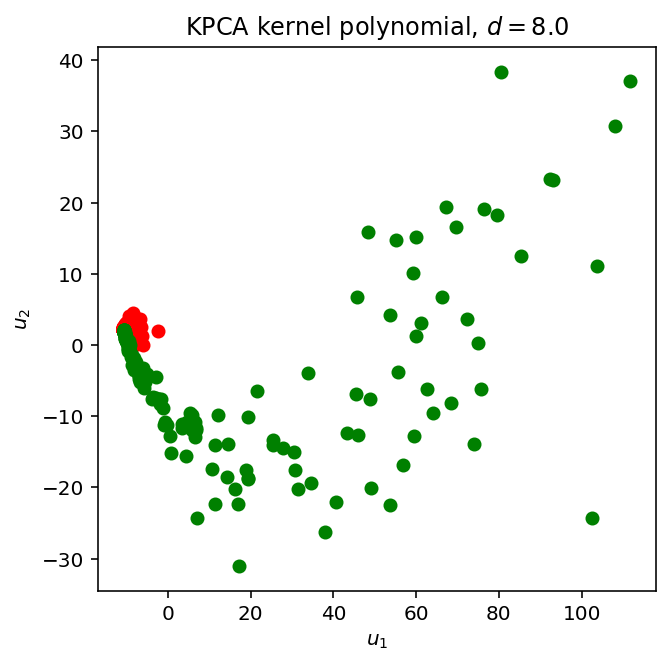

In [172]:
for degree in [1,2,3,4,5,6,7,8]:
    kpca = KernelPCA(n_components=N_feat_max, kernel='poly', degree=degree)
    kpca.fit(Xmoon)
    Pk_ = kpca.transform(Xmoon)
    plt.figure(figsize=(5,5))
    plt.plot(Pk_[reds, 0], Pk_[reds, 1], "ro")
    plt.plot(Pk_[green, 0], Pk_[green, 1], "go")
    plt.xlabel("$u_1$")
    plt.ylabel("$u_2$")
    plt.title('KPCA kernel polynomial, $d={0:.1f}$'.format(degree))
    plt.show()

# 3. Regresión Multivariante


La siguiente sección se centra en problemas de regresión, en los que necesitamos aprender un mapeo de las observaciones a los *targets*, y estos *targets* son números reales. 

En este caso **asumimos** que las observaciones residen en un subespacio de menor dimensionalidad y queremos capturar este subespacio. También puede darse el caso de que en toda la observación haya sólo una parte que esté correlacionada con el target, y queramos capturar las componentes de las observaciones que estén alineadas con el problema de regresión y descartar las demás.

Para realizar análisis multivariante en problemas de regresión tenemos dos opciones fundamentales: hacer primero PCA y la regresión sobre el espacio proyectado o aplicar *Partial Least Squares*, **PLS**, que combina la reducción de la dimensionalidad con la regresión, de modo que las componentes que encuentre PLS optimicen en las dos direcciones.

## Regresión en componentes principales

Consiste en aprovechar la reducción de dimensión realizada por PCA. Si tenemos un problema de regresión definido por un conjunto de datos $\{\mathbf x_i, y_i\}_{i=1}^N$ con $\mathbf x_i \in \mathbb R^p$ e $y_i \in \mathbb R$, en primer lugar transformamos las observaciones al subespacio de dimensión $q$ definido por las $q$ primeras componentes principales:

$$
\mathbf x_i \in \mathbb R^p \rightarrow \mathbf z_i = U\mathbf x_i, \quad  \mathbf z_i \in \mathbb R^q
$$

donde $U$ es la matriz de tamaño $q\times p$ que contiene en sus filas las $q$ primeras componentes principales $\{\mathbf u_j^\top\}_{j=1}^q$.

La regresión lineal en el espacio transformado es equivalente a encontrar parámetros $v_0$ y $\mathbf v$ tales que 

$$
\tilde y_i = v_0 + \mathbf v^\top \mathbf z_i
$$

sea una aproximación de mínimo error cuadrático al *target* real que corresponde a la observación $\mathbf x_i$.

Si asumimos que las observaciones tienen media nula:
$$
v_0 = \frac{1}{N}\sum_{i=1}^Ny_i\quad 
$$


Para resolver el vector de pesos de la regresión lineal, $\mathbf v$, deberíamos construir la matriz de observaciones en el espacio transformado:
$$
Z = \left [ \begin{array}{c} \mathbf z_1^\top \\ \mathbf z_2^\top \\ \vdots \\ \mathbf z_{N-1}^\top \\ \mathbf z_N^\top \end{array}\right ]
$$

y el vector con los targets
$$
\mathbf y= \left [ \begin{array}{c} y_1 \\ y_2 \\ \vdots \\ y_{N-1} \\ y_N \end{array}\right ]
$$

y resolver
$$
\min_{\mathbf v} \frac{1}{2}\|\mathbf y - Z\mathbf v \|^2
$$

mediante la pseudoinversa:
$$
\mathbf v = (Z^\top Z)^{-1}Z^\top \mathbf y
$$


Sin embargo, como las columnas de $Z$ son ortogonales por tratarse de componentes principales, esto es, $X$ se descompone en:
$$
X = R\Lambda U
$$ con $\Lambda$ diagonal de tamaño $p\times p$ conteniendo los autovalores, $U$ ya vimos que es la matriz que tiene las componentes principales en sus filas y $R$ es una matriz ortonormal de tamaño $N\times p$. Cuando usamos sólamente $q < p$ componentes principales estamos aproximando

$$
X \approx R_{:,:q}\Lambda_{q} U_{:q,:}
$$ donde $R_{:,:q}$ son las primeras $q$ columnas de $R$, $\Lambda_{q}$ es la diagonal con los $q$ primeros elementos de la diagonal de $\Lambda$ y $U_{:q,:}$ son las primeras $q$ filas de $U$.

En este caso, $Z=R_{:,:q}\Lambda_{q}$ y por tanto $Z^\top Z$ es diagonal, es decir, que las columnas de $Z$ son ortogonales entre sí.

Teniendo en cuenta estos resultados, la pseudoinversa que nos da $\mathbf v$ se reduce a
$$
(Z^\top Z)^{-1}Z^\top \mathbf y = (\Lambda_{q}(R_{:,:q})^\top R_{:,:q}\Lambda_{q})^{-1}Z^\top \mathbf y= \Lambda_{q}^{-2}Z^\top \mathbf y
$$

Es decir, la regresión en las $q$ dimensiones dadas por las componentes principales se reduce a $q$ regresiones univariantes donde los pesos del regresor vienen dados por
$$
v_j = \frac{\sum_{i=1}^N{y_iZ_{i,j}}}{\lambda_j^2}, \quad j=1,\dots,q 
$$

Además, dado que el PCA y la solución de la regresión lineal son transformaciones lineales de los datos originales, el regresor en componentes principales puede expresarse referenciado a los datos originales.

Para precedir el *target* de una observación de test con el regresor en componentes principales hay que efectuar los siguentes pasos:
- Transformar $\mathbf x_t$ al subespacio definido por las $q$ primeras componentes principales:
$$
\mathbf z_t = U_{:q,:}\mathbf x_t
$$
- Aplicar el regresor
$$
\hat y_t = \mathbf z_t^\top \mathbf v + v_0
$$

Si combinamos los dos cálculos tenemos

$$
\hat y_t = \mathbf x_t^\top(U_{:q,:})^\top \mathbf v + v_0
$$
que es equivalente a suponer que tenemos un regresor lineal actuando sobre los datos originales con vector de pesos $\mathbf w = (U_{:q,:})^\top \mathbf v $ y término de sesgo $v_0$.

## Caso práctico, el conjunto de datos de uso de bicicletas en Seúl

Las siguientes celdas cargan los datos que usamos para trabajar sobre *feature templates* y componen las observaciones agregando a las variables continuas las features de fecha y hora.

In [191]:
import pandas as pd
seoul_bikes_df= pd.read_csv('../FEATURES_FROM_MACHINE_LEARNING/data_seoul_bikes.csv', index_col=0, header=0, parse_dates=['Timestamp'],dtype={'Rented Bike Count': int,
                                                                               'Temperature(C)':float, 
                                                                               'Humidity(%)':float,
                                                                               'Wind speed (m/s)':float, 
                                                                               'Visibility (10m)':float, 
                                                                               'Dew point temperature(C)':float,
                                                                               'Solar Radiation (MJ/m2)':float, 
                                                                               'Rainfall(mm)':float,
                                                                               'Snowfall (cm)':float,
                                                                               'Seasons':str,
                                                                               'Holiday':str, 
                                                                               'Functioning Day':str})
from sklearn.preprocessing import StandardScaler
seoul_train, seoul_test = train_test_split(seoul_bikes_df, 
                                                         test_size=0.2, 
                                                         random_state=42)

Ytrain = seoul_train['Rented Bike Count'].values
Ytest = seoul_test['Rented Bike Count'].values

continuas = ['Temperature(C)',
             'Humidity(%)','Wind speed (m/s)',
             'Visibility (10m)',
             'Dew point temperature(C)',
             'Solar Radiation (MJ/m2)',
             'Rainfall(mm)',
             'Snowfall (cm)']

# escalamos los datos
XX = seoul_train[continuas].values
sc = StandardScaler().fit(XX)
Xtrain_c = sc.transform(XX)
Xtest_c = sc.transform(seoul_test[continuas].values)



In [192]:
from sklearn.feature_extraction import DictVectorizer
dict_train = seoul_train['Timestamp'].apply(dict_month).values
dict_test = seoul_test['Timestamp'].apply(dict_month).values



In [193]:
for tras in [dict_week_day, dict_day, dict_hora]:
    dd_train_v = seoul_train['Timestamp'].apply(tras).values
    dd_test_v = seoul_test['Timestamp'].apply(tras).values
    merge_dicts_in_list(dict_train, dd_train_v)
    merge_dicts_in_list(dict_test, dd_test_v)
    
dv_mes = DictVectorizer(sparse=False)
Xtrain_m = dv_mes.fit_transform(dict_train)
Xtest_m = dv_mes.transform(dict_test)

In [194]:
Xtrain_ = np.hstack((Xtrain_c, Xtrain_m))
Xtest_= np.hstack((Xtest_c, Xtest_m))
scala = StandardScaler()
Xtrain = scala.fit_transform(Xtrain_)
Xtest = scala.transform(Xtest_)

Resultados baseline usando regresión lineal sobre las variables continuas

In [197]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression().fit(Xtrain_c,Ytrain)
print('R^2 train: {0:.3f}'.format(lr.score(Xtrain_c, Ytrain)))
print('R^2 test: {0:.3f}'.format(lr.score(Xtest_c, Ytest)))

R^2 train: 0.395
R^2 test: 0.411


Resultados baseline usando regresión lineal sobre todas las variables 

In [198]:
lr = LinearRegression().fit(Xtrain,Ytrain)
print('R^2 train: {0:.3f}'.format(lr.score(Xtrain, Ytrain)))
print('R^2 test: {0:.3f}'.format(lr.score(Xtest, Ytest)))

R^2 train: 0.579
R^2 test: 0.575


Evolución de los resultados obtenidos con **Regresión en Componentes Principales** para distintos tamaños de espacio reducido

In [201]:
pcr_score_train = np.empty(Xtrain.shape[1]-1)
pcr_score_test = np.empty(Xtest.shape[1]-1)
for nc in range(1,Xtrain.shape[1]):
    pca = PCA(n_components=nc)
    Z_train = pca.fit_transform(Xtrain)
    Z_test = pca.transform(Xtest)
    pcr = LinearRegression().fit(Z_train,Ytrain)
    #print("PCA con {0:d} componentes".format(nc))
    pcr_score_train[nc-1] = pcr.score(Z_train, Ytrain)
    pcr_score_test[nc-1] = pcr.score(Z_test, Ytest)
    #print('R^2 train: {0:.3f}'.format(pcr_score_train[nc-1]))
    #print('R^2 test: {0:.3f}'.format(pcr_score_test[nc-1]))
    #print("")

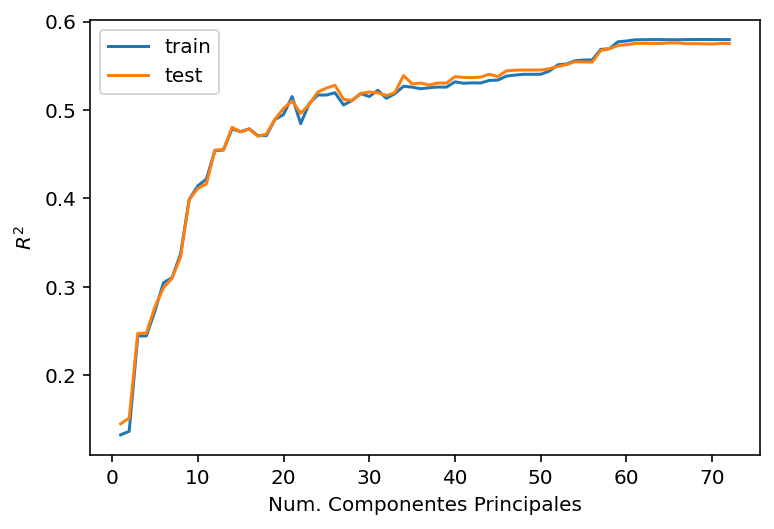

In [203]:
plt.figure()
plt.plot(range(1,Xtrain.shape[1]), pcr_score_train,label='train')
plt.plot(range(1,Xtrain.shape[1]), pcr_score_test,label='test')
plt.xlabel('Num. Componentes Principales')
plt.ylabel('$R^2$')
plt.legend()

usando gridsearch para obtener un número óptimo de componentes por validación

In [204]:
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline

pca_regresor = Pipeline([('pca', PCA()),('lr', LinearRegression())])
pca_nc = [PCA(n_components=nc) for nc in range(1,Xtrain.shape[1])]
grid_params = {'pca':pca_nc}
grid_pca_lr = GridSearchCV(pca_regresor, param_grid=grid_params)

In [205]:
grid_pca_lr.fit(Xtrain, Ytrain)

GridSearchCV(estimator=Pipeline(steps=[('pca', PCA()),
                                       ('lr', LinearRegression())]),
             param_grid={'pca': [PCA(n_components=1), PCA(n_components=2),
                                 PCA(n_components=3), PCA(n_components=4),
                                 PCA(n_components=5), PCA(n_components=6),
                                 PCA(n_components=7), PCA(n_components=8),
                                 PCA(n_components=9), PCA(n_components=10),
                                 PCA(n_components=11), PCA(n_components=12),
                                 PCA(n_c...nts=14),
                                 PCA(n_components=15), PCA(n_components=16),
                                 PCA(n_components=17), PCA(n_components=18),
                                 PCA(n_components=19), PCA(n_components=20),
                                 PCA(n_components=21), PCA(n_components=22),
                                 PCA(n_components=23), PCA(n_co

In [206]:
print(grid_pca_lr.best_params_)

{'pca': PCA(n_components=61)}


In [207]:
print('R^2 train: {0:.3f}'.format(grid_pca_lr.score(Xtrain, Ytrain)))
print('R^2 test: {0:.3f}'.format(grid_pca_lr.score(Xtest, Ytest)))

R^2 train: 0.579
R^2 test: 0.575


## *Partial Least Squares* (PLS)

Esta técnica también construye una transformación lineal del espacio de entrada para resolver la regresión en el espacio transformado, pero a diferencia de la regresión en componentes principales, PLS usa los *targets* del conjunto de entrenamiento para construir la transformación.

PLS sucede en modo iterativo, calculando una componte en cada iteración.

Partimos de una matriz de observaciones de entrenamiento, con cada observación en una fila:
$$
X = \left [ \begin{array}{c} \mathbf x_1^\top \\ \mathbf x_2^\top \\ \vdots \\ \mathbf x_{N-1}^\top \\ \mathbf x_N^\top \end{array}\right ]
$$

y el vector con los targets
$$
\mathbf y= \left [ \begin{array}{c} y_1 \\ y_2 \\ \vdots \\ y_{N-1} \\ y_N \end{array}\right ]
$$


Asumimos que la matriz de datos ha pasado por un `StandardScaler()`, es decir, que las columnas de $X$ tienen media nula y varianza unidad. Las columnas de $X$ se corresponden con las características que definen el espacio de entrada. Vamos a usar la notación $X_j$ para referirnos a la columna $j$ de $X$.





PLS comienza calculando la primera componente principal (fila 1 de la matriz $U$)
$$
U_{1,j} = X_j^\top \mathbf y, \quad j=1,\dots,p
$$

es decir, el producto escalar entre cada columna de $X$ y el vector de *targets*. Como las columnas de $X$ tienen media nula, este producto escalar coincide con la correlación.

A partir de este producto escalar se construye $Z_1$: la primera columna de la matriz de datos proyectados de PLS. $Z_1$ tiene la proyección de todas las observaciones del conjunto de entrenamiento sobre la primera componente extraída $\mathbf u_1 = U_1$:

$$
Z_1 = \sum_{j=1}^p{U_{1,j}X_j}
$$

Cada característica forma parte de la combinación que determina la componente $Z_1$ con **una intensidad proporcional a su correlación con el target**

A continuación se obtiene el coeficiente de hacer la regresión de $\mathbf y$ con $\mathbf Z_1$:
$$
\theta_1 = \frac{Z_1^\top\mathbf y}{Z_1^\top Z_1}
$$

y se ortogonalizan las columnas de $X$ con respecto a $Z_1$ y comienza la siguiente iteración. Expresado en forma algorítmica:

### Algoritmo PLS
* **Entrada**: $X$ matriz de tamaño $N\times p$ con las obervaciones, cada fila es una observación, cada columna $X_j$ una característica; $\mathbf y$ vector con los $N$ *targets*

* **Proceso**:

    1. Inicio
        - Estandarizar cada columna $X_j$
        - $X_j^{(0)} = X_j,\quad j=1\dots,p$
        
        - $\mathbf {\hat y}^{(0)} = \frac{1}{N}\sum_{i=1}^Ny_i \mathbf 1$
    
    2. Bucle para $m=1,\dots,p$
        - $$u_{m,j} = \mathbf y^\top X_j^{(m-1)}, \quad j=1,\dots,p$$
        - $$Z_m = \sum_{j=1}^{p}u_{m,j}X_j^{(m-1)}$$
        - $$\theta_m =\frac{Z_m^\top \mathbf y}{Z_m^\top Z_m}$$
        - $$\mathbf {\hat y}^{(m)} = \mathbf {\hat y}^{(m-1)} + \theta_m Z_m$$
        - $$X_j^{(m)} = X_j^{(m-1)} - \left[ \frac{Z_m^\top X_j^{(m-1)}}{Z_m^\top Z_m}\right]Z_m, \quad j=1,2,\dots,p$$
* **Salida**: Secuencia de predicciones del target $\{\mathbf {\hat y}^{(m)}\}_{m=1}^p$, componentes $\mathbf u_m$, datos transformados  en la matriz $Z$ (de tamaño $N\times q$, $Z_m$ es la columna $m$ de $Z$), coeficientes de los regresores lineales que resuelve $\mathbf {\hat y}^{(m)} = X\mathbf w^{(m)}$, $m=1,\dots,p$


La secuencia de predicciones del target $\{\mathbf {\hat y}^{(m)}\}_{m=1}^p$ está formada por las sucesivas aproximaciones al vector de *targets* original $\mathbf y$ que se consiguen al ir incorporando a la regresión cada una de las componentes $\mathbf u_m$.

Dado que PLS realiza exclusivamente transformaciones lineales, es posible recuperar los pesos del regresor $\mathbf w^{(m)}$ que obtendría cada aproximación del target $\mathbf {\hat y}^{(m)}$ como una combinación lineal de las variables originales. Es decir
$$
\begin{array}{lcl}\mathbf {\hat y}^{(1)} &= &X\mathbf w^{(1)} \\\mathbf {\hat y}^{(2)} &= &X\mathbf w^{(2)} \\ \vdots & \vdots & \vdots \\  \mathbf {\hat y}^{(p)} &= &X\mathbf w^{(p)} \end{array}
$$

### Función que optimiza PLS

La componente $\mathbf u_m$ se obtiene de resolver el siguiente problema de optimización:
$$
\max_{\mathbf u} \mbox{Corr}^2(\mathbf y, X\mathbf u)\mbox{Var}(X\mathbf u)
$$
sujeto a
$$
\mathbf u^\top \mathbf u=1, \mathbf u^\top \mathbf C_{XX}\mathbf u_l =0, \quad l=1,\dots, m-1
$$

Es decir, queremos maximizar la correlación con el target (buena regresión) y también capturar el máximo de varianza posible de los datos originales, a la vez que imponemos las restricciones de que las componentes tengan norma 1 y sean ortogonales a las componentes que se han extraído hasta esa iteración.

### PLS en scikit learn

Hay varias clases que implementan PLS en scikit learn. El algoritmo que hemos visto aquí lo implementa la clase [PLSRegression](https://scikit-learn.org/stable/modules/generated/sklearn.cross_decomposition.PLSRegression.html).

In [208]:
from sklearn.cross_decomposition import PLSRegression

Aplicamos PLS a los datos de Seúl, primero a las variables continuas

In [209]:
pls1 = PLSRegression(n_components=8)
pls1.fit(Xtrain_c, Ytrain)

PLSRegression(n_components=8)

In [210]:
print('R^2 train: {0:.3f}'.format(pls1.score(Xtrain_c, Ytrain)))
print('R^2 test: {0:.3f}'.format(pls1.score(Xtest_c, Ytest)))

R^2 train: 0.395
R^2 test: 0.411


Evolución del score con el número de componentes extraídas

In [211]:
pls_score_train = np.empty(Xtrain.shape[1]-1)
pls_score_test = np.empty(Xtest.shape[1]-1)
for nc in range(1,Xtrain.shape[1]):
    pls1 = PLSRegression(n_components=nc).fit(Xtrain, Ytrain)
    #print("PLS con {0:d} componentes".format(nc))
    pls_score_train[nc-1] = pls1.score(Xtrain, Ytrain)
    pls_score_test[nc-1] = pls1.score(Xtest, Ytest)
    #print('R^2 train: {0:.3f}'.format(pls_score_train[nc-1]))
    #print('R^2 test: {0:.3f}'.format(pls_score_test[nc-1]))
    #print("")

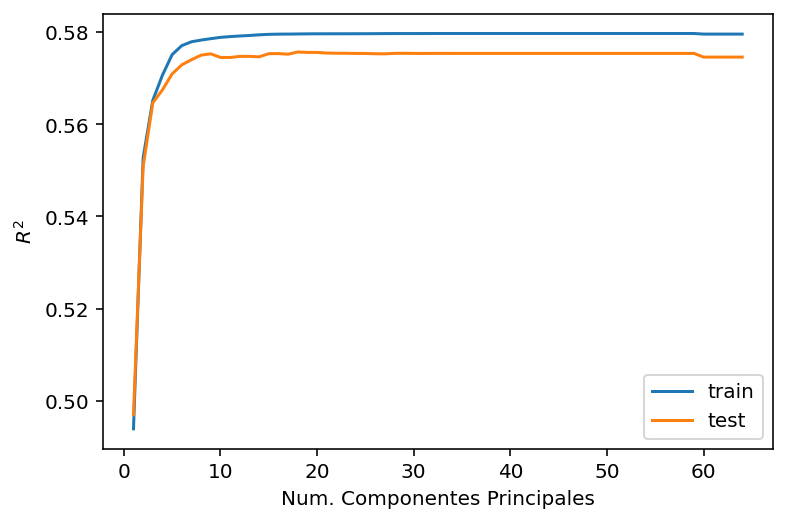

In [213]:
plt.figure()
plt.plot(range(1,65), pls_score_train[:64],label='train')
plt.plot(range(1,65), pls_score_test[:64],label='test')
plt.xlabel('Num. Componentes Principales')
plt.ylabel('$R^2$')
_=plt.legend()

Optimizar el número de componentes con CV

In [214]:
grid_pls = GridSearchCV(PLSRegression(), param_grid={'n_components':range(1,Xtrain.shape[1])})
grid_pls.fit(Xtrain, Ytrain)

GridSearchCV(estimator=PLSRegression(),
             param_grid={'n_components': range(1, 73)})

In [215]:
print('R^2 train: {0:.3f}'.format(grid_pls.score(Xtrain, Ytrain)))
print('R^2 test: {0:.3f}'.format(grid_pls.score(Xtest, Ytest)))

R^2 train: 0.580
R^2 test: 0.576


In [216]:
grid_pls.best_params_

{'n_components': 19}

## Comparativa PCR, LASSO, Ridge, PLS


Vamos a comparar los 4 modelos de regresión lineal que hemos visto durante el curso en el conjunto de datos de uso de bicicletas de Seúl

In [217]:
from sklearn.linear_model import Ridge, Lasso


Valores de `alpha` para las regularizaciones de `Ridge` y `Lasso`

In [218]:
v_alpha = [1e-2,.02,.05,1e-1,.2,.5,1,2,5,10,20,50]


Entrenamos y evaluamos Ridge Regression

In [219]:
grid_rr = GridSearchCV(Ridge(), param_grid={'alpha':v_alpha}).fit(Xtrain, Ytrain)
print('R^2 train: {0:.3f}'.format(grid_rr.score(Xtrain, Ytrain)))
print('R^2 test: {0:.3f}'.format(grid_rr.score(Xtest, Ytest)))

R^2 train: 0.580
R^2 test: 0.576


In [ ]:
Entrenamos y evaluamos Lasso Regression

In [220]:
grid_lasso = GridSearchCV(Lasso(max_iter=100000, tol=.1), param_grid={'alpha':v_alpha}).fit(Xtrain, Ytrain)

In [221]:
print('R^2 train: {0:.3f}'.format(grid_lasso.score(Xtrain, Ytrain)))
print('R^2 test: {0:.3f}'.format(grid_lasso.score(Xtest, Ytest)))

R^2 train: 0.580
R^2 test: 0.575


Imprimimos el vector de pesos para dar una idea de la dispersión

In [222]:
grid_lasso.best_estimator_.coef_

array([ 295.46638202, -131.17908092,   -6.30978176,   20.17178263,
         22.52401899,   39.81588232,  -61.54974952,    2.16016566,
         42.52449927,   10.24259123,  -22.30633216,  -25.35460384,
          8.47400841,   29.79962099,   -8.36335613,   -3.28306468,
         14.28276173,  -33.48998535,   18.11287509,  -13.2971418 ,
         -8.35652287,   10.21132851,    1.37504269,  -19.15312559,
        -48.97519583,  -11.78219012,    4.41885455,  -12.3847415 ,
          2.61324938,  -26.60094707,   -6.87208656,  -18.59909406,
        -15.05817543,   -2.94503662,  -18.42522619,   -4.93217333,
         15.81813312,   37.43135064,   34.35039583,   40.07519432,
         -7.23074991,  -17.04700693,  -10.91934939,  -31.49011774,
        -51.31324187,    4.62898959,  -26.23403239,   -9.72919853,
         38.05044957,   12.59180991,  -15.62743132,   19.49027925,
         -4.3494008 ,   -0.36478035,   20.35879023,   42.78189141,
          1.21067067,    6.27517735,  -15.67738714,   -0.     

Vamos a jugar con la regularización a ver si conseguimos un patrón de dispersión con Lasso

In [231]:
v_alpha = [.05,.5,1,2,5,10,20,50]
lasso_score_train = np.empty(len(v_alpha))
lasso_score_test = np.empty(len(v_alpha))
lasso_nc = np.empty(len(v_alpha))
for ia, aa in enumerate(v_alpha):
    ls = Lasso(alpha=aa,max_iter=100000, tol=.01).fit(Xtrain, Ytrain)
    lasso_score_train[ia] = ls.score(Xtrain, Ytrain)
    lasso_score_test[ia] = ls.score(Xtest, Ytest)
    lasso_nc[ia] = np.sum(np.absolute(ls.coef_)>0)

In [233]:
print('Numeros de coeficientes no nulos para cada alpha')
print(lasso_nc)

Numeros de coeficientes no nulos para cada alpha
[66. 65. 63. 57. 50. 41. 31.  9.]


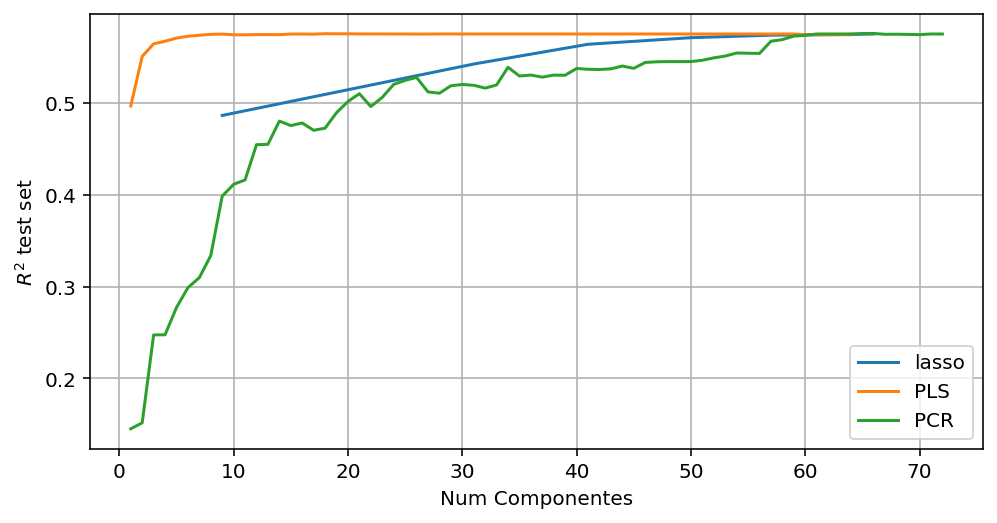

In [227]:
plt.figure(figsize=(8,4))
plt.plot(lasso_nc, lasso_score_test,label='lasso')
plt.plot(range(1,65), pls_score_test[:64],label='PLS')
plt.plot(range(1,Xtrain.shape[1]), pcr_score_test,label='PCR')
plt.legend()
plt.grid()
plt.xlabel('Num Componentes')
_=plt.ylabel('$R^2$ test set')

#### Vectores de pesos en el espacio original



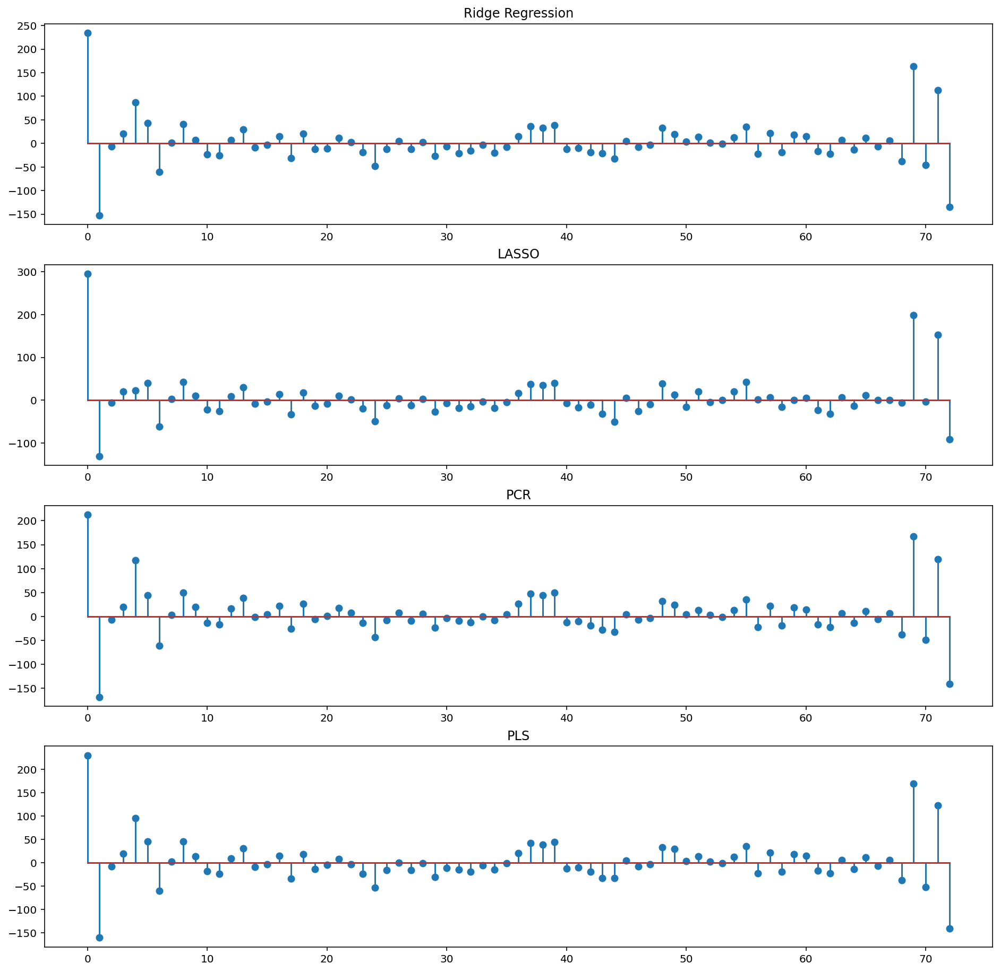

In [228]:
ff,aa = plt.subplots(4,1,figsize=(16,16))
aa[0].stem(grid_rr.best_estimator_.coef_)
aa[0].set_title('Ridge Regression')

aa[1].stem(grid_lasso.best_estimator_.coef_)
aa[1].set_title('LASSO')

pesos_pcr = grid_pca_lr.best_estimator_['pca'].components_.T.dot(grid_pca_lr.best_estimator_['lr'].coef_)
aa[2].stem(pesos_pcr)
aa[2].set_title('PCR')

pesos_pls = grid_pls.best_estimator_.coef_
aa[3].stem(pesos_pls)
_=aa[3].set_title('PLS')


#### Vectores de pesos en el espacio reducido


In [235]:
grid_pls.best_estimator_.y_loadings_

array([[ 0.42527905, -0.17335725, -0.08944668, -0.0691053 , -0.07170815,
         0.04305029, -0.02731493,  0.01745817,  0.01729882, -0.02214458,
        -0.01422245, -0.01518579,  0.01307608, -0.01877874,  0.01108213,
        -0.00690924, -0.00420839,  0.00651167, -0.0067583 ]])

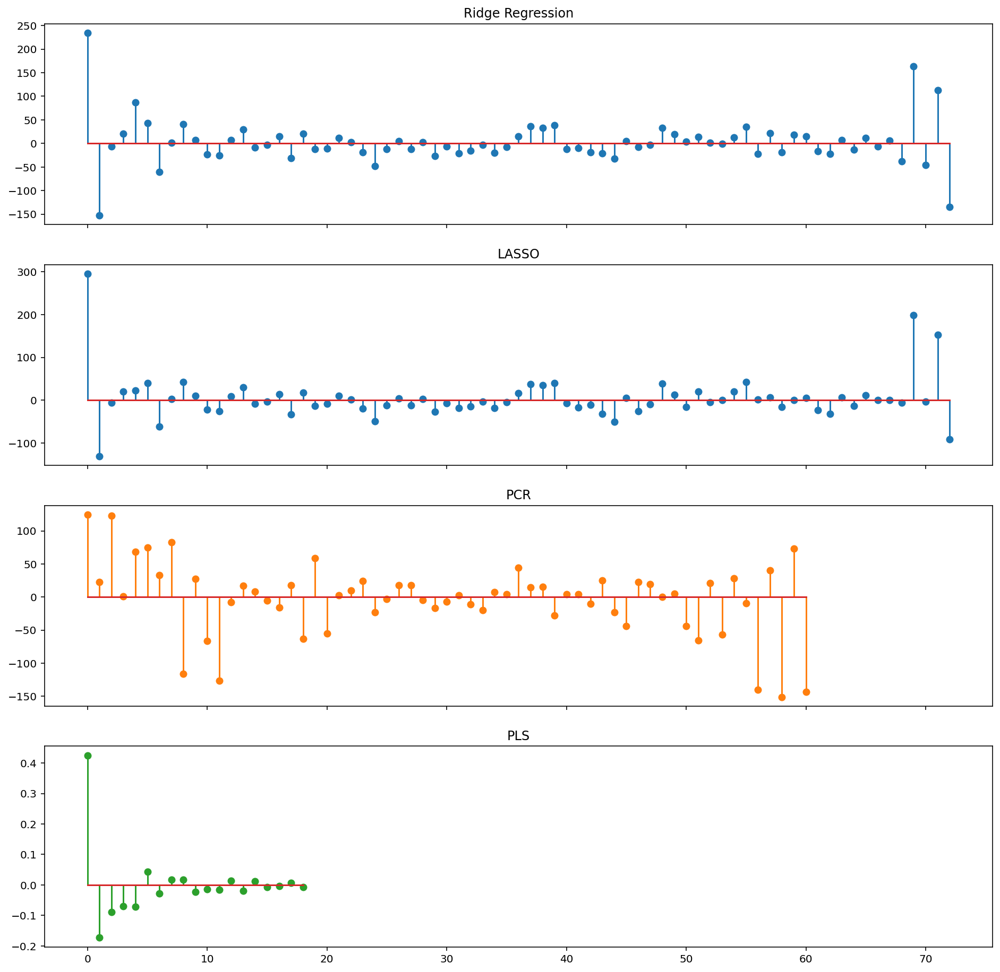

In [243]:
ff,aa = plt.subplots(4,1,figsize=(16,16),sharex=True)
aa[0].stem(grid_rr.best_estimator_.coef_)
aa[0].set_title('Ridge Regression')

aa[1].stem(grid_lasso.best_estimator_.coef_)
aa[1].set_title('LASSO')

pesos_pcr = grid_pca_lr.best_estimator_['lr'].coef_
aa[2].stem(pesos_pcr,linefmt='C1-',markerfmt='C1o')
aa[2].set_title('PCR')

pesos_pls = grid_pls.best_estimator_.y_weights_[0]
aa[3].stem(pesos_pls,linefmt='C2-',markerfmt='C2o')
_=aa[3].set_title('PLS')
